<a name = "inicio"></a>
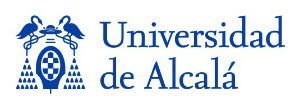

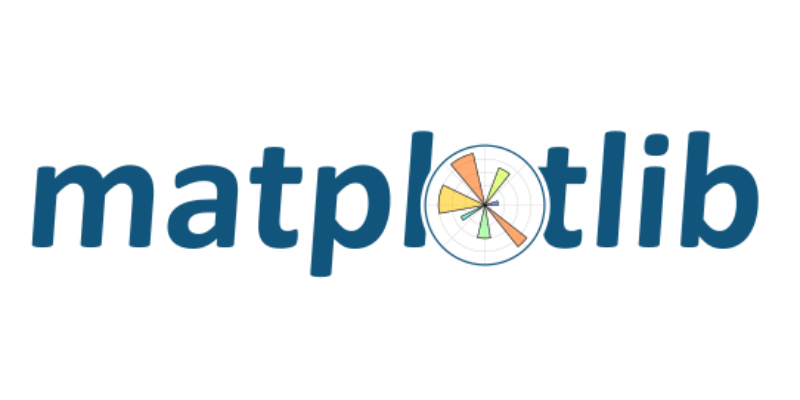

# Índice
1. [Presentación](#Presentación)
1. [Nomenclatura](#Nomenclatura)
1. [Interfaces de programación](#Interfaces-de-programación)
1. [La función plot](#La-función-plot)
1. [Creación y personalización de figuras](#Creación-y-personalización-de-figuras)
1. [Creación y personalización de ejes](#Creación-y-personalización-de-ejes)
1. [Personalización de otros elementos](#Personalización-de-otros-elementos)
1. [Estilos y mapas de color](#Estilos-y-mapas-de-color)
1. [Adición de otros elementos gráficos](#Adición-de-otros-elementos-gráficos)
1. [Gráficos estáticos vs. dinámicos](#Gráficos-estáticos-vs.-dinámicos)
1. [Gráficos en 2D](#Gráficos-en-2D)
1. [Gráficos en 3D](#Gráficos-en-3D)
1. [Imágenes](#Imágenes)
1. [Mapas](#Mapas)
1. [Guardando las figuras en disco](#Guardando-las-figuras-en-disco)
1. [Conclusión](#Conclusión)

# Presentación
<div style = "float:right"><a style="text-decoration:none" href = "#inicio">Inicio</a></div>

matplotlib es la librería de visualización más popular de Python. Su primera versión se remonta al año 2003, y esto puede ser considerado a la vez tanto una fortaleza como una debilidad. Es cierto que, con el tiempo, matplotlib se ha instaurado como la librería de visualización de referencia y, de hecho, otras muchas librerías han desarrollado sus herramientas de visualización sobre matplotlib: seaborn, ggplot... incluso pandas basa en matplotlib sus herramientas de visualización (los DataFrames poseen el método *plot* importado de matplotlib que permite crear y personalizar con cierta facilidad una gráfica con los datos contenidos en el DataFrame). Pero también es cierto que, con el paso de los años, matplotlib ha sido superada por las librerías mencionadas (seaborn, ggplot) y por otras (Bokeh, Plotly) que ofrecen visualizaciones más atractivas o unas interfaces más coherentes y amigables. En cualquier caso, es esa dependencia que tienen muchas librerías con respecto a matplotlib lo que hace más que conveniente el conocimiento de matplotlib: las librerías de más alto nivel diseñadas sobre ésta no siempre ofrecen toda la funcionalidad que necesitamos y, cuando queremos afinar en el diseño de una visualización, frecuentemente no nos queda más remedio que acudir directamente a matplotlib.

Otra de las fortalezas de matplotlib es su compatibilidad con diferentes sistemas operativos y entornos en los que se ejecuta, lo que ayudó a su rápida adopción por parte de la comunidad.

De lo dicho que deduce que matplotlib es una librería de bajo nivel, muy potente y extensa pero que puede resultar un tanto confusa al principio. Ofrece herramientas para la creación de visualizaciones en 2D, aunque se completa con el uso de otros add-ons que permiten la generación de gráficas 3D (mplot3d) y mapas (basemap).

Podemos acceder a la documentación completa en el sitio web oficial de matplotlib:

https://matplotlib.org/

La mayoría de las funciones de matplotlib están localizadas en la sublibrería *pyplot*, que suele importarse con el alias **plt**:

In [1]:
import matplotlib.pyplot as plt

En algún caso es necesario trabajar directamente con la librería *matplotlib*, que suele importarse con el alias **mpl**:

In [2]:
import matplotlib as mpl

Además de importar matplotlib importamos también la librería **NumPy** -la utilizaremos con sencillos arrays y para generar conjuntos de datos aleatorios-, y fijamos una semilla para el generador de números aleatorios de esta librería. También importamos la librería **pandas** pues haremos uso de dataframes en algunos de los ejemplos.

In [3]:
import numpy as np
import pandas as pd
import seaborn as sns

In [4]:
np.random.seed(18)

# Nomenclatura
<div style = "float:right"><a style="text-decoration:none" href = "#inicio">Inicio</a></div>

Aunque resultaría posible comenzar a generar gráficas con la función [matplotlib.pyplot.plot](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.plot.html), creo que resulta mucho más conveniente saber qué estamos haciendo cuando generamos una gráfica de ese u otro modo. Veamos el resultado de una visualización típica:

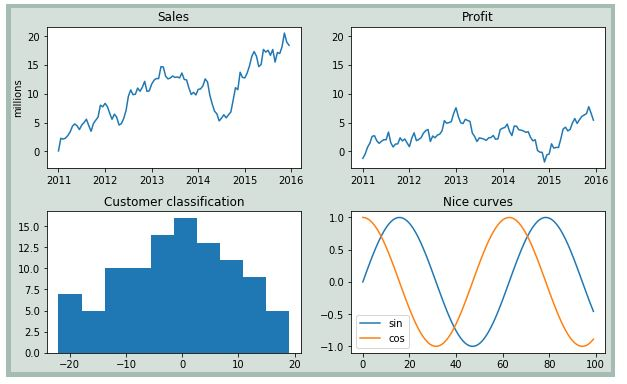

En esta imagen vemos cómo hemos generado 4 sencillas gráficas dispuestas en una matriz de 2x2. Pues bien, el primero de los conceptos a aprender es el de *figura* (figure en inglés). Ésta es el espacio que abarca las cuatro gráficas y que, en este ejemplo, se muestra de color verdoso con un borde verde un poco más fuerte. Es decir, en la imagen anterior, la figura sería la siguiente:

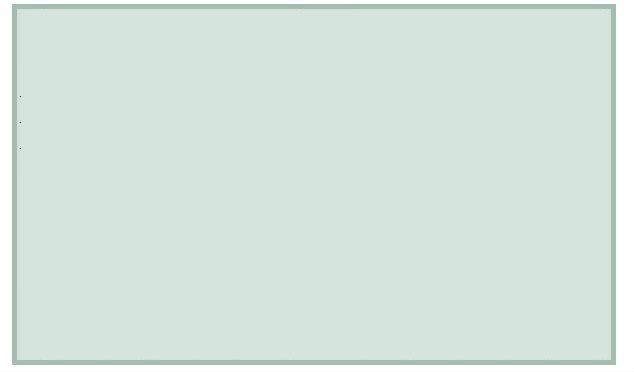

Dentro de la figura nos encontramos con las cuatro mencionadas gráficas, cada una de las cuales se ha creado sobre un conjunto de ejes (*axes* en inglés). Se muestran a continuación los cuatro conjuntos de ejes:

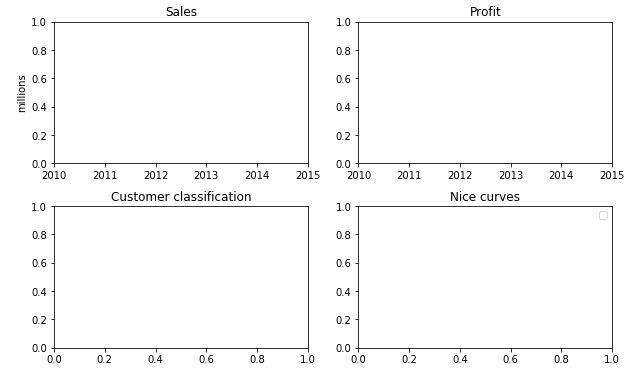

Vemos que del concepto "ejes" no dependen solo lo que, desde un punto de vista puramente matemático calificaríamos de "ejes" (las líneas ortogonales que definen las referencias para las dos dimensiones involucradas), sino también cosas como el título de la gráfica, las marcas en los ejes (lo que en matplotlib se denominan *ticks*), etc. Obsérvese que hablamos de "conjuntos de ejes", en plural, tal y como se hace en la documentación original: Por lo tanto, podríamos decir que en la imagen de este ejemplo tenemos cuatro conjuntos de ejes. Veremos más adelantes que en matplotlib también existe el concepto de "eje" en singular ("*axis*").

Por último, dentro de cada conjunto de ejes encontramos lo que vamos a llamar gráfica (referido con el nombre de *plot* en la literatura en inglés). Estas serían las cuatro gráficas generadas:

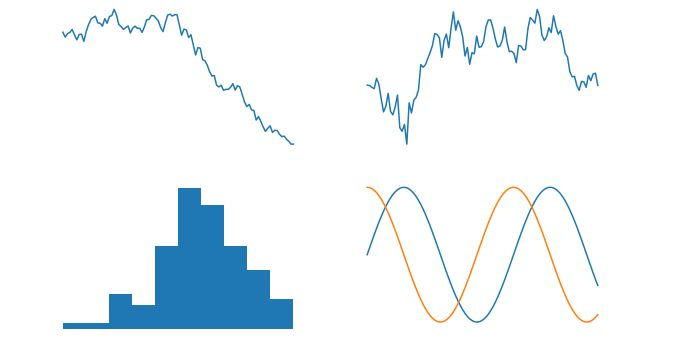

Del concepto de "gráfica" dependen cosas como el color de la gráfica, el ancho de la línea usada, etc.

Pues bien, la primera lección a extraer es que, para crear una gráfica es necesario crear una figura y, al menos, un conjunto de ejes. Solo cuando tenemos ambos objetos creados, es posible crear la gráfica.

###### La función plot

Y hay diferentes formas de crear una figura y un conjunto de ejes. Así, por ejemplo, la función [matplotlib.pyplot.plot](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.plot.html) crea de forma automática una figura y un conjunto de ejes y muestra la gráfica correspondiente a los datos que le hemos pasado como argumentos

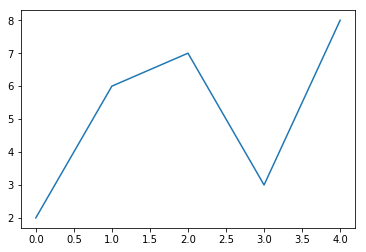

In [5]:
plt.plot([2, 6, 7, 3, 8])
plt.show()

(como veremos más adelante, [matplotlib.pyplot.show](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.show.html) muestra la gráfica creada, aunque su comportamiento exacto dependerá del entorno en el que estemos creando la gráfica).

Este método, por muy sencillo que parezca, es el que nos ofrece la menor capacidad de personalización.

###### La función subplots

Otra opción es utilizar la función [matplotlib.pyplot.subplots](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.subplots.html) para crear una figura y uno o más conjuntos de ejes (por defecto se crea uno solo):

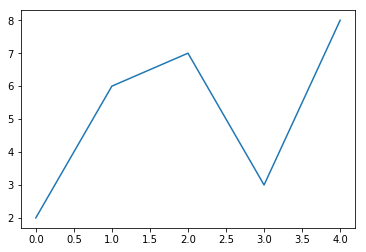

In [6]:
fig, ax = plt.subplots()
ax.plot([2, 6, 7, 3, 8])
plt.show()

Vemos cómo la función devuelve una referencia a la figura y otra al conjunto de ejes (en este ejemplo se ha creado solo un conjunto de ejes, por lo que la variable *ax* almacena una referencia a ellos. Si se hubiesen creado más de un conjunto de ejes, la variable *ax* sería una lista de referencias a cada uno de los ejes. Veremos esto con más profundidad un poco más adelante).

###### Las funciones figure y axes

Un tercer método (hay otros) sería utilizar la función [matplotlib.pyplot.figure](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.figure.html) para crear de forma explícita una figura, y la función [matplotlib.pyplot.axes](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.axes.html) para crear de forma explícita un conjunto de ejes en la última figura que se haya creado o referenciado (lo que se denomina la "figura actual").

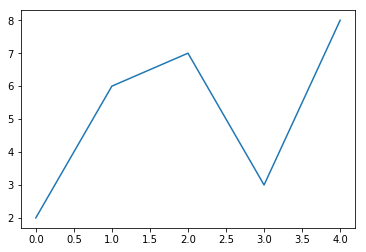

In [7]:
fig = plt.figure()
ax = plt.axes()
ax.plot([2, 6, 7, 3, 8])
plt.show()

En función del método usado dispondremos de más o menos herramientas para personalizar nuestra visualización. A lo largo de las próximas secciones veremos las más importantes.

# Interfaces de programación
<div style = "float:right"><a style="text-decoration:none" href = "#inicio">Inicio</a></div>

Un tema que suele confundir al usuario de matplotlib es la variedad de métodos que hay para conseguir un objetivo. Y es que matplotlib ofrece dos interfaces de programación (digamos, dos estilos distintos para crear y personalizar las gráficas): un estilo denominado "MATLAB" (pues se asemeja a la interfaz de este software) y otro denominado "orientado a objetos".

###### Interfaz estilo MATLAB

Python fue desarrollado como una alternativa a MATLAB para usuarios de Python, y esto queda en evidencia cuando analizamos el conjunto de herramientas ofrecidas en este estilo de programación. La mayor parte de estas herramientas se ofrecen como funciones de la sublibrería *pyplot* (que hemos importado con el alias *plt*). Veamos un ejemplo:

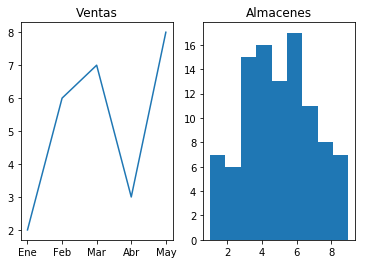

In [8]:
plt.figure()
plt.subplot(1, 2, 1)
plt.plot([2, 6, 7, 3, 8])
plt.title("Ventas")
plt.xticks(range(0,5), ["Ene", "Feb", "Mar", "Abr", "May"])
plt.subplot(1, 2, 2)
plt.hist(np.random.randint(1, 10, 100), bins = 9)
plt.title("Almacenes")
plt.show()

Estas dos gráficas se han creado usando funciones de *matplotlib.pyplot*. Es importante destacar que una vez que se ha personalizado el primer conjunto de ejes y la primera gráfica (la de la izquierda) y hemos comenzado a crear el segundo conjunto de ejes (el del histograma de la derecha), ya no hay forma de modificar nada de la primera gráfica, pues matplotlib mantiene lo que podemos denominar unos "ejes actuales" y, una vez se crea el segundo conjunto de ejes, esos "ejes actuales" pasan a ser los nuevos y, usando esta interfaz, no hay forma alguna de volver a referenciar los anteriores.

###### Interfaz orientada a objetos (OO)

Utilizando este segundo estilo, vamos a referenciar la figura y los ejes mediante variables y serán métodos y atributos de estas variables los que nos permitirán personalizar la visualización. Por ejemplo, el código equivalente a la figura anterior sería el siguiente:

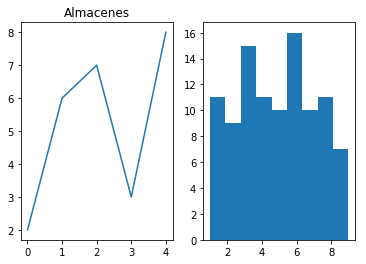

In [9]:
fig, ax = plt.subplots(1, 2)
ax[0].plot([2, 6, 7, 3, 8])
ax[0].set_title("Ventas")
ax[0].set_xticks(range(0,5), ["Ene", "Feb", "Mar", "Abr", "May"])
ax[1].hist(np.random.randint(1, 10, 100), bins = 9)
ax[0].set_title("Almacenes")
plt.show()

En este caso, las variables *fig* y *ax* nos servirán para personalizar todas las gráficas a crear en la figura. Vemos que la única función que hemos utilizado ha sido la primera, **plt.subplots**, para crear la figura y los dos conjuntos de ejes (bueno, y **plt.show**), y el resto de instrucciones son métodos que ejecutamos sobre dichos objetos.

La mayor parte de los métodos que nos permiten fijar un valor a un atributo comienza por "*set_*". Estos métodos suelen tener un método equivalente que comienza habitualmente por "*get_*" que sirve para leer el valor de dicho atributo.

Este segundo estilo orientado a objetos nos da mayor control sobre las visualizaciones que creemos. En el resto del tutorial utilizaremos ambos enfoques, especificando -allí donde se considere apropiado- la forma en la que cada uno de los estilos obtiene un objetivo.

# La función plot
<div style = "float:right"><a style="text-decoration:none" href = "#inicio">Inicio</a></div>

Antes de comenzar a crear y personalizar figuras y ejes, dediquemos unos minutos a la función [matplotlib.pyplot.plot](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.plot.html). Ésta no es la única función que genera una gráfica -ya ha asomado en uno de los ejemplos la función [matplotlib.pyplot.hist](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.hist.html)) pero, sin duda, es la principal y más básica función, y todo lo que aprendamos sobre ella será aplicable a otras funciones semejantes.

La función plot recibe un conjunto de valores x e y y los muestra en el plano definido por los ejes como puntos unidos por líneas:

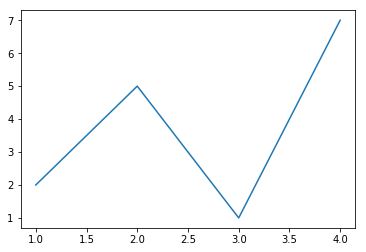

In [10]:
x = [1, 2, 3, 4]
y = [2, 5, 1, 7]
plt.plot(x, y)
plt.show()

Si no se indica el argumento x, se asigna un conjunto de valores por defecto formado por números enteros desde 0 hasta n-1, siendo n el número de puntos a mostrar (es decir, la longitud de y):

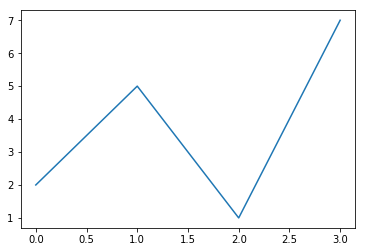

In [11]:
y = [2, 5, 1, 7]
plt.plot(y)
plt.show()

En el ejemplo de la figura anterior, tenemos 4 puntos a mostrar, y el eje x -tal y como cabría esperar- muestra marcas entre el valor 0 y el valor 3.

Es importante que ejecutemos la función *plt.show()* al final del código. Si no lo hacemos, el código devolverá el resultado en forma de texto (haciendo referencia al conjunto de líneas o bloques gráficos que se han generado), algo como:

[<matplotlib.lines.Line2D at 0x1bc78210588>]

Al ejecutar la función *plt.show()*, forzamos que el resultado se muestre como imagen, que es lo que queremos.

Hay ocasiones en las que, aunque no incluyamos la función *plt.show()* al final del código, se muestra la gráfica, pero junto a una salida de texto semejante a la mostrada. Por ejemplo:

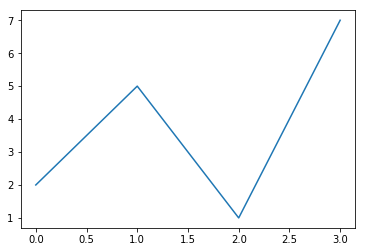

In [12]:
plt.plot([2, 5, 1, 7])

En estos casos, basta con añadir la función *plt.show()* al final o un punto y coma al final de la función plot para que desaparezca la salida de texto -que poca información nos aporta-:

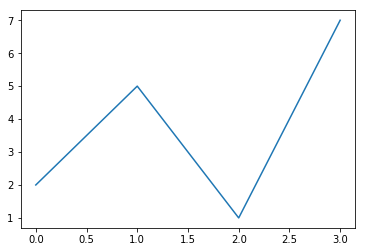

In [13]:
plt.plot([2, 5, 1, 7]);

Si ejecutamos dos o más veces la función *plot* antes de ejecutar la función *show*, todas las gráficas se mostrarán en el mismo conjunto de ejes:

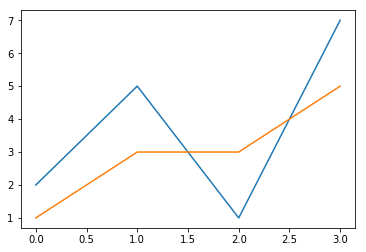

In [14]:
plt.plot([2, 5, 1, 7])
plt.plot([1, 3, 3, 5])
plt.show()

Si no especificamos los colores de cada gráfica, matplotlib escoge colores ya predefinidos.

Este conjunto de ejes y la figura dentro de la cual se muestran son creados automáticamente con la primera ejecución de *plot*, y se mantendrá dicha figura activa hasta que se muestren las gráficas con la función *show*. Si, posteriormente, volvemos a ejecutar la función *plot*, se creará una nueva figura y un nuevo conjunto de ejes. En el siguiente ejemplo vamos a hacer exactamente esto:

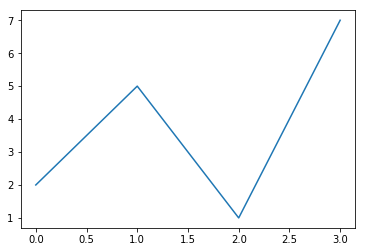

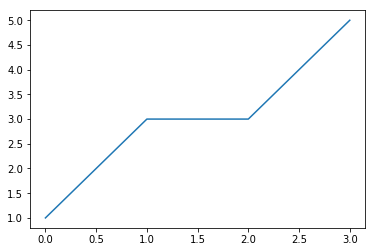

In [15]:
plt.plot([2, 5, 1, 7])
plt.show()
plt.plot([1, 3, 3, 5])
plt.show()

Los datos a mostrar son exactamente los mismos que teníamos en el resultado anterior, pero ahora se muestran en dos figuras y en dos conjuntos de ejes distintos debido a la ejecución de la función *show* tras crear la primera gráfica.

### Estilo y ancho de línea

La función [matplotlib.pyplot.plot](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.plot.html) permite configurar la gráfica con cierto detalle vía parámetros. Para probarlos vamos a crear un conjunto de datos aleatorios tipo "random walk" con NumPy para mostrar en la gráfica:

In [16]:
y = np.random.randn(50).cumsum()

Se trata de 50 números aleatorios en el rango [0, 1) extraídos de una distribución uniforme, y sumados de forma acumulativa.

Echemos un primer vistazo al aspecto de estos valores:

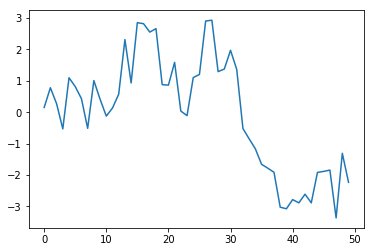

In [17]:
plt.plot(y)
plt.show()

Como no hemos indicado los valores de x, se ha asignado un conjunto de valores entre 0 y 50, ambos incluidos.

Veamos entonces cómo podemos dar formato a la gráfica (no estamos hablando aquí de dar formato ni a la figura ni a los ejes, cosa que veremos en próximas secciones, tan solo a la gráfica).

###### linestyle

El primero de los parámetros que vamos a revisar es **linestyle**, que nos permite especificar -como indica su nombre- el estilo de línea. Por defecto es una línea continua que une los diferentes puntos, pero podría ser, por ejemplo una línea discontinua:

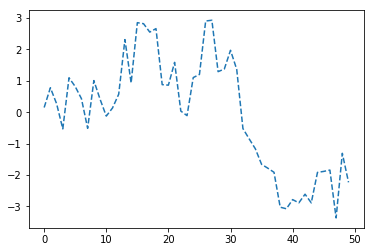

In [18]:
plt.plot(y, linestyle = "--")
plt.show()

Las opciones disponibles son:

* "-" o "solid": línea sólida (es la opción por defecto)
* "--" o "dashed": línea discontinua (la mostrada en In [13])
* "-." o "dashdot": línea que alterna guiones y puntos
* ":" o "dotted": línea de puntos
* "None", " " o "": no muestra nada.

En la siguiente imagen vemos cuatro gráficas tipo "random walk", cada una con un estilo de línea diferente (veremos poco más adelante cómo añadir una leyenda a la visualización):

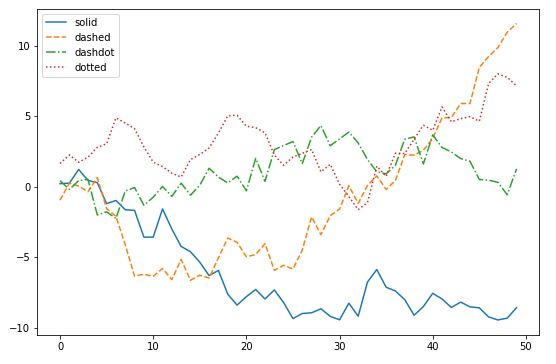

###### linewidth

Este parámetro nos permite controlar el ancho de las líneas generadas. Acepta un número real:

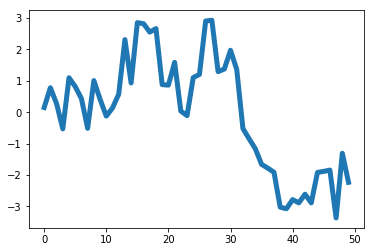

In [19]:
plt.plot(y, linewidth = 5)
plt.show()

### Marcadores y colores

###### marker

Por defecto, la función *plot* dibuja puntos (correspondientes a los valores x e y a mostrar) y los une con rectas, como sabemos. Pero es posible mostrar encima de cada uno de esos puntos un símbolo (un marcador) con el parámetro **marker**:

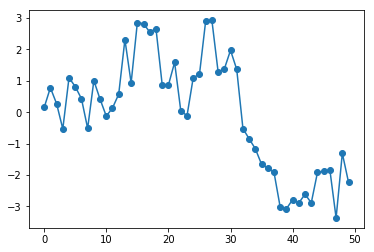

In [20]:
plt.plot(y, marker = "o")
plt.show()

Podemos encontrar en [esta página de la documentación](https://matplotlib.org/api/markers_api.html#module-matplotlib.markers) el conjunto de marcadores definidos en matplotlib. Vemos en la siguiente imagen algunos de los disponibles:

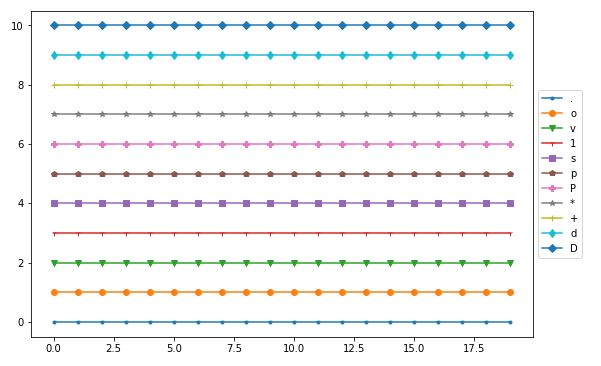

Junto a este parámetro hay otros que permiten ajustar el ancho del borde del marcador (**markeredgewidth**), el color del borde del marcador (**markeredgecolor**), el color de fondo del marcador (**markerfacecolor**), el color alternativo para el color de fondo del marcador (**markerfacecoloralt**) y el tamaño del marcador (**markersize**). Veamos este último:

###### markersize

Este parámetro acepta un número real. Apliquémoslo con el marker "o" ya visto para poder comparar esta siguiente imagen con la mostrada anteriormente:

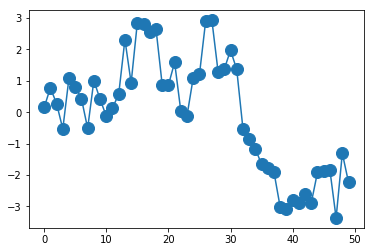

In [21]:
plt.plot(y, marker = "o", markersize = 12)
plt.show()

###### color

Este parámetro controla el color de la gráfica y acepta gran cantidad de formatos distintos:

* Uno de los siguientes nombres: 'blue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive' o 'cyan'
* Uno de los siguientes caracteres representando colores: 'b', 'g', 'r', 'c', 'm', 'y', 'k', 'w' (por ejemplo, "b" representa "blue", azul)
* Tuplas de tres o cuatro valores entre 0 y 1 representando colores en formato RGB o RGBA, por ejemplo: (0.1, 0.3, 0.2)
* Una cadena de texto representando un número hexadecimal correspondiente a un color en formato RGB o RGBA, por ejemplo #A055CC, o #99CC3377
* Un color en formato X11/CSS4
* Un nombre de color del xkcd color survey precedido por "xkcd:" (por ejemplo, "xkcd:burnt orange")
* Cualquier nombre de color web, por ejemplo "Tomato" o "CornflowerBlue"

Esta última opción es, tal vez, la más práctica. En [esta página de la wikipedia](https://en.wikipedia.org/wiki/Web_colors) podemos ver el listado de nombres colores, el propio color, su representación hexadecimal RGB y su representación decimal RGB:

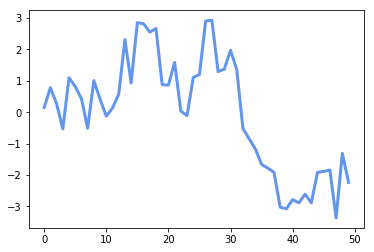

In [22]:
plt.plot(y, color = "CornflowerBlue", linewidth = 3)
plt.show()

Por otro lado, la opción más cómoda es la segunda de las opciones comentadas (una letra representando un color), aunque los colores en cuestión son de los menos atractivos de la paleta:

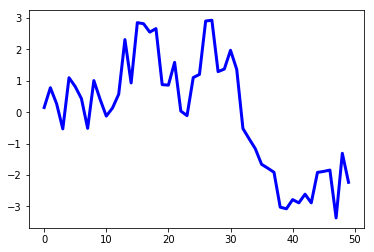

In [23]:
plt.plot(y, color = "b", linewidth = 3)
plt.show()

### Estilo de gráfica y etiquetas

###### drawstyle

Este parámetro define el estilo de la gráfica: el estilo "*default*" genera el tipo de gráfica que hemos visto hasta ahora -uniendo los puntos con líneas rectas-, y el estilo "*steps*" genera una gráfica escalonada (de ésta última hay varias variantes). Veamos estos dos estilos comentados:

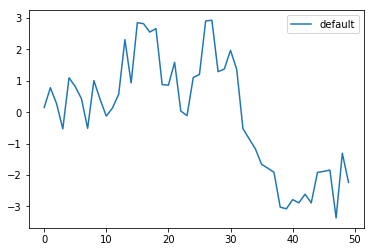

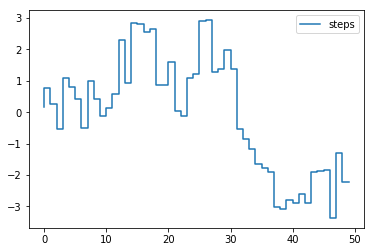

In [24]:
plt.plot(y, drawstyle = "default", label = "default")
plt.legend()
plt.show()
plt.plot(y, drawstyle = "steps", label = "steps")
plt.legend()
plt.show()

###### label

El parámetro **label** asigna a una gráfica una etiqueta que será mostrada en la leyenda (si activamos ésta). Por ejemplo, creemos tres gráficas con datos tipo "random walk" como los usados en los ejemplos anteriores y asignémosles tres etiquetas cualesquiera:

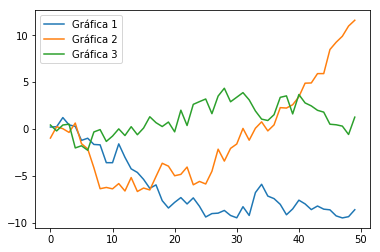

In [25]:
plt.plot(np.random.randn(50).cumsum(), label = "Gráfica 1")
plt.plot(np.random.randn(50).cumsum(), label = "Gráfica 2")
plt.plot(np.random.randn(50).cumsum(), label = "Gráfica 3")
plt.legend()
plt.show()

Aunque lo veremos con detalle más adelante, la función [matplotlib.pyplot.legend](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.legend.html#matplotlib.axes.Axes.legend) genera la leyenda a partir de las etiquetas ("labels") asignadas a las gráficas y la sitúa de forma automática allí donde matplotlib estima que es el mejor lugar.

### El parámetro [fmt]

En lugar de especificar el color de la gráfica, el marcador a usar y el estilo de línea mediante los parámetros **color**, **marker** y **linestyle** que hemos visto, podemos añadir tras los parámetros x e y de la función plot (o tan solo tras el parámetro y, si no hemos especificado las x) el parámetro [fmt] con el mismo objetivo. Este parámetro es una cadena de texto en la que podemos incluir (en cualquier orden) un carácter que indique el color de la línea, otro que indique el marcador a usar y uno o dos más para indicar el estilo de la línea. No es necesario añadir los tres datos. Por ejemplo, en la siguiente gráfica se fija el color verde (indicado por el carácter "g"):

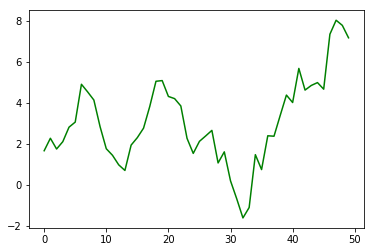

In [26]:
y = np.random.randn(50).cumsum()
plt.plot(y, "g")
plt.show()

En el siguiente ejemplo, indicamos como marcador el círculo (letra "o") y línea discontinua (caracteres "--"):

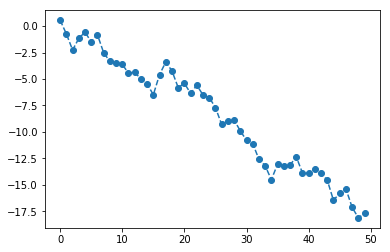

In [27]:
y = np.random.randn(50).cumsum()
fig, ax = plt.subplots()
g1 = ax.plot(y, "o--")
plt.show()

Por último, en el siguiente ejemplo indicamos que se cree una línea formada por guiones y puntos (caracteres "-."), amarilla (letra "y") y marcadores tipo "estrella" (carácter "\*"). Adicionalmente utilizamos el parámetro **markersize** para fijar el tamaño del marcador:

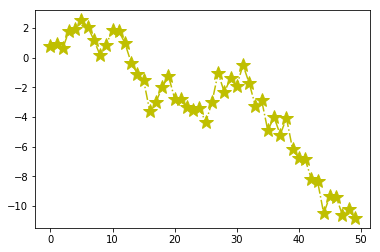

In [28]:
y = np.random.randn(50).cumsum()
fig, ax = plt.subplots()
g1 = ax.plot(y, "-.y*", markersize = 15)
plt.show()

Como se ha comentado anteriormente, los colores representados por una letra ( 'b', 'g', 'r', 'c', 'm', 'y', 'k', 'w') son los menos atractivos de la paleta, por lo que la opción de fijar el color de la gráfica mediante este parámetro [fmt] puede ser útil para trabajos propios o pruebas de concepto, siendo más recomendable fijar colores más agradables mediante el parámetro **color** cuando el informe se destine a un tercero.

Si se utiliza este parámetro [fmt] es posible mostrar dos o más gráficas en el mismo conjunto de ejes ejecutando la función plot una sola vez. En el siguiente ejemplo tenemos dos conjuntos de valores y y los incluimos como argumentos de la función plot separados por el argumento [fmt]:

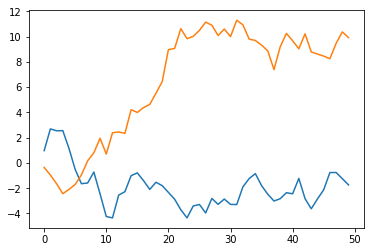

In [29]:
y1 = np.random.randn(50).cumsum()
y2 = np.random.randn(50).cumsum()

plt.plot(y1, "", y2)
plt.show()

Podemos apreciar como el parámetro [fmt] es necesario, al menos, entre cada pareja de conjuntos de valores y (es decir, el último conjunto de valores no requiere el argumento [fmt]). Además, en el ejemplo anterior el parámetro [fmt] usado es una cadena de texto vacía. Es decir, aunque estamos obligados a incluir el parámetro, no hace falta que éste tenga contenido.

En el ejemplo mostrado a continuación se utilizan los parámetros [fmt] de las dos gráficas:

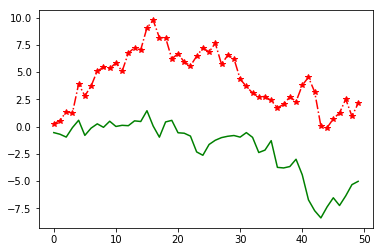

In [30]:
y1 = np.random.randn(50).cumsum()
y2 = np.random.randn(50).cumsum()

plt.plot(y1, "-g", y2, "-.*r")
plt.show()

### La función plot estilo OO

Todas las herramientas vistas están disponibles en el estilo OO (Object Oriented). Para la generación de la figura y de uno (o más) conjuntos de ejes podemos recurrir a la función [matplotlib.pyplot.subplots](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.subplots.html) que, como ya hemos visto anteriormente, crea estos objetos y devuelve una referencia a la figura y al conjunto de ejes (si solo se ha creado uno) o a una lista de referencias a los conjuntos de ejes (si se han creado dos o más):

fig, ax = plt.subplots()

Una vez tenemos la referencia al conjunto de ejes ax (supongamos que es solo uno), podemos crear una gráfica ejecutando el método plot sobre ax:

g = ax.plot(np.random.randn(50).cumsum())

El método plot devuelve una lista de objetos Line2D que representan la gráfica, objetos sobre los que es posible trabajar fijando sus propiedades. Por este motivo, almacenamos el resultado del método en una variable a la que llamamos g:

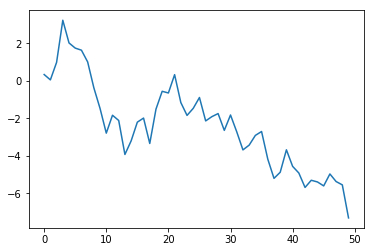

In [31]:
fig, ax = plt.subplots()
g = ax.plot(np.random.randn(50).cumsum())

En este caso la lista de objetos está formada por un único elemento:

In [32]:
print(len(g))

1


Podemos, por lo tanto, dar formato al objeto g[0] ejecutando los método equivalentes a algunos de los argumentos de la función plot vistos:

* color → set_color
* linestyle → set_linestyle
* linewidth → set_linewidth

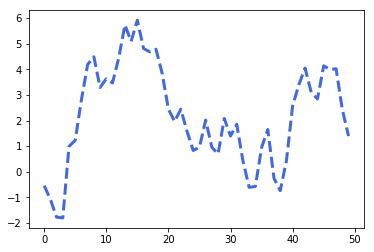

In [33]:
fig, ax = plt.subplots()
g = ax.plot(np.random.randn(50).cumsum())
g[0].set_color("RoyalBlue")
g[0].set_linestyle("--")
g[0].set_linewidth(3)
plt.show()

Los métodos que gestionan los marcadores son los siguientes:

* marker → set_marker
* markersize → set_markersize

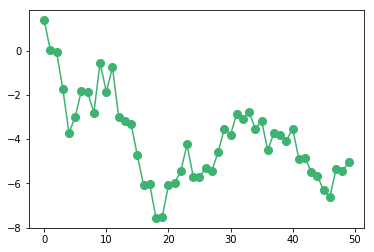

In [34]:
fig, ax = plt.subplots()
g = ax.plot(np.random.randn(50).cumsum())
g[0].set_color("MediumSeaGreen")
g[0].set_marker("o")
g[0].set_markersize(8)
plt.show()

Para probar los estilos de gráficas ("default", "steps"...) vamos a crear dos gráficas, una junto a otra, con los dos estilos mencionados. El método equivalente al atributo visto es:

* drawstyle → set_drawstyle

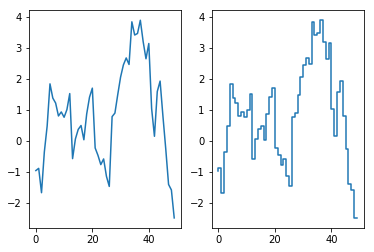

In [35]:
fig, ax = plt.subplots(1, 2)
y = np.random.randn(50).cumsum()

g = ax[0].plot(y)
g[0].set_drawstyle("default")  #Opción por defecto

g = ax[1].plot(y)
g[0].set_drawstyle("steps")

plt.show()

Aunque lo veremos más adelante, la ejecución de la función plt.subplots(1, 2) crea una matriz de conjuntos de ejes formada por una fila y dos columnas (es decir, dos conjuntos de ejes).

Por último, nos queda probar el equivalente del atributo label:

* label → set_label

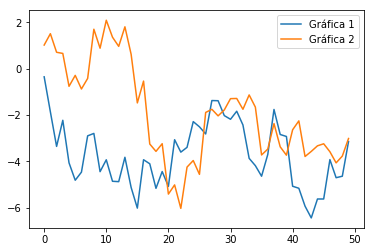

In [36]:
fig, ax = plt.subplots()
g1 = ax.plot(np.random.randn(50).cumsum())
g1[0].set_label("Gráfica 1")
g2 = ax.plot(np.random.randn(50).cumsum())
g2[0].set_label("Gráfica 2")
plt.legend()
plt.show()

# Creación y personalización de figuras
<div style = "float:right"><a style="text-decoration:none" href = "#inicio">Inicio</a></div>

Ya se ha comentado que la figura es el contenedor dentro del cual vamos a crear una o más gráficas, cada una de ellas representada o accesible vía un conjunto de ejes. Recordemos los métodos principales para la creación de una figura y veamos cómo podemos personalizarla.

### Creación de figuras

Además de la opción de usar una función como plot que genera una figura y un conjunto de ejes de forma implícita (aunque no nos permite su personalización), hemos visto ya los dos métodos principales para la creación de una figura. El primero es el uso de la función [matplotlib.pyplot.figure](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.figure.html) que crea una nueva figura y devuelve una referencia a la misma:

fig = plt.figure()

La segunda forma vista consiste en el uso de la función [matplotlib.pyplot.subplots](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.subplots.html) que genera una figura y uno o más conjuntos de ejes (uno por defecto), devolviendo una referencia a la figura y a los conjuntos de ejes en cuestión:

fig, ax = plt.subplots()

En ambos casos, el resultado contenido en la variable fig es una referencia a un objeto de tipo [matplotlib.figure.Figure](https://matplotlib.org/api/_as_gen/matplotlib.figure.Figure.html), "contenedor" que engloba al resto de elementos involucrados en el dibujo de una gráfica.

### Personalización de figuras

Usando el primer método (la función [matplotlib.pyplot.figure](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.figure.html)), es posible pasar como argumentos de la función valores que definan ciertas propiedades visuales de la figura. Generemos, en primer lugar, una figura sin personalizar (y añadamos en ella una sencilla gráfica):

In [37]:
y = np.random.randn(100).cumsum()

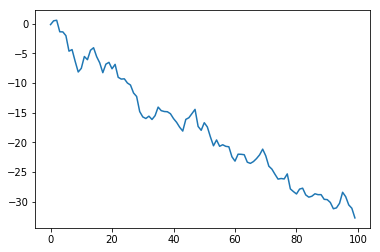

In [38]:
fig = plt.figure()
plt.plot(y)
plt.show()

Veamos -utilizando el mismo conjunto de valores para el eje vertical "y" calculado- los diferentes parámetros que podemos especificar.

### Tamaño y color de fondo

###### figsize

El primero de los parámetros que vamos a ver es **figsize**, que nos permite especificar el tamaño de la figura en pulgadas, indicando en primer lugar el ancho y, a continuación, el alto. Estos valores pueden pasarse como una lista o como una tupla:

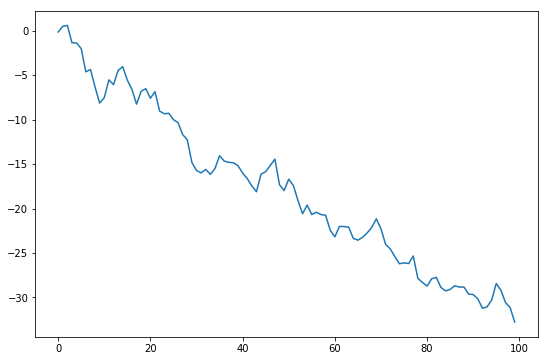

In [39]:
fig = plt.figure(figsize = [9, 6])
plt.plot(y)
plt.show()

El valor por defecto es [6.4, 4.8].

###### facecolor

El parámetro **facecolor** controla el color del fondo de la figura:

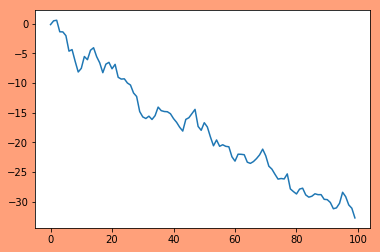

In [40]:
fig = plt.figure(facecolor = "LightSalmon")
plt.plot(y)
plt.show()

Comprobamos en la anterior imagen que una cosa es el fondo de la figura y otra el fondo de la gráfica.

### Borde

Los parámetros **edgecolor** y **linewidth** hacen referencia al borde de la figura. Y aquí podemos ver un buen ejemplo de lo que podríamos llamar "falta de consistencia" o de "amigabilidad" de matplotlib: estos nombres podrían incluir el término "*border*" para hacerlos más intuitivos (y llamarse, por ejemplo, *bordercolor* y *borderwidth*) y, sin embargo, no solo no lo incluyen sino que incluyen términos diferentes (*edge* y *line*) para referirse al mismo concepto. Este tipo de inconsistencias supone que, en la práctica, resulta necesario memorizar gran cantidad de nombres poco intuitivos o estar consultando permanentemente la documentación.

Con el parámetro **edgecolor** damos color al borde de la figura (por defecto es de color blanco) y con el parámetro **linewidth** definimos el ancho de dicho borde (por defecto es 0). Debido a estos valores por defecto, la única forma que tenemos de ver el borde es especificando ambos parámetros:

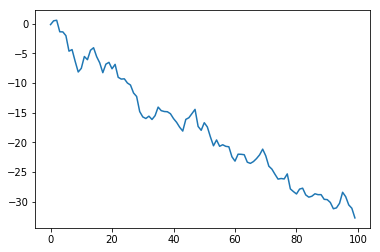

In [41]:
fig = plt.figure(edgecolor = "#2E8B57")
plt.plot(y)
plt.show()

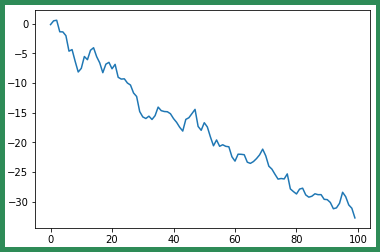

In [42]:
fig = plt.figure(edgecolor = "#2E8B57", linewidth = 10)
plt.plot(y)
plt.show()

### Título

La función [matplotlib.pyplot.suptitle](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.suptitle.html) nos permite establecer un título para la figura -no para las gráficas que estén contenidas en ella-:

In [43]:
y1 = np.random.randn(100).cumsum()
y2 = np.random.randn(100).cumsum()

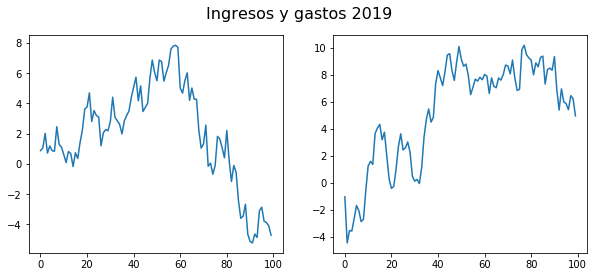

In [44]:
fig, ax = plt.subplots(1, 2)
fig.set_size_inches(10, 4)
plt.suptitle('Ingresos y gastos 2019', fontsize=16)
ax[0].plot(y1)
ax[1].plot(y2)
plt.show()

Esta funcionalidad también está disponible en el método homónimo de una figura:

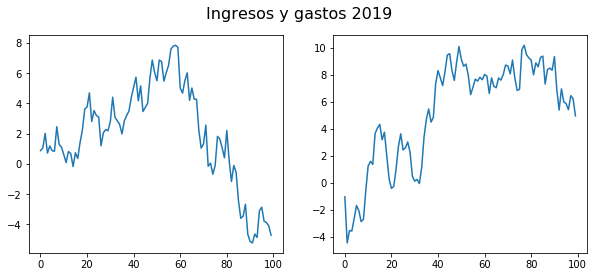

In [45]:
fig, ax = plt.subplots(1, 2)
fig.set_size_inches(10, 4)
fig.suptitle('Ingresos y gastos 2019', fontsize=16)
ax[0].plot(y1)
ax[1].plot(y2)
plt.show()

### Personalización con estilo OO

La mayor parte de estos parámetros están también disponibles como métodos del objeto [matplotlib.figure.Figure](https://matplotlib.org/api/_as_gen/matplotlib.figure.Figure.html) (en lo que matplotlib denomina "estilo orientado a objetos"):

* figsize → set_size_inches
* facecolor → set_facecolor
* edgecolor → set_edgecolor
* linewidth → No tiene equivalente

Por ejemplo:

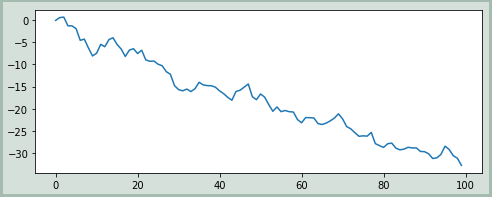

In [46]:
fig = plt.figure(linewidth = 6)
fig.set_size_inches(8, 3)
fig.set_facecolor([0.2, 0.4, 0.3, 0.2])
fig.set_edgecolor([0.2, 0.4, 0.3, 0.3])
plt.plot(y)
plt.show()

(el ancho del borde ha tenido que ser impuesto vía parámetro, al no tener un equivalente en estilo OO).

# Creación y personalización de ejes
<div style = "float:right"><a style="text-decoration:none" href = "#inicio">Inicio</a></div>

Hemos visto cómo crear y personalizar la "figura" -ese contenedor dentro del cual vamos a situar el resto de objetos-. Dentro de esa figura vamos a crear un conjunto de ejes (uno o tantos como necesitemos) y, en el conjunto de ejes, ya podemos crear una gráfica, y hemos visto también cómo personalizar esa gráfica para el caso concreto de que haya sido creada con la función [matplotlib.pyplot.plot](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.plot.html). Nos queda pendiente aprender a personalizar ese objeto intermedio, los ejes, objeto -por otro lado- fundamental pues de él dependen gran parte de los conceptos que solemos asociar a una gráfica ("gráfica" en sentido genérico): el título, los nombres de los ejes, las marcas de los ejes, las etiquetas a mostrar en dichas marcas, etc.

En esta sección vamos a ver cómo crear un conjunto de ejes y cómo podemos personalizarlo.

### Creación de ejes

Recordemos que, usando la función [matplotlib.pyplot.plot](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.plot.html), se crean -si no existen ya- tanto una figura como un conjunto de ejes, aunque la función no nos devuelve una referencia para poder personalizarlos.

Como alternativas tenemos la función **plt.subplots**, la función **plt.axes** y el método de una figura **fig.add_subplot**. Veámoslas en detalle.

### La función subplots

La función [matplotlib.pyplot.subplots](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.subplots.html) crea una figura y uno (o varios) conjunto de ejes, devolviendo una referencia a la figura y a los ejes. Por defecto -si no se especifica otra cosa- crea un único conjunto de ejes:

In [47]:
y = np.random.randn(100).cumsum()

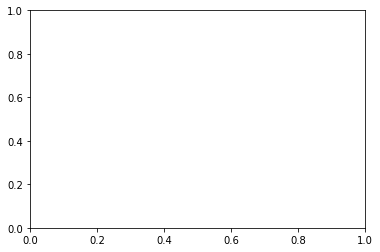

In [48]:
fig, ax = plt.subplots()

En este caso, la variable **ax** es una referencia a un objeto tipo AxesSubplot:

In [49]:
type(ax)

matplotlib.axes._subplots.AxesSubplot

Si queremos crear una matriz de conjuntos de ejes de, por ejemplo, 2 filas y 3 columnas (es decir, 6 conjuntos de ejes repartidos de dicha forma), basta añadir estos valores como primeros argumentos de la función:

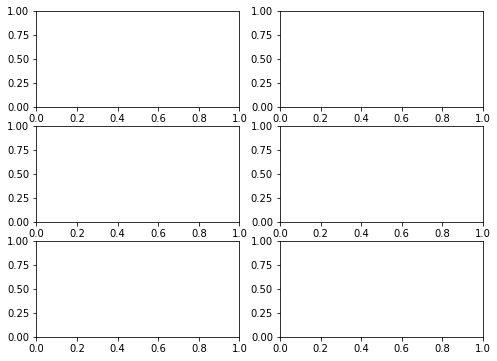

In [50]:
fig, ax = plt.subplots(3, 2)
fig.set_size_inches(8, 6)

(se ha aumentado el tamaño de la figura para poder visualizar correctamente los 6 conjuntos de ejes).

Obsérvese que los ejes son creados y mostrados, aun cuando no se creen gráficas dentro de ellos.

Vemos en la siguiente imagen que, en este caso, *ax* es un array NumPy, de tamaño 3x2, conteniendo referencias a cada uno de los ejes:

In [51]:
type(ax)

numpy.ndarray

In [52]:
ax.shape

(3, 2)

In [53]:
ax

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000214745520B8>,
      dtype=object)

Ahora podríamos ejecutar el método [plot](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.plot.html) asociado a cada uno de estos ejes para mostrar una gráfica. Por ejemplo, si quisiéramos mostrarla en la segunda fila (cuyo índice es 1) y primera columna (cuyo índice es 0), podríamos hacerlo del siguiente modo:

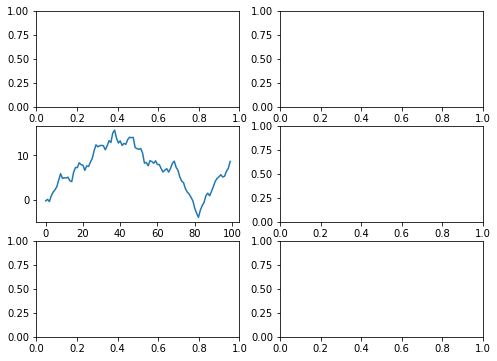

In [54]:
fig, ax = plt.subplots(3, 2)
fig.set_size_inches(8, 6)
ax[1, 0].plot(y)
plt.show()

Las dos siguientes instrucciones son equivalentes:

fig, ax = plt.subplots()

fig, ax = plt.subplots(1, 1)

Es decir, en el segundo caso no se devuelve una lista formada por un único elemento, sino el elemento directamente.

Dos parámetros interesantes de la función subplots son **sharex** y **sharey**. Éstos controlan la compartición de las propiedades de los ejes. Por defecto toman el valor *False*, lo que supone que cada conjunto de ejes es independiente. Si, por ejemplo, el argumento *sharex* se fija a *True*, todos los ejes x de los diferentes conjuntos de ejes compartirán las mismas propiedades. Veámoslo en la práctica con una matriz de 2x2 conjuntos de ejes:

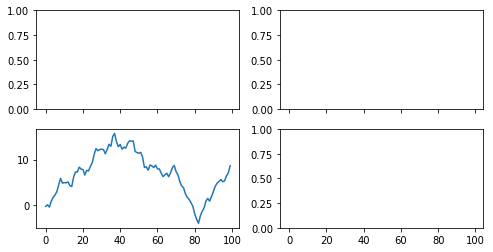

In [55]:
fig, ax = plt.subplots(2, 2, sharex = True)
fig.set_size_inches(8, 4)
ax[1, 0].plot(y)
plt.show()

Comprobamos cómo los ejes horizontales son mostrados solo en la parte inferior de la figura, indicando que los situados por encima de éstos comparten dicho eje.

El equivalente para el eje y es el que podemos ver en la siguiente imagen:

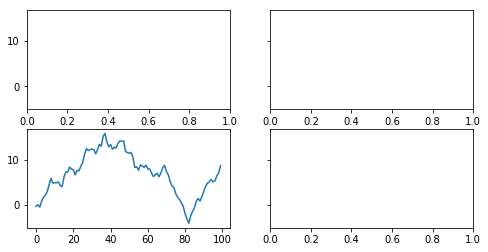

In [56]:
fig, ax = plt.subplots(2, 2, sharey = True)
fig.set_size_inches(8, 4)
ax[1, 0].plot(y)
plt.show()

Ahora, los ejes y son mostrados solo en los conjuntos de ejes de la primera columna.

Si fijamos a *True* ambos parámetros:

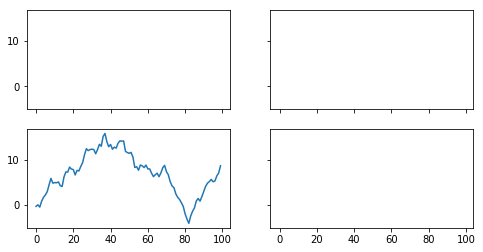

In [57]:
fig, ax = plt.subplots(2, 2, sharex = True, sharey = True)
fig.set_size_inches(8, 4)
ax[1, 0].plot(y)
plt.show()

...vemos que los ejes son mostrados en la primera columna y en la última fila, indicando que el resto de los conjuntos de ejes comparten dichos ejes.

Pero hay otras opciones. Así, por ejemplo, si el argumento *sharex* toma el valor "*row*", indicamos que cada fila de nuestra matriz compartirá el mismo eje x, y si toma el valor "*col*", indicamos que cada columna de nuestra matriz compartirá el mismo eje x. Y lo mismo ocurre con el argumento *sharey*, que puede tomar los valores "*row*" o "*col*" indicando que cada fila o cada columna compartirá el eje y.

### La función axes

La función [matplotlib.pyplot.axes](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.axes.html) es la segunda alternativa que vamos a ver. Esta función añade un conjunto de ejes en la figura actual, y fija el nuevo conjunto de ejes como actual (o, con otras palabras, lo marca como "activo"). Si no existe una figura, la crea y la marca como actual:

In [58]:
y = np.random.randn(100).cumsum()

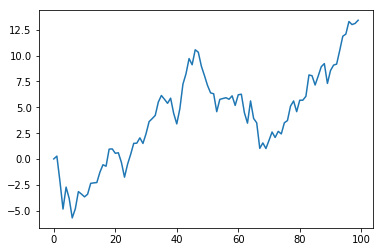

In [59]:
fig = plt.figure()
ax = plt.axes()
ax.plot(y)
plt.show()

In [60]:
type(ax)

matplotlib.axes._subplots.AxesSubplot

Esta función -como se ha comentado- añade un conjunto de ejes a la figura. Si en ésta ya existían otros ejes, se mostrarán en las posiciones y tamaños que fijemos. Para fijar la posición y tamaño de un eje podemos pasar una tupla a la función como primer argumento. Esta tupla contendrá la siguiente información:

[Posición izquierda, posición derecha, ancho, alto]

Veamos esto en funcionamiento. Supongamos que tenemos dos conjuntos de valores y1 e y2 (en este ejemplo generados aleatoriamente) y un conjunto de ejes creados con la función *plt.axes* en el que creamos una gráfica mostrando la distribución de y1 con la función *plt.plot*:

In [61]:
y1 = np.random.randn(100).cumsum()
y2 = np.random.randn(100).cumsum()

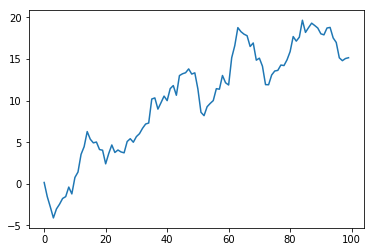

In [62]:
fig = plt.figure()

ax1 = plt.axes()
ax1.plot(y1)

plt.show()

Si, en el bloque anterior, antes de mostrar la gráfica con *plt.show*, añadiésemos un segundo conjunto de ejes especificando su posición y tamaño, tendríamos el siguiente resultado:

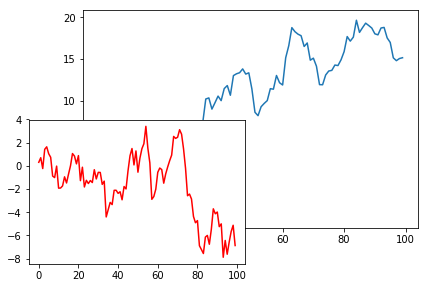

In [63]:
fig = plt.figure()

ax1 = plt.axes()
ax1.plot(y1)

ax2 = plt.axes([0.0, 0.0, 0.5, 0.5])
ax2.plot(y2, color = "red")

plt.show()

La segunda gráfica la hemos creado a partir del punto (0, 0) con ancho y alto de 0.5 (estos valores van referidos al tamaño de la figura. Es decir, un ancho de 1 equivale al ancho de la figura).

Si quisiéramos mostrar un conjunto de ejes encima del otro o distribuidos en filas y columnas, deberíamos crearlos con las posiciones y tamaños adecuados, para lo que resulta mucho más práctico usar la función *plt.subplots* ya vista. Sin embargo, para solapar las gráficas o mostrarlas en posiciones o con tamaños arbitrarios, la función *plt.axes* se muestra extremandamente práctica.

La función *plt.axes* también admite los parámetros **sharex** y **sharey** que controlan la compartición de los ejes. Y también admite el parámetro **label** que asigna una etiqueta al conjunto de ejes generados.

### La función add_subplot

El método [add_subplot](https://matplotlib.org/api/_as_gen/matplotlib.figure.Figure.html?highlight=add_subplot#matplotlib.figure.Figure.add_subplot) asociado a una figura añade un conjunto de ejes a la misma pero suponiéndolo en una matriz de columnas y filas (de conjuntos de ejes) y creándolo en la posición indicada de dicha matriz.

Si se invoca el método sin añadir argumentos, se supone que dicha matriz está formada únicamente por un conjunto de ejes (es decir, una columna y una fila):

In [64]:
y = np.random.randn(100).cumsum()

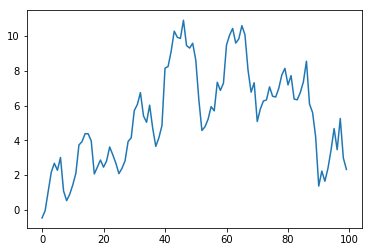

In [65]:
fig = plt.figure()
fig.add_subplot()
plt.plot(y)
plt.show()

Pero si se invoca añadiendo como argumentos el número de filas de la matriz, el número de columnas de la matriz y la posición que ocupa el conjunto de ejes a crear, se supone una matriz de dichas dimensiones y se sitúa el conjunto de ejes en la posición correcta:

In [66]:
y1 = np.random.randn(100).cumsum()
y2 = np.random.randn(100).cumsum()
y3 = np.random.randn(100).cumsum()

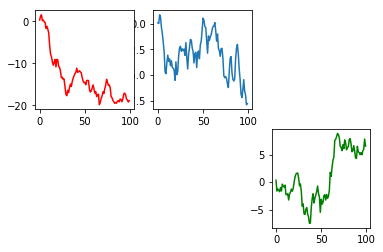

In [67]:
fig = plt.figure()
fig.add_subplot(2, 3, 2)
plt.plot(y1)
fig.add_subplot(2, 3, 1)
plt.plot(y2, color = "red")
fig.add_subplot(2, 3, 6)
plt.plot(y3, color = "green")
plt.show()

En el ejemplo anterior partimos de 3 conjuntos de datos (y1, y2 e y3) a mostrar en sendas gráficas y, para cada uno de ellos creamos un conjunto de ejes con el método add_subplot. En los tres casos se indica una matriz de 2 filas y 3 columnas. El primer conjunto de ejes creado -con la gráfica de color azul- se sitúa en la posición 2 (las posiciones se cuentan a partir de 1, de izquierda a derecha y de arriba abajo). El segundo conjunto de ejes -con la gráfica de color rojo- se sitúa en la posición 1, es decir, en la esquina superior izquierda de la matriz. Y el tercer conjunto de ejes -con la gráfica de color verde- se sitúa en la posición 6, es decir, en la esquina inferior derecha. El resto de espacios en la matriz quedan sin ocupar.

Este método también acepta los parámetros **sharex** y **sharey** que controlan la compartición de los ejes, y el parámetro **label** que asigna una etiqueta al conjunto de ejes creado.

### Personalización de ejes

En la documentación de matplotlib encontramos un [esquema con la "anatomía" de una figura](https://matplotlib.org/tutorials/introductory/usage.html#parts-of-a-figure):

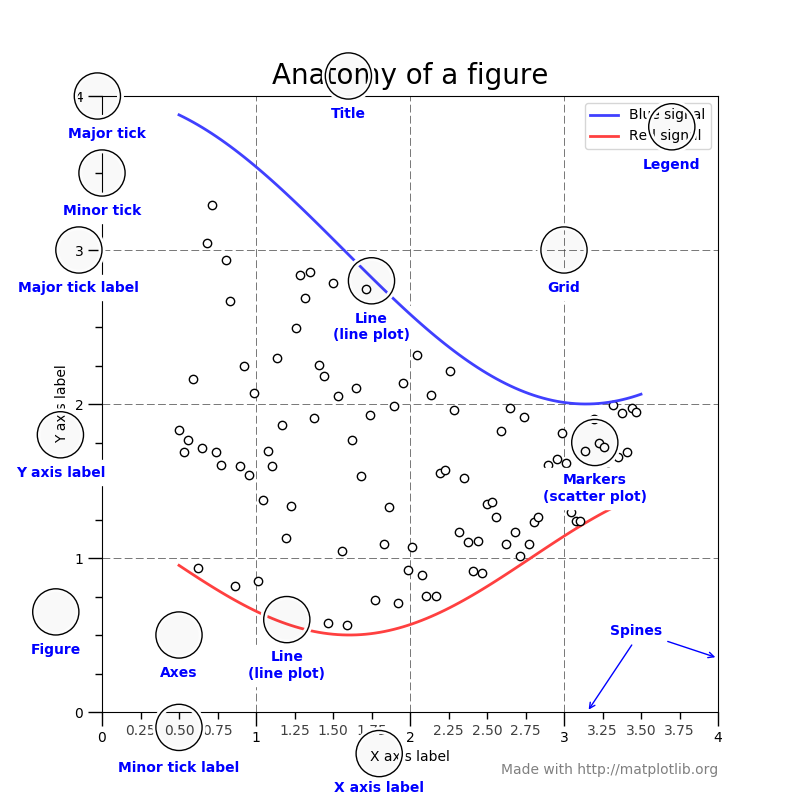

Identificamos en ella un elemento que depende de lo que llamamos "gráfica": la línea (line) -y su color, ancho, estilo...-.

Otro de los elementos mostrados (la leyenda) depende de la figura. Y el resto de elementos dependen directamente del conjunto de ejes:

* **Title**: título a mostrar en la gráfica
* **x axis label**: nombre del eje x
* **y axis label**: nombre del eje y
* **Major ticks**: marcas principales en los ejes
* **Minor ticks**: marcas secundarios en los ejes
* **Major tick labels**: etiquetas a mostrar en las marcas principales de los ejes
* **Minor tick labels**: etiquetas a mostrar en las marcas secundarios de los ejes
* **Spines**: bordes de la gráfica
* **Grid**: rejilla a mostrar sobre la gráfica

Veamos en las siguientes páginas cómo personalizar todos ellos.

### Título

Podemos añadir un título a nuestro eje con la función [matplotlib.pyplot.title](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.title.html?highlight=title#matplotlib.pyplot.title). Esta función acepta como primer argumento el texto del título y otros parámetros que representan propiedades del texto, por ejemplo:

* **alpha**: transparencia del texto
* **backgroundcolor**: color de fondo
* **color**: color del texto
* **fontfamily**: familia de la fuente a usar
* **fontname**: nombre de la fuente a usar
* **fontsize**: tamaño de la fuente
* **fontstretch**: ancho de la fuente
* **fontstyle**: estilo de la fuente ('normal', 'italic', 'oblique')
* **fontvariant**: variante de la fuente ('normal', 'small-caps')
* **fontweight**: "peso" de la fuente ( 'ultralight', 'light', 'normal', 'regular', 'bold', etc.)
* **horizontalalignment**: alineación horizontal del texto ('center', 'right', 'left')
* **linespacing**: espacio entre líneas
* **position**: posición x e y del título
* **rotation**: ángulo de rotación del texto (en grados)
* **verticalalignment**: alineación vertical del texto ('center', 'top', 'bottom', 'baseline', 'center_baseline')
* **x**: posición x del texto
* **y**: posición y del texto

Los parámetros **position**, **&#120;** e **&#121;** toman normalmente valores entre 0 y 1, correspondiendo el 0 al extremo izquierdo del espacio ocupado por el conjunto de ejes y el 1 al extremo derecho (o a los extremos inferior y superior, si nos referimos a la y). Pueden tomar también valores negativos o superiores a 1, pero en este caso el texto se mostrará fuera de los límites de los ejes.

Todos estos parámetros son extremadamente útiles pues podremos aplicarlos no solo al título, sino a las etiquetas que demos a los ejes, a las etiquetas de las marcas de los ejes, etc.

En la siguiente página tenemos el listado completo de atributos y los valores que pueden tomar:

https://matplotlib.org/api/text_api.html#matplotlib.text.Text

Veamos algunos ejemplos. En el siguiente simplemente ejecutamos la función *plt.title* pasando como argumento el texto a mostrar:

In [68]:
y = np.random.randn(100).cumsum()

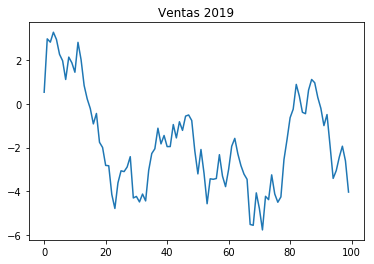

In [69]:
fig, ax = plt.subplots()
plt.plot(y)
plt.title("Ventas 2019")
plt.show()

En el siguiente ejemplo especificamos una fuente tamaño 20 y alineamos el texto a la derecha (es decir, el extremo derecho del texto se muestra en el centro del área disponible):

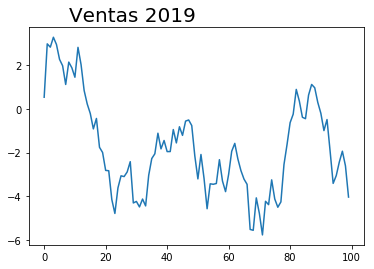

In [70]:
fig, ax = plt.subplots()
plt.plot(y)
plt.title("Ventas 2019", fontsize = 20, horizontalalignment = "right")
plt.show()

Por último, en el siguiente ejemplo configuramos la posición del texto (es decir, su posición x e y en la figura), su tamaño, color y peso:

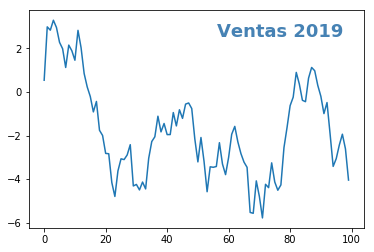

In [71]:
fig, ax = plt.subplots()
plt.plot(y)
plt.title("Ventas 2019",
          position = (0.75, 0.85),
          fontsize = 18,
          color = "SteelBlue",
          fontweight = "bold")
plt.show()

Todos los parámetros relativos al texto tienen un método equivalente en el estilo "orientado a objetos". Estos métodos se aplican a la variable que represente el conjunto de ejes. Por ejemplo, el equivalente al código de la anterior imagen es:

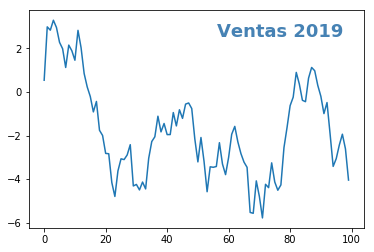

In [72]:
fig, ax = plt.subplots()
ax.plot(y)
title = ax.set_title("Ventas 2019")
title.set_position(xy = [0.75, 0.85])
title.set_fontsize(18)
title.set_color("SteelBlue")
title.set_fontweight("bold")
plt.show()

### Etiquetas de ejes

Es posible asignar etiquetas a los ejes x e y con las funciones [matplotlib.pyplot.xlabel](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.xlabel.html?highlight=xlabel#matplotlib.pyplot.xlabel) y [matplotlib.pyplot.ylabel](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.ylabel.html?highlight=ylabel#matplotlib.pyplot.ylabel). Ambas funciones aceptan un primer argumento con el texto y aceptan también todos los atributos del texto que hemos visto para el título:

In [73]:
y = np.random.randn(100).cumsum()

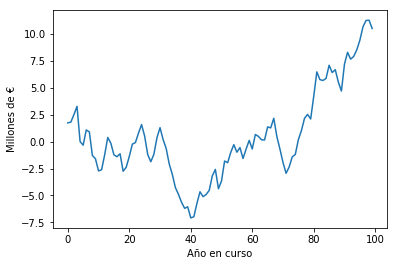

In [74]:
fig, ax = plt.subplots()
plt.plot(y)
plt.xlabel("Año en curso")
plt.ylabel("Millones de €")
plt.show()

En el ejemplo de la imagen anterior simplemente ejecutamos las funciones mencionadas sin especificar atributos del texto adicionales. En el siguiente ejemplo se aplica cierto formato a ambas etiquetas:

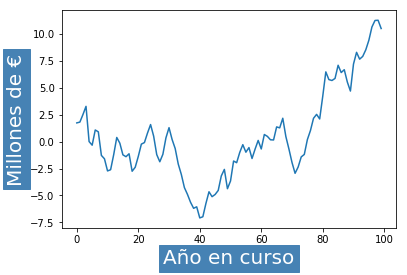

In [75]:
fig, ax = plt.subplots()
plt.plot(y)
plt.xlabel("Año en curso",
           fontsize = 20,
           color = "w",
           fontstretch = 0,
           backgroundcolor = "SteelBlue")
plt.ylabel("Millones de €",
           fontsize = 20,
           color = "w",
           fontstretch = 0,
           backgroundcolor = "SteelBlue")
plt.show()

Los métodos del conjunto de ejes equivalentes en el estilo OO son **set_xlabel** y **set_ylabel**, ambos devolviendo una referencia al objeto texto creado:

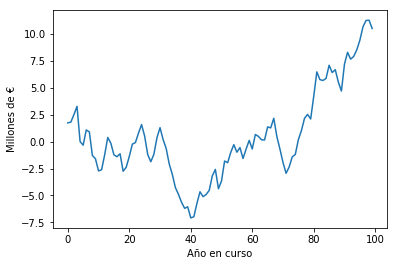

In [76]:
fig, ax = plt.subplots()
ax.plot(y)
xlabel = ax.set_xlabel("Año en curso")
ylabel = ax.set_ylabel("Millones de €")
plt.show()

### Marcas de ejes

Supongamos que partimos de los siguientes datos:

In [77]:
x = range(100, 200)
y = np.random.randn(100).cumsum()

Como podemos comprobar, se trata de un conjunto de datos cuyos valores **&#120;** varían entre 100 y 200 (este último valor sin incluir, esto es, se trata de 100 números enteros consecutivos comenzando por el 100) y cuyos valores **&#121;** resultan de la suma acumulada de números reales extraídos de una distribución gaussiana.

Mostremos estos valores en una gráfica usando la función *plt.plot*:

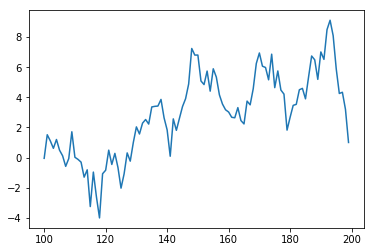

In [78]:
fig, ax = plt.subplots()
ax.plot(x, y)
plt.show()

Vemos que matplotlib hace un más que razonable esfuerzo en mostrar tanto en el eje x como en el eje y marcas suficientemente significativas: en eje x las sitúa de 20 en 20 entre el número 100 y el 200 (es decir, cubriendo todo el rango de nuestros valores x) y en el eje y las sitúa de 2 en 2 entre valores que considera adecuados.

Pero ¿y si queremos mostrar las marcas entre dos valores distintos? ¿o con una frecuencia diferente? Para esto tenemos las funciones [matplotlib.pyplot.xticks](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.xticks.html?highlight=xticks#matplotlib.pyplot.xticks) y [matplotlib.pyplots.yticks](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.yticks.html?highlight=yticks#matplotlib.pyplot.yticks). Estas funciones permiten obtener o establecer las marcas en los ejes. Por ejemplo, supongamos que queremos mostrar las marcas del eje x solo entre los valores 12 y 180, pero de 10 en 10. Bastaría con ejecutar la siguiente función:

plt.xticks(range(120, 180, 10))

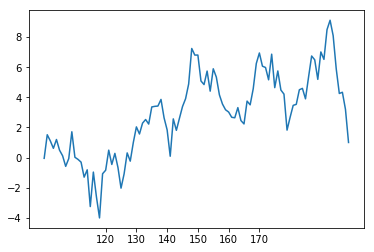

In [79]:
fig, ax = plt.subplots()
ax.plot(x, y)
plt.xticks(range(120, 180, 10))
plt.show()

Si, por otro lado, quisiéramos que las marcas se mostrasen incluyendo valores de x no incluidos en nuestro rango de datos, por ejemplo entre 0 y 250 de 20 en 20, usaríamos la misma función con los valores correspondientes:

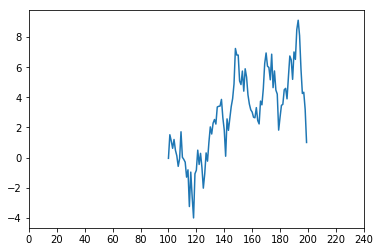

In [80]:
fig, ax = plt.subplots()
ax.plot(x, y)
plt.xticks(range(0, 250, 20))
plt.show()

Vemos que, ahora, la gráfica ocupa un espacio menor para dejar sitio a los valores para los que hemos establecido las marcas.

Para el eje y el proceso es exactamente el mismo. Mostremos marcas, por ejemplo solo entre los valores 120 y 180 de 10 en 10 en el eje x, y entre -2 y 4 de 1 en 1 en el eje y:

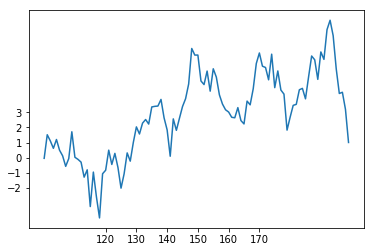

In [81]:
fig, ax = plt.subplots()
ax.plot(x, y)
plt.xticks(range(120, 180, 10))
plt.yticks(range(-2, 4))
plt.show()

En realidad, las funciones *plt.xticks* y *plt.yticks* no solo pueden fijar las marcas en los ejes, también pueden fijar las etiquetas de dichas marcas. Por ejemplo, en este último ejemplo que hemos visto, las etiquetas mostradas en el eje x son 120, 130, 140, 150, 160 y 170, pero podríamos querer fijarlas en algo como 2010, 2011, 2012, 2013, 2014 y 2015:

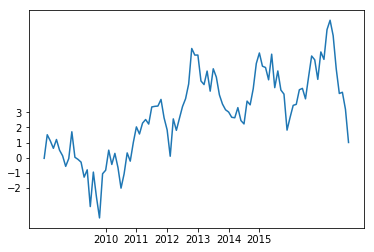

In [82]:
xtick_labels = [2010, 2011, 2012, 2013, 2014, 2015]
fig, ax = plt.subplots()
ax.plot(x, y)
plt.xticks(range(120, 180, 10), xtick_labels)
plt.yticks(range(-2, 4))
plt.show()

En el ejemplo anterior, hemos pasado a la función *plt.xticks* un primer argumento que fija los valores en los que se van a mostrar marcas, y un segundo argumento que fija las etiquetas a mostrar en dichas posiciones. Idealmente, este segundo argumento tiene la misma longitud que el primero, de forma que a cada marca le corresponda una etiqueta. Pero no tiene por qué ser así: si la lista de etiquetas es más larga que la lista de marcas, se ignoran las etiquetas extras. Y si es más corta, las marcas para las que no haya etiqueta se muestran sin ella.

Los métodos en el estilo OO equivalentes son:

plt.xticks → ax.set_xticks()

plt.yticks → ax.set_yticks()

...siendo ax la variable que representa el conjunto de ejes. De esta forma, el equivalente al código mostrado anteriormente es:

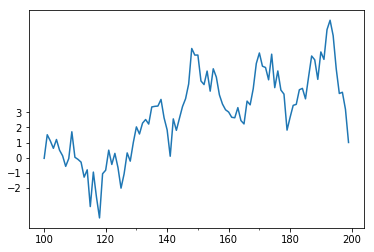

In [83]:
xtick_labels = [2010, 2011, 2012, 2013, 2014]
fig, ax = plt.subplots()
ax.plot(x, y)
ax.set_xticks(range(120, 180, 10), xtick_labels)
ax.set_yticks(range(-2, 4))
plt.show()

Existen también métodos para establecer solo las etiquetas: [set_xticklabels](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.set_xticklabels.html) y [set_yticklabels](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.set_yticklabels.html). Así, el código anterior podría quedar de la siguiente forma:

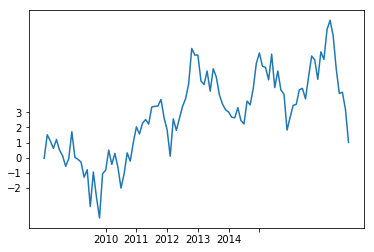

In [84]:
xtick_labels = [2010, 2011, 2012, 2013, 2014]
fig, ax = plt.subplots()
ax.plot(x, y)
ax.set_xticks(range(120, 180, 10))
ax.set_xticklabels(xtick_labels)
ax.set_yticks(range(-2, 4))
plt.show()

### Marcas principales y secundarias

Existe, en el estilo OO, otra forma de establecer las posiciones de las marcas principales (las vistas hasta ahora) y de las marcas secundarias (marcas que se muestran con un tamaño menor y sin etiqueta). Esta otra forma se basa en los métodos [set_major_locator](https://matplotlib.org/api/_as_gen/matplotlib.axis.Axis.set_major_locator.html) y [set_minor_locator](https://matplotlib.org/api/_as_gen/matplotlib.axis.Axis.set_minor_locator.html). Ambos métodos tienen como único argumento una valor de tipo "*Locator*". Para crear una variable de este tipo tenemos que importar la función [MultipleLocator](https://matplotlib.org/api/ticker_api.html?highlight=multiplelocator#matplotlib.ticker.MultipleLocator) de la sublibrería [matplotlib.ticker](https://matplotlib.org/api/ticker_api.html):

In [85]:
from matplotlib.ticker import MultipleLocator

In [86]:
xminor = MultipleLocator(1)
xmajor = MultipleLocator(7)

En el ejemplo anterior estamos creando dos "Locators" y asignándolos a dos variables, *xminor* y *xmajor*. Los valores entre paréntesis indican cada cuantos puntos se desea mostrar las marcas.

Ahora ya podríamos ejecutar los métodos comentados. Por ejemplo, si queremos que una gráfica muestre en el eje x las marcas principales cada 10 puntos y las marcas secundarias cada punto, podríamos hacerlo con el siguiente código:

In [87]:
y = np.random.randn(100).cumsum()

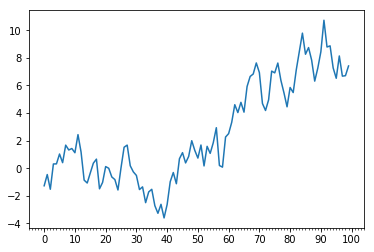

In [88]:
fig, ax = plt.subplots()
ax.plot(y)
ax.xaxis.set_major_locator(MultipleLocator(10))
ax.xaxis.set_minor_locator(MultipleLocator(1))
plt.show()

Podemos observar que los métodos en cuestión se deben aplicar al objeto *ax.xaxis* que representa al eje x en el conjunto de ejes ax (o al objeto *ax.yaxis* si deseásemos configurar el eje y). Estos son los objetos "eje" (en singular) o "*axis*".

También observamos que las marcas principales son las únicas que tienen etiquetas asignadas: las secundarias solo se muestran usando una pequeña marca en el eje.

Suponiendo que hemos importado la función *MultipleLocator*, realicemos otro ejemplo configurando esta vez los dos ejes de forma que en el eje x las marcas principales se muestren cada 15 puntos y las secundarias cada 3, y que en el eje y las marcas principales se muestren cada 3 puntos, y las secundarias cada punto:

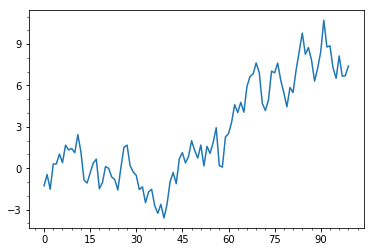

In [89]:
fig, ax = plt.subplots()
ax.plot(y)

# Eje x
ax.xaxis.set_major_locator(MultipleLocator(15))
ax.xaxis.set_minor_locator(MultipleLocator(3))
# Eje y
ax.yaxis.set_major_locator(MultipleLocator(3))
ax.yaxis.set_minor_locator(MultipleLocator(1))

plt.show()

### Límites de los ejes

Ya sabemos que matplotlib hace un buen trabajo adaptando los ejes de forma que cubran todos los datos, tanto a lo largo del eje x como a lo largo del eje y. Por ejemplo:

In [90]:
y = np.random.randn(100).cumsum()

In [91]:
min(y), max(y)

(0.5409745604719887, 15.71687240261382)

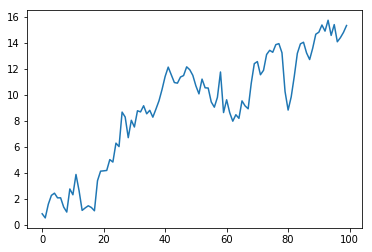

In [92]:
fig, ax = plt.subplots()
ax.plot(y)
plt.show()

En la imagen anterior vemos que matplotlib ha dimensionado el eje **&#121;** de forma que se cubra el rango de valores que toman nuestros datos. De forma semejante, al no haber especificado un conjunto de valores para el eje x se ha generado uno automáticamente que incluye el rango de números enteros entre 0 y 99, ambos incluidos (uno para cada uno de los valores de y).

Pero supongamos que no nos interesa mostrar más que una parte de la gráfica, por ejemplo, la situada entre los valores 20 y 60 del eje x. Para esto tenemos la función [matplotlib.pyplot.xlim](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.xlim.html?highlight=xlim#matplotlib.pyplot.xlim):

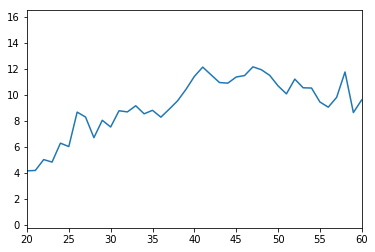

In [93]:
fig, ax = plt.subplots()
ax.plot(y)
plt.xlim(20, 60)
plt.show()

Para el eje y tenemos la función equivalente: [matplotlib.pyplot.ylim](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.ylim.html?highlight=ylim#matplotlib.pyplot.ylim):

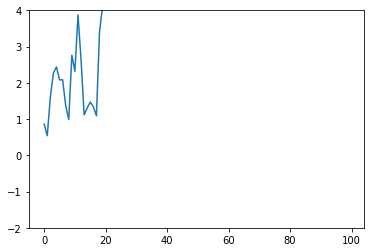

In [94]:
fig, ax = plt.subplots()
ax.plot(y)
plt.ylim(-2, 4)
plt.show()

En el estilo OO, los métodos equivalentes a las funciones vistas son [set_xlim](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.set_xlim.html?highlight=xlim#matplotlib.axes.Axes.set_xlim) y [set_ylim](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.set_ylim.html?highlight=set_ylim#matplotlib.axes.Axes.set_ylim), a ejecutar sobre la variable que referencia al conjunto de ejes. En el siguiente ejemplo usamos ambos métodos para establecer simultáneamente los límites de los ejes x e y:

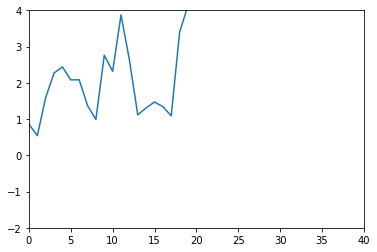

In [95]:
fig, ax = plt.subplots()
ax.plot(y)
ax.set_xlim(0, 40)
ax.set_ylim(-2, 4)
plt.show()

Por otro lado, los métodos para leer los límites de ambos ejes son [get_xlim](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.get_xlim.html) y [get_ylim](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.get_ylim.html), a ejecutar sobre la variable que referencia al conjunto de ejes también.

### Relación de aspecto

Otro de los elementos que podemos personalizar de los ejes es su relación de aspecto (la relación entre una unidad en el eje x y una unidad en el eje y). Generemos nuevamente un conjunto y de valores a mostrar y veamos cuál es la gráfica que se muestra por defecto:

In [96]:
y = np.random.randn(100).cumsum()

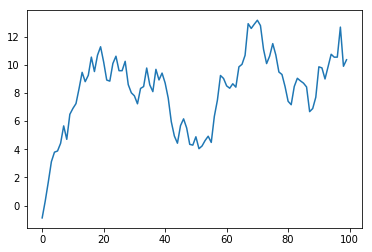

In [97]:
fig, ax = plt.subplots()
ax.plot(y)
plt.show()

Aun cuando el ancho de la gráfica es mayor que la altura, la relación de aspecto está bien alejada de la relación 1:1, por ejemplo.

Para controlar esta relación de aspecto podemos recurrir al método [set_aspect](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.set_aspect.html). Este método -asociado al conjunto de ejes- recibe un primer argumento que puede ser "auto" (opción por defecto), "equal" (opción con la que la relación de aspecto será de 1:1 ) o un número que determinará exactamente la relación de aspecto a aplicar.

Veamos la segunda de las opciones: "equal".

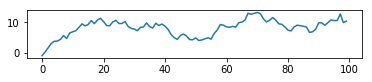

In [98]:
fig, ax = plt.subplots()
ax.plot(y)
ax.set_aspect("equal")
plt.show()

Comprobamos que, para que un punto en el eje x tenga el mismo tamaño que un punto en el eje y, este último deberá mostrarse mucho menor.

Si fijamos una relación de aspecto de, por ejemplo, 2, el resultado es el siguiente:

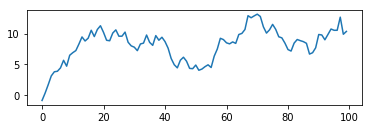

In [99]:
fig, ax = plt.subplots()
ax.plot(y)
ax.set_aspect(2)
plt.show()

# Personalización de otros elementos
<div style = "float:right"><a style="text-decoration:none" href = "#inicio">Inicio</a></div>

Hay dos elementos hasta cierto punto un tanto independientes: el grid o rejilla a mostrar sobre nuestra gráfica y la leyenda. En esta sección veremos cómo mostrar estos elementos y cómo personalizarlos.

### Grid

Frecuentemente resulta conveniente mostrar sobre nuestrá gráfica un grid (o rejilla) que sirva de referencia para facilitar la interpretación de los datos. Compárense, por ejemplo, estas dos gráficas:

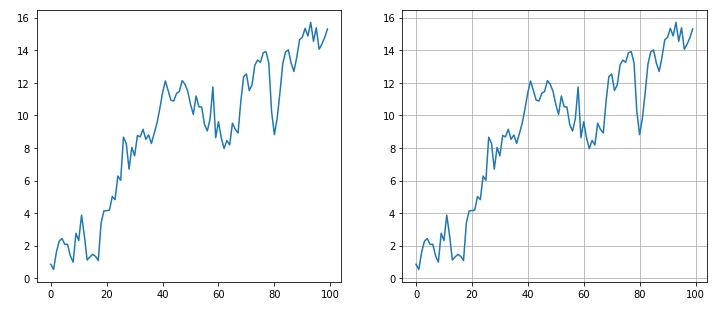

No cabe duda de que resulta más sencillo hacerse una idea de dónde están los máximos y mínimos locales con la ayuda de esta rejilla. Por supuesto, no siempre va a interesar transmitir esta información pero, cuando interese, mostrar el grid y personalizarlo resulta especialmente sencillo. Para mostrarlo tenemos la función [matplotlib.pyplot.grid](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.grid.html) o, en el estilo OO, el método [grid](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.grid.html) a ejecutar sobre una variable referenciando un conjunto de ejes.

Hay que mencionar que el grid se muestra sobre las marcas visibles. Esto significa que si deseamos ver el grid también sobre las marcas secundarias, deberemos mostrarlas previamente.

Comencemos con un sencillo ejemplo de uso de la función grid:

In [100]:
y = np.random.randn(100).cumsum()

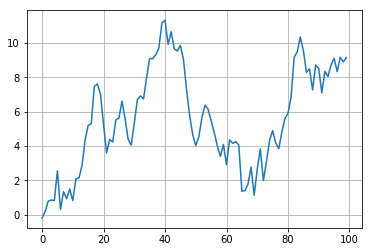

In [101]:
fig, ax = plt.subplots()
ax.plot(y)
ax.grid()
plt.show()

En los enlaces anteriores que apuntan a la documentación de la función y del método grid tenemos acceso a los diferentes parámetros que nos permiten configurarlo, destacando:

* **alpha**: grado de transparencia
* **color**: color de las líneas del grid
* **linestyle**: estilo de las líneas ('-', '--', '-.', ':', etc.)
* **linewidth**: ancho de las líneas

En el siguiente ejemplo se fijan dichos parámetros:

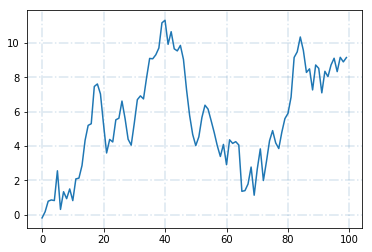

In [102]:
fig, ax = plt.subplots()
ax.plot(y)
ax.grid(
    alpha = 0.2,
    color = "SteelBlue",
    linestyle = "-.",
    linewidth = 1.5
)
plt.show()

Tanto la función como el método grid aceptan, además de los parámetros que personalizan los diferentes atributos, varios parámetros adicionales:

* **&#98;**: booleano que indica si se muestran o no las líneas
* **which**: este parámetro puede tomar los valores 'major', 'minor' o 'both', indicando si estamos configurando el grid correspondiente a las marcas principales, a las secundarias o a ambas.
* **axis**: parámetro que puede tomar los valores 'both', 'x' o 'y', y que indica a qué eje vamos a aplicar la configuración.

Esto nos permite dar formato al grid con un alto grado de detalle. En el siguiente ejemplo estamos mostrando las marcas principales y las secundarias tanto para el eje x como para el eje y, y estableciendo un formato diferente para cada uno de los conjuntos de marcas (eje x/principales, eje x/secundarias, eje y/principales y eje y/secundarias):

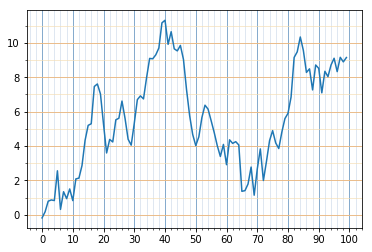

In [103]:
fig, ax = plt.subplots()
ax.plot(y)

# Eje x
ax.xaxis.set_major_locator(MultipleLocator(10))
ax.xaxis.set_minor_locator(MultipleLocator(2))
# Eje y
ax.yaxis.set_major_locator(MultipleLocator(2))
ax.yaxis.set_minor_locator(MultipleLocator(1))

ax.grid(which = "major", axis = "x", color = "SteelBlue")
ax.grid(which = "minor", axis = "x", color = "LightSteelBlue", alpha = 0.5)

ax.grid(which = "major", axis = "y", color = "Chocolate")
ax.grid(which = "minor", axis = "y", color = "Wheat", alpha = 0.8)

plt.show()

### Leyenda

La función [matplotlib.pyplot.legend](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.legend.html) y el método [legend](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.legend.html#matplotlib.axes.Axes.legend) de un conjunto de ejes muestra la leyenda en el gráfico. Vimos en su momento que uno de los parámetros que podemos pasar a la función [plot](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.plot.html) es **label**. Esta etiqueta es la que se mostrará en la leyenda representando a la gráfica. Para ver cómo funciona, partamos de dos conjuntos de datos a representar en sendas gráficas, y mostremos éstas con su *label* correspondiente:

In [104]:
y1 = np.random.randn(100).cumsum()
y2 = np.random.randn(100).cumsum()

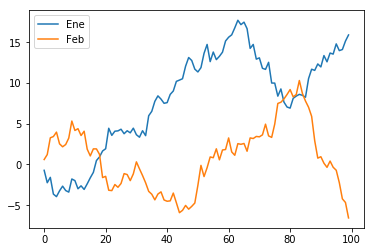

In [105]:
fig, ax = plt.subplots()
ax.plot(y1, label = "Ene")
ax.plot(y2, label = "Feb")
ax.legend()
plt.show()

Se ha aplicado a la primera gráfica la etiqueta "Ene" y a la segunda "Feb", y vemos que son precisamente estas etiquetas las que se muestran en la leyenda.

Estas etiquetas se pueden sobreescribir al llamar a la función o método *legend* si pasamos los nuevos valores como argumentos:

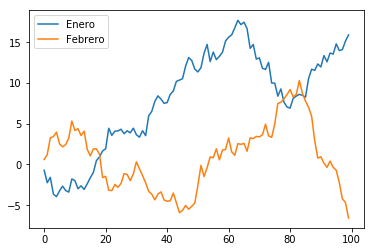

In [106]:
fig, ax = plt.subplots()
ax.plot(y1, label = "Ene")
ax.plot(y2, label = "Feb")
ax.legend(["Enero", "Febrero"])
plt.show()

El código de la imagen anterior es el mismo que el mostrado anteriormente salvo por el hecho de que, como argumento del método legend, se incluye una lista con las nuevas etiquetas.

La posición de la leyenda es determinada por matplotlib en función de la distribución de las gráficas que se estén mostrando de forma que moleste lo menos posible. Pero podemos determinar la posición nosotros usando el parámetro **loc**. Éste puede tomar como valor una cadena de texto o un número:

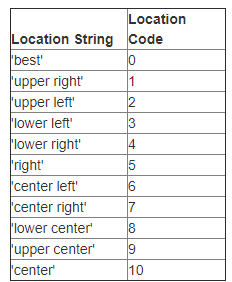

Por ejemplo, si deseásemos mostrar la leyenda en la esquina inferior derecha, el código a usar sería el siguiente:

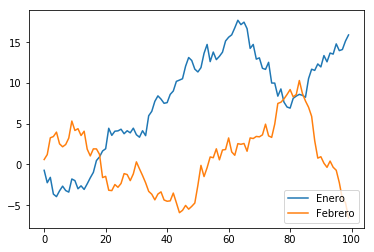

In [107]:
fig, ax = plt.subplots()
g1 = ax.plot(y1, label = "Ene")
g2 = ax.plot(y2, label = "Feb")
ax.legend(["Enero", "Febrero"], loc = "lower right")
plt.show()

Hemos usado la instrucción

ax.legend(["Enero", "Febrero"], loc = "lower right")

...pero también podríamos haber usado

ax.legend(["Enero", "Febrero"], loc = "4")

También podemos pasar al parámetro *col* una tupla con la posición x e y de la leyenda con respecto al ancho y alto del área de la gráfica. Por ejemplo:

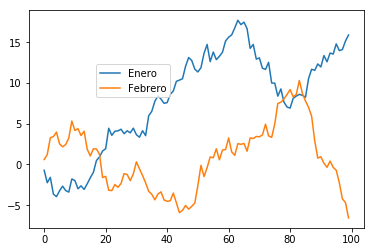

In [108]:
fig, ax = plt.subplots()
g1 = ax.plot(y1, label = "Ene")
g2 = ax.plot(y2, label = "Feb")
ax.legend(["Enero", "Febrero"], loc = (0.2, 0.6))
plt.show()

Hay, en todo caso, otros parámetros de esta función (y método) interesantes:

* **ncol**: este parámetro permite especificar el número de columnas en las que se van a mostrar las etiquetas en la leyenda (por defecto es 1):

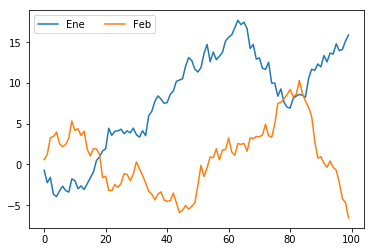

In [109]:
fig, ax = plt.subplots()
g1 = ax.plot(y1, label = "Ene")
g2 = ax.plot(y2, label = "Feb")
ax.legend(ncol = 2)
plt.show()

* **fontsize**: este parámetro determina el tamaño de la fuente.
* **shadow**: muestra u oculta una sombra alrededor de la leyenda.
* **facecolor**: establece el color de fondo de la leyenda.
* **edgecolor**: establece el color del borde de la leyenda.
* **title**: fija un título para la leyenda
* **title_fontsize**: establece el tamaño del título de la leyenda

En el siguiente ejemplo se hace uso de estos parámetros:

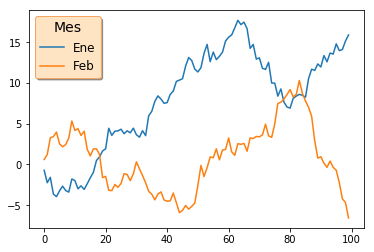

In [110]:
fig, ax = plt.subplots()
g1 = ax.plot(y1, label = "Ene")
g2 = ax.plot(y2, label = "Feb")
ax.legend(
    fontsize = 12,
    shadow = True,
    facecolor = "Bisque",
    edgecolor = "SandyBrown",
    title = "Mes",
    title_fontsize = 14
)
plt.show()

En la documentación podemos encontrar el listado completo de parámetros que podemos usar.

# Estilos y mapas de color
<div style = "float:right"><a style="text-decoration:none" href = "#inicio">Inicio</a></div>

Dos recursos gráficos a los que podemos recurrir son los estilos -mapas de atributos que definen el estilo gráfico en matplotlib- y los mapas de color (**cmap**), diccionarios que transforman unos colores en otros.

### Estilos

Las versiones más recientes de matplotlib permiten la aplicación de "estilos" que mejoran la apariencia de las gráficas creadas o que las modifican de forma tal que las hacen más amigables en ciertos entornos.

Podemos comprobar los estilos disponibles con la instrucción **plt.style.available**:

In [111]:
plt.style.available

['bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn-bright',
 'seaborn-colorblind',
 'seaborn-dark-palette',
 'seaborn-dark',
 'seaborn-darkgrid',
 'seaborn-deep',
 'seaborn-muted',
 'seaborn-notebook',
 'seaborn-paper',
 'seaborn-pastel',
 'seaborn-poster',
 'seaborn-talk',
 'seaborn-ticks',
 'seaborn-white',
 'seaborn-whitegrid',
 'seaborn',
 'Solarize_Light2',
 'tableau-colorblind10',
 '_classic_test']

Para usar un estilo, por ejemplo, "seaborn", basta ejecutar la siguiente instrucción:

plt.style.use("seaborn")

A continuación se muestran dos gráficas en todos los estilos disponibles. Puede apreciarse la mejora que supone el uso de estilos con respecto al estilo "classic" propio de matplotlib. Obsérvese también que hay estilos que -al menos para las gráficas y elementos mostrados- no aparentan mostrar diferencias:

In [112]:
styles = plt.style.available

In [113]:
y1 = np.random.randn(100).cumsum()
y2 = np.random.randn(100) * 10

In [114]:
def showGraphs(style):
    plt.style.use(style)
    fig, ax = plt.subplots(1, 2)
    fig.set_size_inches(10, 3)
    fig.suptitle('Estilo ' + style,
                 fontsize = 16,
                 backgroundcolor = "DarkCyan",
                 color = "w",
                 position = (0.5, 1.1)
                )
    ax[0].plot(y1)
    ax[1].hist(y2)
    plt.show()

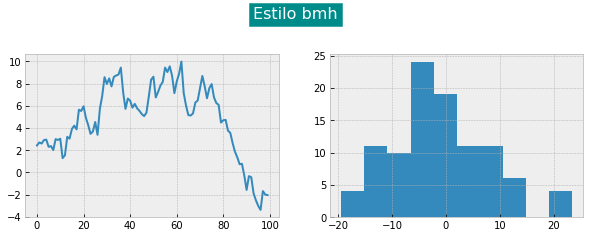

In [115]:
showGraphs(styles[0])

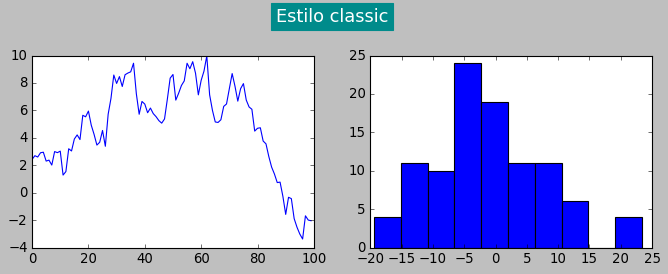

In [116]:
showGraphs(styles[1])

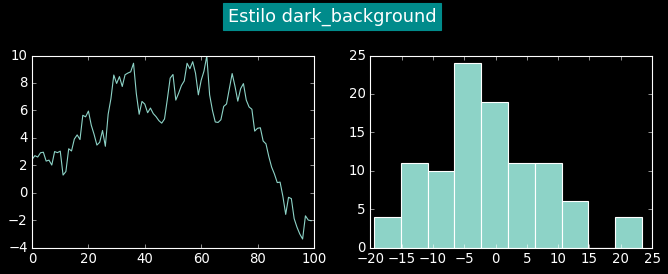

In [117]:
showGraphs(styles[2])

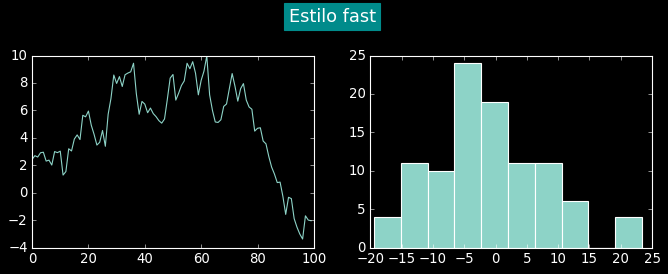

In [118]:
showGraphs(styles[3])

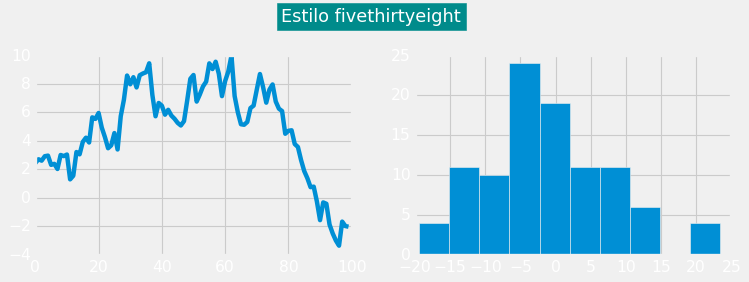

In [119]:
showGraphs(styles[4])

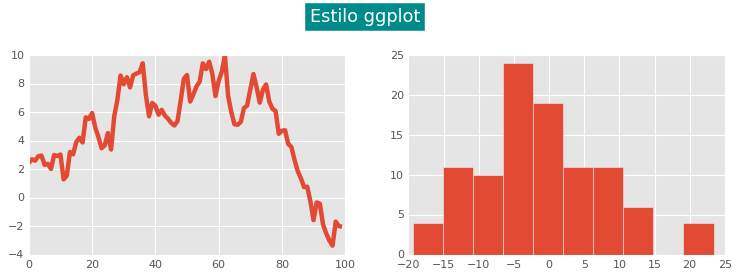

In [120]:
showGraphs(styles[5])

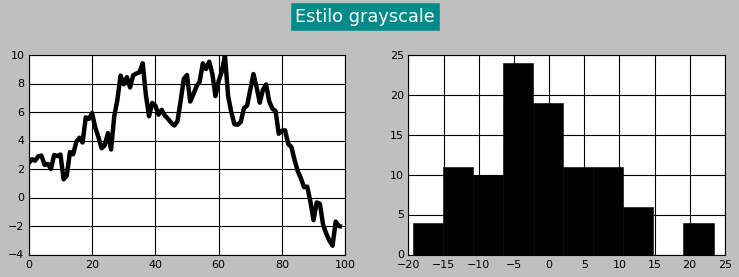

In [121]:
showGraphs(styles[6])

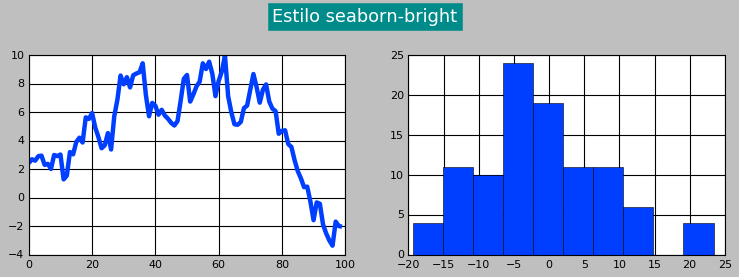

In [122]:
showGraphs(styles[7])

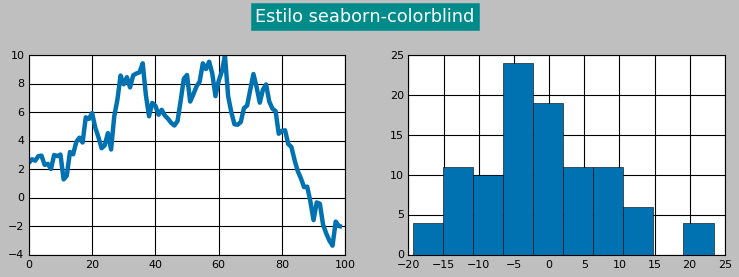

In [123]:
showGraphs(styles[8])

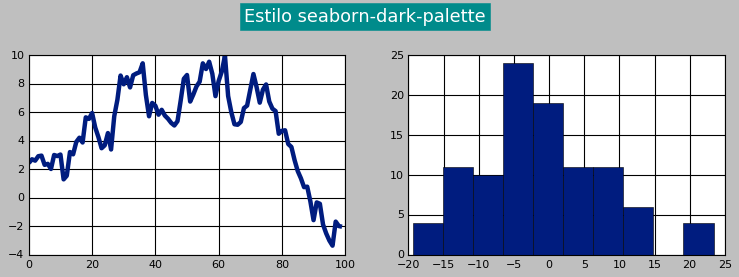

In [124]:
showGraphs(styles[9])

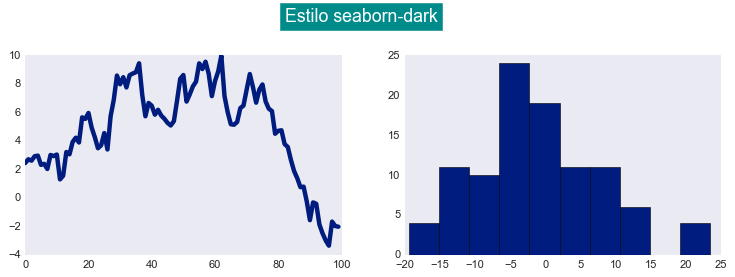

In [125]:
showGraphs(styles[10])

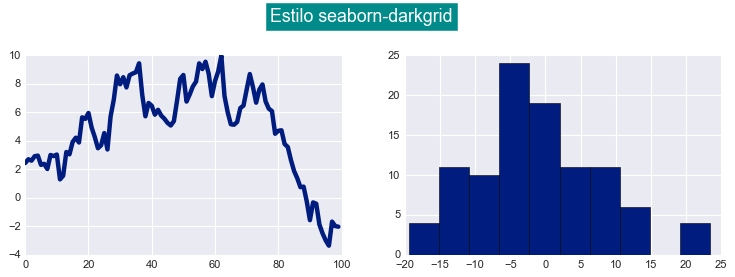

In [126]:
showGraphs(styles[11])

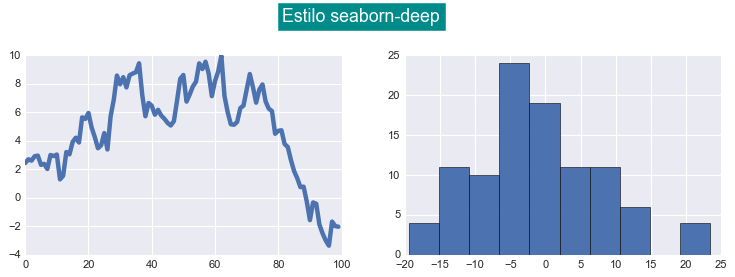

In [127]:
showGraphs(styles[12])

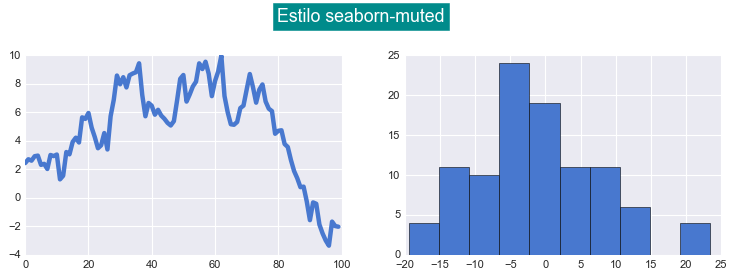

In [128]:
showGraphs(styles[13])

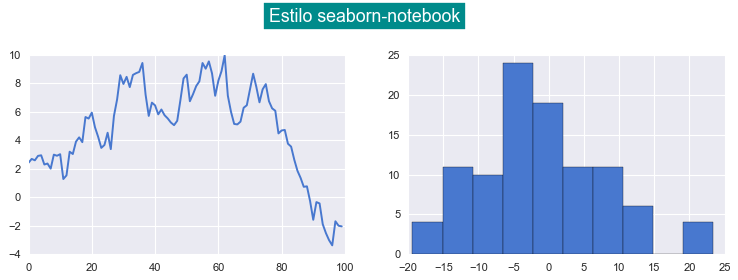

In [129]:
showGraphs(styles[14])

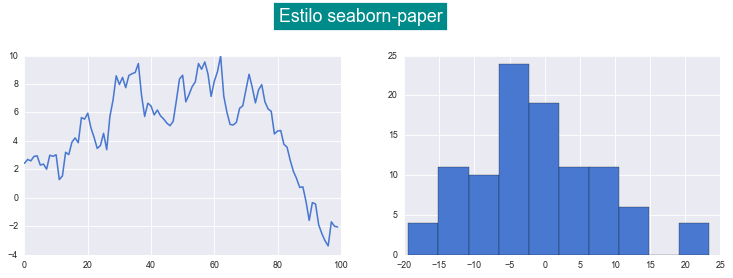

In [130]:
showGraphs(styles[15])

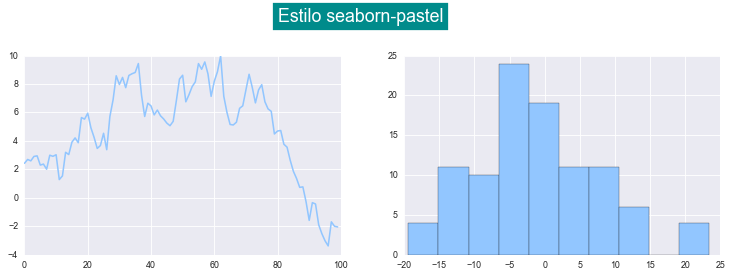

In [131]:
showGraphs(styles[16])

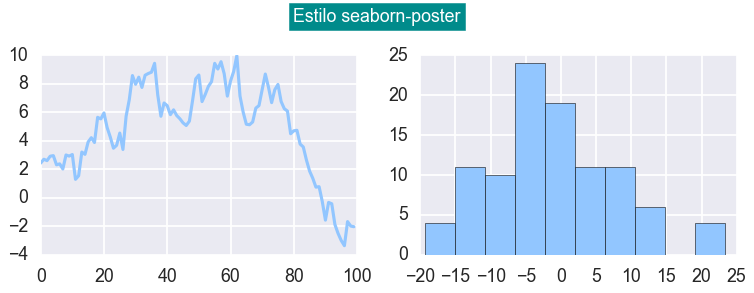

In [132]:
showGraphs(styles[17])

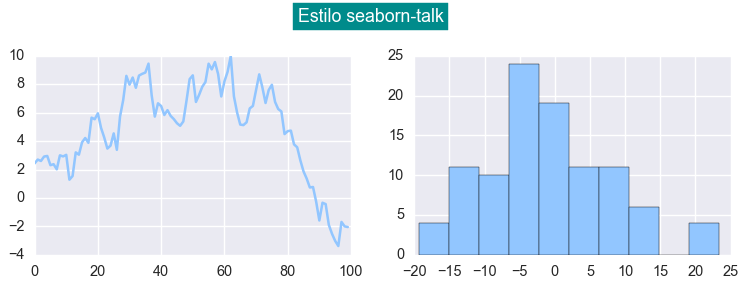

In [133]:
showGraphs(styles[18])

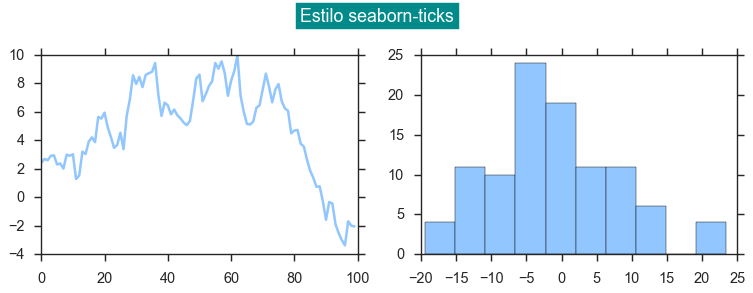

In [134]:
showGraphs(styles[19])

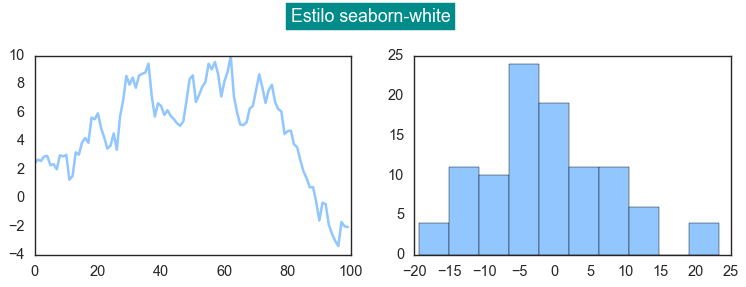

In [135]:
showGraphs(styles[20])

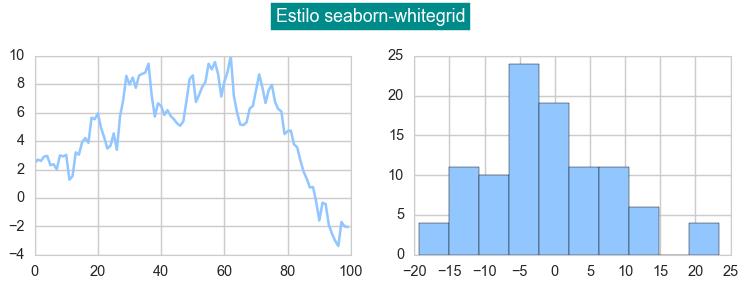

In [136]:
showGraphs(styles[21])

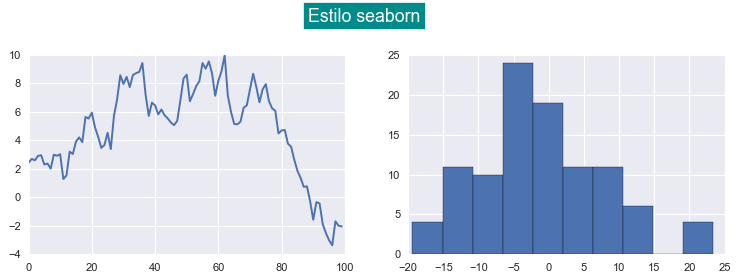

In [137]:
showGraphs(styles[22])

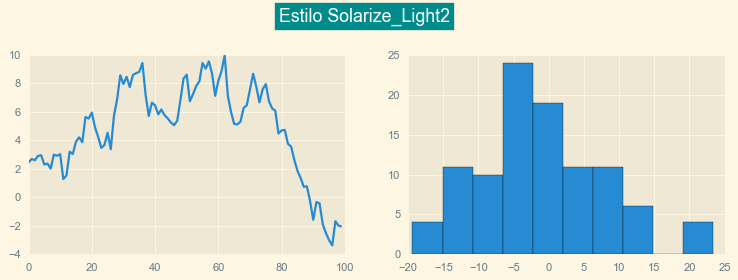

In [138]:
showGraphs(styles[23])

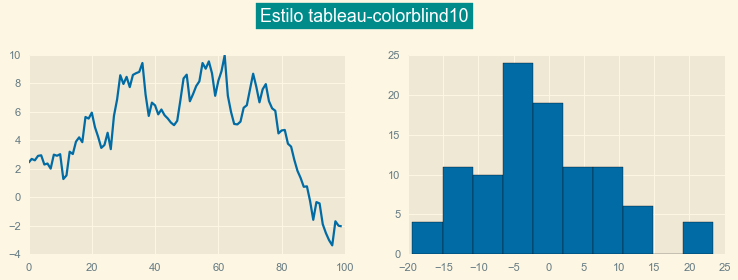

In [139]:
showGraphs(styles[24])

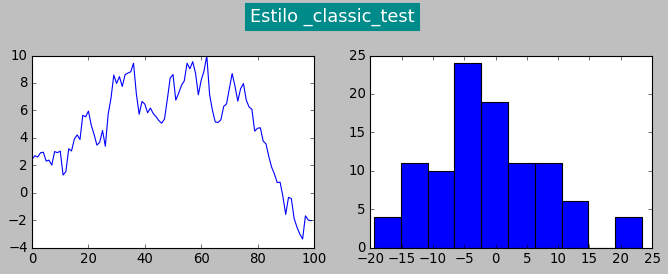

In [140]:
showGraphs(styles[25])

A partir de ahora, usaremos el estilo "seaborn" en las gráficas.

Por cierto, el estilo por defecto (que no se muestra con la instrucción *plt.style.available*) es "*default*". Eso sí, una vez que has usado otro estilo, aun volviendo al estilo "default" verás que los tamaños por defecto de las figuras ha aumentado. Esto se debe a que, probablemente por un error, los puntos por pulgada (dpi) de las figuras, que por defecto toma el valor 72, pasa a valer 100 al activar el estilo "default". Para solucionarlo no tienes más que usar el siguiente código que vuelve a establecer 72 como valor por defecto para todas las figuras:

In [141]:
import matplotlib as mpl
plt.style.use("default")
mpl.rcParams["figure.dpi"] = 72

Eso sí, asegúrate de fijar el valor por defecto (última línea de código) **después** de cambiar al estilo *default*.

### Mapas de color

matplotlib ofrece un conjunto de mapas de color predefinidos. Éstos son diccionarios de colores que "mapean" los valores representados en nuestras gráficas a otros conjunto de colores. La idea detrás de los mapas de colores es encontrar una buena representación en espacios tridimensionales, colores capaces de transmitir la sensación de profundidad que los colores lisos no transmiten correctamente. La elección correcta de un mapa de color puede cambiar radicalmente la forma en la que percibimos una gráfica. Puedes encontrar documentación sobre estos mapas de colores [en esta página de matplotlib](https://matplotlib.org/tutorials/colors/colormaps.html).

Las funciones gráficas que soportan mapas de color aceptan el parámetro **cmap**. Éste deberá tomar un valor correspondiente a un mapa de color existente, como "viridis" o "BrBG".

Ten en cuenta que los estilos pueden interferir en la forma en la que se aplican los mapas de color.

A modo de ejemplo, se muestran a continuación una gráfica 3D generada con matplotlib usando diferentes mapas de color:

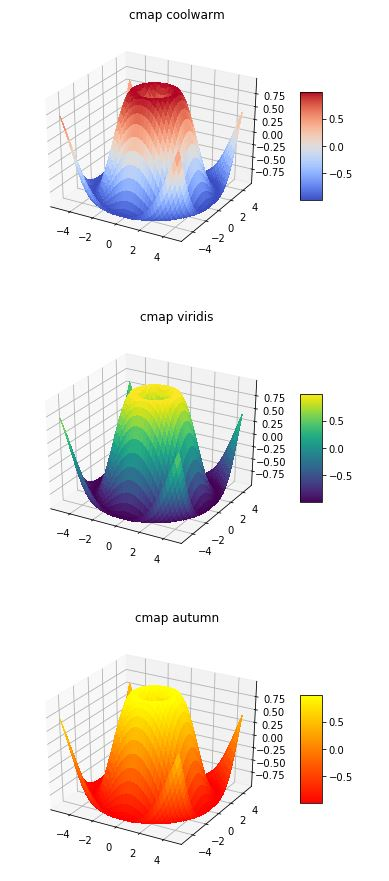

# Adición de otros elementos gráficos
<div style = "float:right"><a style="text-decoration:none" href = "#inicio">Inicio</a></div>

Frecuentemente nos encontraremos en el caso de querer destacar algún elemento de nuestra visualización para que el lector de la misma pueda enfocarse rápidamente en los aspectos más importantes. matplotlib nos ofrece la posibilidad de incluir textos y otros elementos gráficos adicionales. Veamos cómo se hace.

### Textos

El primero de los elementos que vamos a ver son los textos, útiles cuando deseamos destacar algún punto en la gráfica o transmitir información que ayude a su interpretación. Tenemos una función para esto: [matplotlib.pyplot.text](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.text.html), función que tiene su [método equivalente aplicable a un conjunto de ejes](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.text.html).

Su funcionamiento es muy sencillo: se pasan como los dos primeros argumentos las coordenadas x e y (con respecto a los datos mostrados en la gráfica) en las que queremos que se muestre el texto y, como tercer argumento, el texto a mostrar. Por ejemplo:

In [142]:
y = np.random.randn(100).cumsum()

In [143]:
plt.style.use("seaborn")

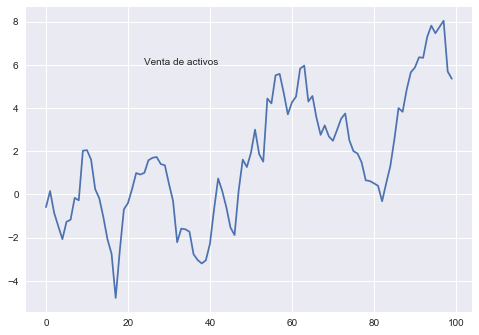

In [144]:
fig, ax = plt.subplots()
ax.plot(y)
ax.text(24, 6, "Venta de activos")
plt.show()

Podemos pasar como parámetros adicionales todos los atributos del texto que ya hemos visto:

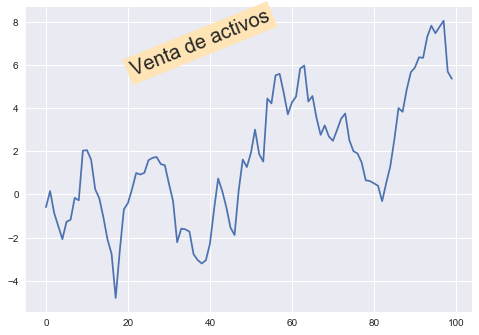

In [145]:
fig, ax = plt.subplots()
ax.plot(y)
ax.text(20, 8, "Venta de activos",
        rotation = 22,
        fontsize = 20,
        backgroundcolor = "Moccasin")
plt.show()

Por defecto, la posición x e y dadas van referidas a los datos, como se ha comentado. Pero es posible modificar este comportamiento con el parámetro **transform**: Si toma el valor *ax.transAxes*, las posiciones serán interpretadas con respecto a las dimensiones de los ejes, siendo el punto (0, 0) el correspondiente a la esquina inferior izquierda de la gráfica, y el punto (1, 1) el correspondiente a la esquina superior derecha de la misma:

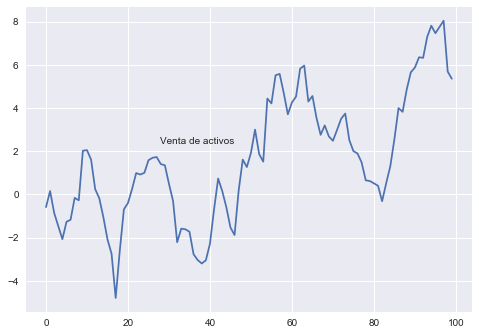

In [146]:
fig, ax = plt.subplots()
ax.plot(y)
ax.text(0.3, 0.55, "Venta de activos", transform = ax.transAxes)
plt.show()

Si el parámetro **transform** toma el valor *fig.transFigure*, las coordenadas serán interpretadas con respecto a las dimensiones de la figura, siendo el punto (0, 0) el correspondiente a la esquina inferior izquierda de la figura, y el punto (1, 1) el correspondiente a la esquina superior derecha de la misma. Hagamos un ejemplo con una figura de 2x2 conjuntos de ejes:

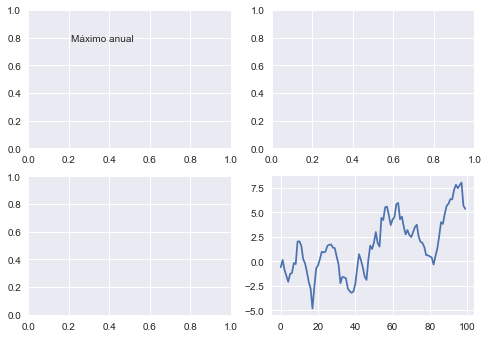

In [147]:
fig, ax = plt.subplots(2, 2)
ax[1, 1].plot(y)
ax[1, 1].text(0.2, 0.8, "Máximo anual", transform = fig.transFigure)
plt.show()

En esta matriz de conjuntos de ejes hemos situado nuestra gráfica en el conjunto de ejes que ocupa la posición (1, 1) -esquina inferior derecha-. Si quisiéramos que la etiqueta se mostrara en la esquina superior derecha de la gráfica, tendría que tener unas coordenadas de, aproximadamente, (0,5, 0.5) -es decir, cerca del centro de la figura-. Como las coordenadas fijadas en el ejemplo anterior son (0.2, 0.8), el texto se ha ido hasta el cuadrante que ocupa la posición superior izquierda.

### Anotaciones

Es posible "anotar" una posición (x, y) con un texto, lo que no supone más que añadir el texto en la posición indicada -de forma semejante a como hace la función text-. La diferencia es que el texto puede ser mostrado en otras coordenadas, pudiendo mostrarse una flecha desde el texto hasta el punto que estamos "anotando". En su forma más básica, a la función [matplotlib.pyplot.annotate](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.annotate.html) (o al [método equivalente del conjunto de ejes](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.annotate.html)) simplemente le damos el texto a mostrar y una tupla con las coordenadas del punto que queremos anotar:

In [148]:
np.random.seed(18)
y = np.random.randn(100).cumsum()

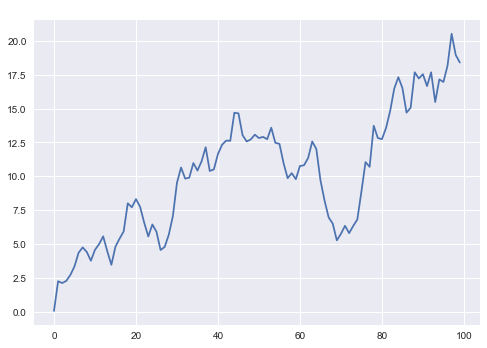

In [149]:
fig, ax = plt.subplots()
ax.plot(y)
ax.annotate("Máximo local", (70, 22))
plt.show()

Si le damos a la función como argumento una segunda tupla con posiciones, el texto se mostrará en éstas, con el punto "anotado" en la posición inicial:

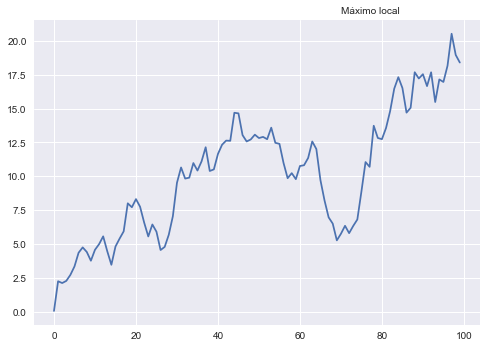

In [150]:
fig, ax = plt.subplots()
ax.plot(y)
ax.annotate("Máximo local", (96, 20.5), (70, 22))
plt.show()

Sin embargo el resultado, como vemos en la imagen anterior, no parece muy coherente: el texto se muestra en el segundo par de posiciones dadas, es cierto, pero no hay ninguna señal que distinga el punto siendo anotado: es como si estuviésemos anotando el punto (70, 22), y no el (96, 20.5). La forma de dar coherencia a esto es forzando que se muestre la flecha que apunta desde la etiqueta hasta el punto siendo anotado, y la forma de hacer esto es añadiendo el parámetro **arrowprops**. Este parámetro es un diccionario en el que se definen las propiedades de la flecha. Pero basta con que se trate de un diccionario vacío para que se muestre la flecha con sus atributos por defecto:

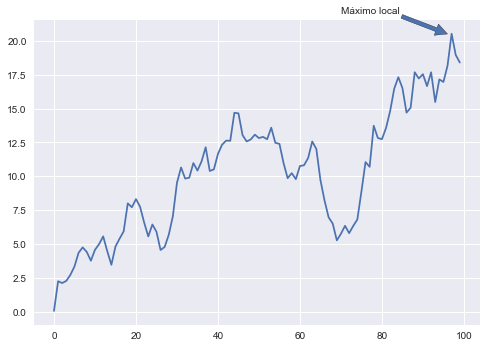

In [151]:
fig, ax = plt.subplots()
ax.plot(y)
ax.annotate("Máximo local", (96, 20.5), (70, 22), arrowprops = dict())
plt.show()

Puedes consultar en la [documentación de matplotlib](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.annotate.html) la posible configuración de la flecha.

### Líneas

matplotlib incluye funciones para la creación de líneas horizontales, verticales y líneas con cualquier punto de origen y fin. En las siguientes tres secciones revisaremos estas funciones y haremos algunos ejemplos sencillos.

#### Líneas horizontales

La función [matplotlib.pyplot.axhline](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.axhline.html) añade una línea horizontal al conjunto de ejes. Su principal parámetro, **&#121;**, controla la coordenada y de la línea:

In [152]:
np.random.seed(18)
y = np.random.randn(100).cumsum()

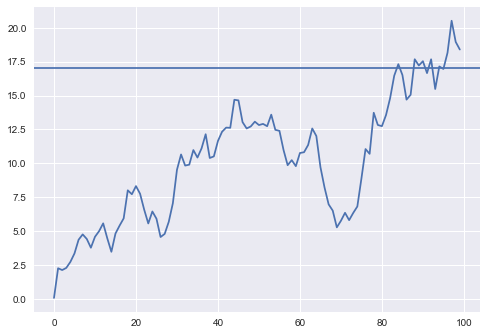

In [153]:
plt.plot(y);
plt.axhline(17);

Esta función admite muchos de los modificadores vistos: color, ancho de línea, etc.:

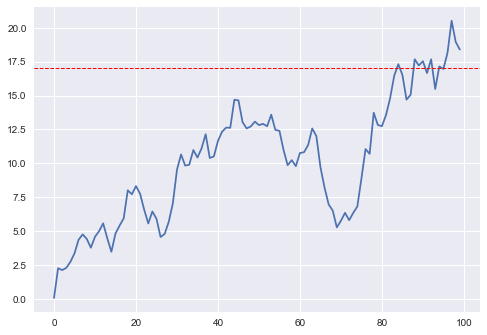

In [154]:
plt.plot(y);
plt.axhline(17, color = "red", linewidth = 1, linestyle = "dashed");

#### Líneas verticales

La función [matplotlib.pyplot.axvline](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.axvline.html) es equivalente a la anterior, mostrando una línea vertical cuya coordenada x se controla mediante el parámetro x:

In [155]:
np.random.seed(18)
y = np.random.randn(100).cumsum()

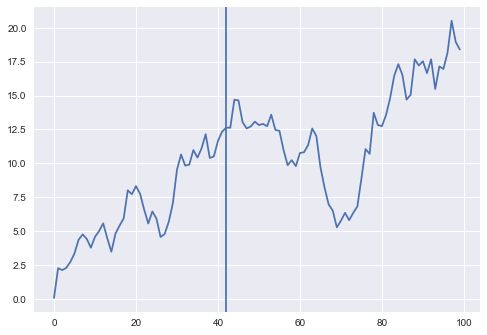

In [156]:
plt.plot(y);
plt.axvline(42);

También aquí podemos dar formato a la línea:

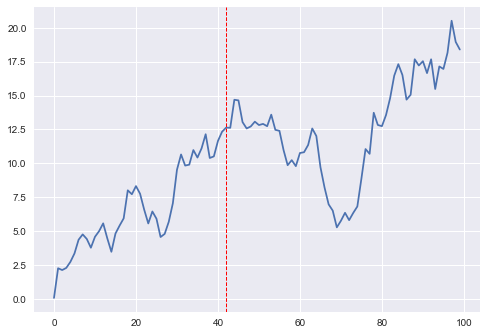

In [157]:
plt.plot(y);
plt.axvline(42, color = "red", linewidth = 1, linestyle = "dashed");

#### Otras líneas

Podemos mostrar líneas con cualquier punto de origen y cualquier punto de finalización con la función [matplotlib.lines.Line2D](https://matplotlib.org/api/_as_gen/matplotlib.lines.Line2D.html). Obsérvese que esta función no está en la sublibrería *pyplot*, lo que exige una importación diferente de la vista hasta ahora para la mayor parte de las funciones: o bien importamos matplotlib, o matplotlib.lines o directamente la función desde esta última librería:

In [158]:
from matplotlib.lines import Line2D

In [159]:
np.random.seed(18)
y = np.random.randn(100).cumsum()

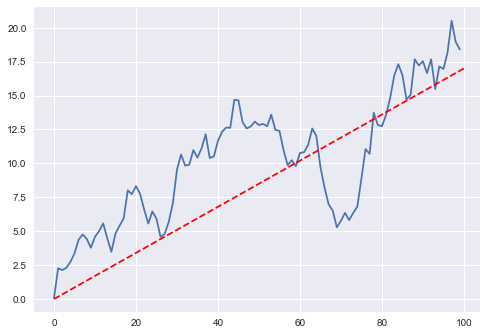

In [160]:
fig, ax = plt.subplots()
plt.plot(y);
l = Line2D([0, 100], [0, 17], color = "red", linestyle = "dashed");
ax.add_line(l);

La función **Line2D** incluye dos parámetros principales: una tupla en la que se incluyen las coordenadas x de los puntos inicial y final de la línea (0 y 100 en el ejemplo anterior) y otra tupla con las coordenadas y de los puntos inicial y final de la línea (0 y 17 en el ejemplo). Una vez ejecutada esta función y almacenado su resultado en una variable, ésta se añade a la gráfica con el método **add_line** del conjunto de ejes.

### Figuras geométricas

Resulta relativamente fácil crear figuras geométricas en nuestras gráficas. Todo lo que necesitamos hacer es importar el objeto adecuado de la sublibrería [matplotlib.patches](https://matplotlib.org/api/patches_api.html) ([Rectangle](https://matplotlib.org/api/_as_gen/matplotlib.patches.Rectangle.html), [Circle](https://matplotlib.org/api/_as_gen/matplotlib.patches.Circle.html), [Ellipse](https://matplotlib.org/api/_as_gen/matplotlib.patches.Ellipse.html), [Polygon](https://matplotlib.org/api/_as_gen/matplotlib.patches.Polygon.html), etc.), crear una instancia del objeto, configurarla y, por último, añadir la figura a nuestro conjunto de ejes con el método [ax.add_patch](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.add_patch.html).

Para ver un ejemplo, comencemos importando los objetos mencionados y generando los valores **&#121;** a mostrar en la gráfica:

In [161]:
from matplotlib.patches import Rectangle, Circle, Ellipse, Polygon

In [162]:
np.random.seed(18)
y = np.random.randn(100).cumsum()

A continuación, comencemos mostrando un rectángulo en nuestra gráfica. Podemos ver en la documentación que, para crear una instancia de este objeto, tenemos que pasar una tupla con las coordenadas x e y de la esquina inferior izquierda, la anchura y la altura del rectángulo. Adicionalmente podemos configurar atributos del rectángulo, muchos de los cuales ya son familiares: **alpha**, **facecolor**, **edgecolor**, etc.:

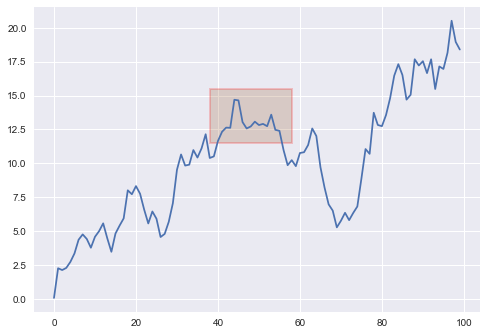

In [163]:
fig, ax = plt.subplots()
ax.plot(y)
rect = Rectangle((38, 11.5), 20, 4,
                 alpha = 0.2,
                 facecolor = "SaddleBrown",
                 edgecolor = "red",
                 linewidth = 2)
ax.add_patch(rect)
plt.show()

La configuración del círculo es semejante, sustituyendo el ancho y el alto por el radio:

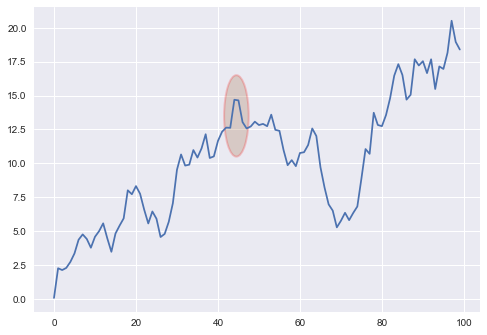

In [164]:
fig, ax = plt.subplots()
ax.plot(y)
rect = Circle((44.5, 13.5), 3,
                 alpha = 0.2,
                 facecolor = "SaddleBrown",
                 edgecolor = "red",
                 linewidth = 2)
ax.add_patch(rect)
plt.show()

Vemos que si los ejes x e y no tienen la misma escala, el círculo se muestra como una elipse.

Probemos, por último, con el polígono. Para configurarlo hay que pasar, en una lista, tuplas con las posiciones de los puntos que lo definen. De esta forma, para crear, por ejemplo, un triángulo, habría que pasar tres tuplas, una para cada esquina:

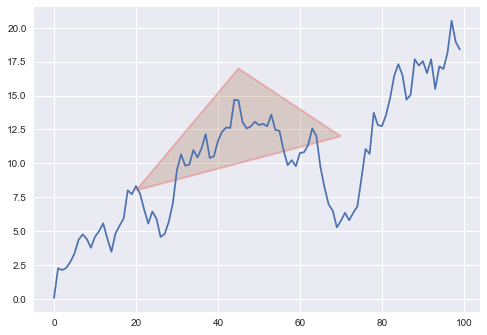

In [165]:
fig, ax = plt.subplots()
ax.plot(y)
polygon = Polygon([[20, 8], [70, 12], [45, 17]],
                 alpha = 0.2,
                 facecolor = "SaddleBrown",
                 edgecolor = "red",
                 linewidth = 2)
ax.add_patch(polygon)
plt.show()

# Gráficos estáticos vs. dinámicos
<div style = "float:right"><a style="text-decoration:none" href = "#inicio">Inicio</a></div>

matplotlib tiene un conjunto de "funciones mágicas" -tal y como se las denomina- con diferentes funciones. Una de ellas es:

In [166]:
%matplotlib inline

Esta instrucción, una vez ejecutada, provoca que las imágenes se muestren estáticas dentro del código (comportamiento por defecto en Jupyter). Por el contrario, la ejecución de la siguiente instrucción:

In [167]:
%matplotlib notebook

...provoca que las imágenes generadas sean interactivas (y se muestren también insertadas en el cuaderno jupyter). Por ejemplo, si generamos una gráfica tras haber ejecutado esta instrucción, obtendremos el siguiente resultado:

<IPython.core.display.Javascript object>


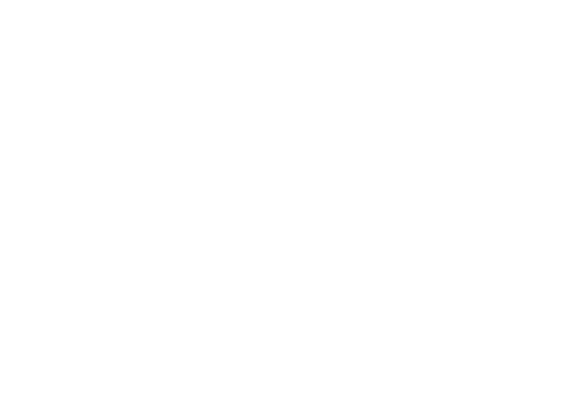

<IPython.core.display.Javascript object>


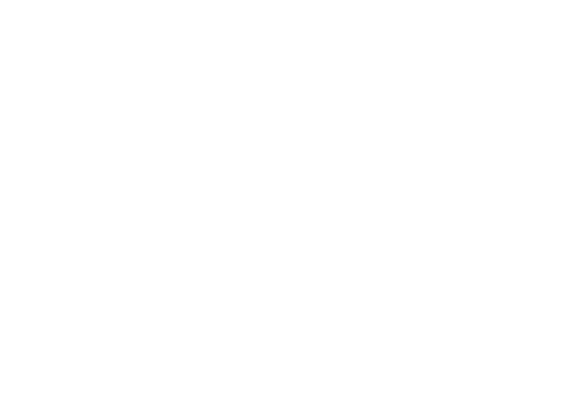

In [168]:
y = np.random.randn(100).cumsum()
fig, ax = plt.subplots()
ax.plot(y)
plt.show()

La gráfica anterior nos permite cierta interactividad. Para empezar, al mover el cursor por encima de la gráfica se muestra en la esquina inferior derecha las coordenadas del cursor en cada momento. Pero, además, vemos que se muestra un conjunto de botones en la parte inferior que nos ofrece funcionalidad adicional: un clic en el segundo botón comenzando por la derecha nos permite amplizar una zona de la gráfica, y un clic en el tercer botón comenzando por la derecha nos permite pinchar la gráfica y desplazarla vertical y horizontalmente.

Un clic en el botón azul que se muestra en la parte superior derecha termina la interactividad y convierte la gráfica en una imagen estática.

Devolvamos el comportamiento "estático" a nuestras gráficas por ahora...

In [169]:
%matplotlib inline

# Gráficos en 2D
<div style = "float:right"><a style="text-decoration:none" href = "#inicio">Inicio</a></div>

Comencemos viendo algunos de los diferentes tipos de gráficos 2D que matplotlib puede generar.

### Gráficos de líneas

Ya hemos visto cómo crear gráficos de líneas usando la función [matplotlib.pyplot.plot](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.plot.html), funcionalidad también accesible como [método de un conjunto de ejes](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.plot.html?highlight=plot#matplotlib.axes.Axes.plot):

In [170]:
sin = np.sin(np.arange(0, 10, 0.1))
cos = np.cos(np.arange(0, 10, 0.1))

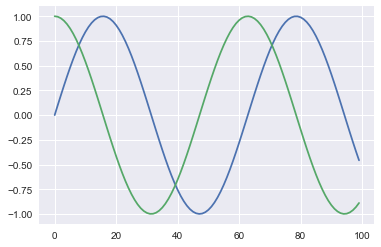

In [171]:
fig, ax = plt.subplots()
ax.plot(sin)
ax.plot(cos)
plt.show()

Los gráficos de líneas se muestran como un conjunto de puntos conectados entre sí mediante una línea. Frecuentemente se usan para representar cómo varía una variable a lo largo del tiempo o a lo largo de otra variable independiente. Este tipo de gráficas nos permite identificar fácilmente los valores máximos y mínimos, pudiendo mostrarse dos o más gráficas superpuestas, como en la imagen anterior.

Esta función es, probablemente, la más usada de matplotlib.

### Gráficos de dispersión

Los gráficos de dispersión, también denominados diagramas de dispersión o scatter plots en la literatura en inglés, se utilizan para comparar los valores que toman dos variables distintas, una de las cuales se representa a lo largo del eje x y la otra a lo largo del eje y. La gráfica resultante nos permite identificar visualmente la posible correlación entre las dos variables.

En mapplotlib, aun cuando es posible crear este tipo de gráficas con la ya conocida función *plt.plot* (basta ocultar las líneas y mostrar solo los puntos), existe una función mucho más potente: la función [matplotlib.pyplot.scatter](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.scatter.html) (funcionalidad también disponible como [método de un conjunto de ejes](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.scatter.html)). Esta función acepta como primeros dos argumentos los valores x e y de los puntos a mostrar. Hagamos un ejemplo sencillo: generemos valores aleatorios extraídos de una distribución normal para los valores de x y de y y crucémoslos en un gráfico de este tipo:

In [172]:
x = np.random.randn(100)
y = np.random.randn(100)

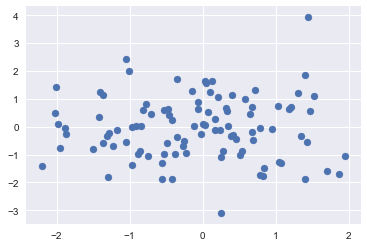

In [173]:
fig, ax = plt.subplots()
ax.scatter(x, y)
plt.show()

Más útil resulta este tipo de gráfica cuando estamos visualizando elementos de diferente clase y los mostramos en el gráfico con diferenes colores. Para probar esta función, vamos a trabajar con datos sencillos pero reales: el [conjunto de datos Iris](https://es.wikipedia.org/wiki/Conjunto_de_datos_flor_iris) conteniendo el ancho y el largo de los pétalos y sépalos de 150 flores de tres especies de Iris (setosa, versicolor y virginica). Vamos a cargarlo en un dataframe pandas con el siguiente código:

In [174]:
data = sns.load_dataset("iris")

In [175]:
data.shape

(150, 5)

In [176]:
data.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


Confirmamos que se trata de 150 registros y que es en la última columna ("*species*") donde se almacena la especie de la flor.

Vamos a cruzar las variables "*sepal_length*" y "*sepal_width*", información que cargaremos en las variables x e y. Pero vamos a usar también el parámetro b: **&#99;** de la función *plt.scatter* que permite indicar cuál es el color de cada uno de los puntos. Es decir, necesitamos una estructura tipo array de 150 elementos que indiquen el color de cada punto, color que representará la especie de cada muestra. Para ello, vamos a crear un diccionario que asocie cada tipo de especie con un color, y vamos a "mapear" la columna "species" con este diccionario:

Mostremos inicialmente los puntos sin aplicarles un color:

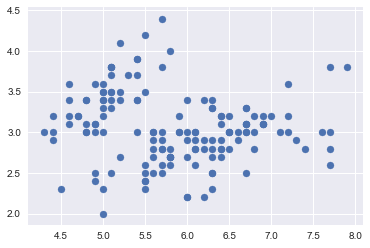

In [177]:
fig, ax = plt.subplots()
ax.scatter(data.sepal_length, data.sepal_width)
plt.show()

Veamos qué valores toma el campo *species*:

In [178]:
pd.unique(data.species)

array(['setosa', 'versicolor', 'virginica'], dtype=object)

In [179]:
colors = {
    "setosa": "Crimson",
    "versicolor": "RoyalBlue",
    "virginica": "DarkSeaGreen"
}
species_color = data.species.map(colors)

Ahora ya podemos pasar a la función *plt.scatter* las dos primeras columnas del dataframe y la recién calculada estructura "species_color" (una serie pandas):

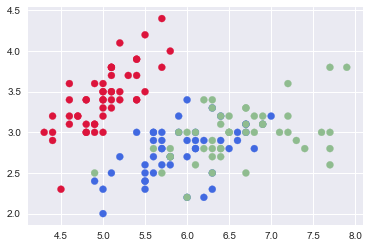

In [180]:
fig, ax = plt.subplots()
ax.scatter(data.sepal_length, data.sepal_width, color = species_color)
plt.show()

Es apreciable la distancia que separa el cluster representado por los puntos rojos (flores "setosa") de los otros dos que se muestran más mezclados.

Si queremos añadir una leyenda nos encontramos con un pequeño problema pues, si recuerdas, la leyenda toma las etiquetas de las diferentes gráficas que se incluyesen en los ejes: si incluíamos tres gráficas (cada una con sus datos), asignábamos a cada una una etiqueta, y era esta etiqueta la mostrada en la leyenda. Esto, trasladado a nuestro ejemplo, significa que si quisiéramos que la leyenda distinguiera entre 'setosa', 'versicolor' y 'virginica', tendríamos que crear tres gráficos de dispersión, uno para cada tipo de flor, y dar a cada uno una etiqueta diferente. Y solo entonces podríamos mostrar la leyenda. Aun cuando resulta un poco más complejo de lo que cabría esperar, podemos hacerlo sin mayor problema. El código es el siguiente:

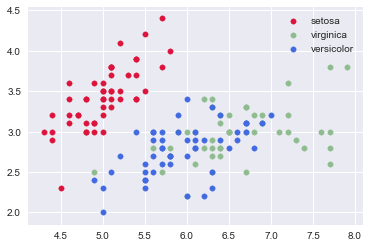

In [181]:
fig, ax = plt.subplots()
for species in set(data.species):
    ax.scatter(
        data.sepal_length[data.species == species],
        data.sepal_width[data.species == species],
        s = 30,
        c = colors[species],
        label = species
    )
plt.legend()
plt.show()

Como ves, tras crear la figura y el conjunto de ejes, recorremos en bucle los tipos de especies y, para cada uno, añadimos un diagrama de dispersión al que pasamos los datos del dataframe *data* que se corresponden solo con la especie que estemos considerando. El parámetro **&#115;** controla el tamaño de los puntos, y seguimos asignando el mismo color que antes a cada especie (usando el mismo diccionario que teníamos).

### Histogramas

matplotlib ofrece funciones para la representación de histogramas de una y de dos variables. Veámoslas por separado:

### Histogramas de una variable

Un histograma es una representación de una variable utilizando barras verticales en la que el tamaño de cada barra es proporcional a la frecuencia de los valores representados. Este tipo de gráfica nos permite saber rápidamente cuál es la distribución de los datos respecto a una característica.

La función [matplotlib.pyplot.hist](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.hist.html) es la encargada de crear histogramas (funcionalidad [también disponible como método](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.hist.html) de un conjunto de ejes). La función recibe como primer argumento el conjunto de datos, en forma de array o tipo semejante. Hagamos un ejemplo sencillo:

In [182]:
y = np.random.randn(10000)

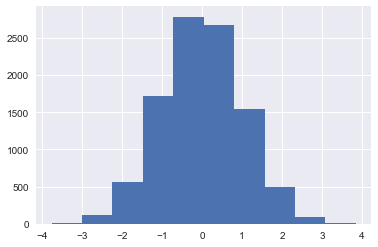

In [183]:
fig, ax = plt.subplots()
ax.hist(y)
plt.show()

Hemos generado 10.000 números aleatorios extraídos de una distribución normal de media 0 y desviación estándar 1, y los hemos pasado a la función, mostrándose las barras con una altura proporcional al número de elementos representados en cada barra. Así, vemos que éstas representan valores entre 0 y 1, entre 1 y 2, entre 2 y 3, etc. Comprobamos también que la barra más alta (la correspondiente a los valores entre 0 y 1) llega hasta el valor (aproximado) de 2.800, lo que significa que, de los 10.000 números, hay unos 2.800 entre dichos valores.

### Resultado devuelto por la función

La función (y el método) *hist* devuelve tres valores. Volvamos a crear el histograma anterior recogiendo los valores devueltos por el método hist en una variable h:

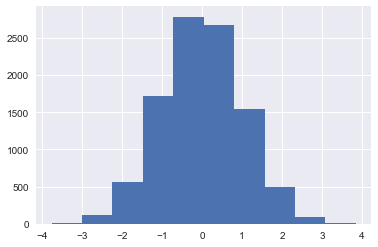

In [184]:
fig, ax = plt.subplots()
h = ax.hist(y)
plt.show()

In [185]:
h

(array([  15.,  118.,  559., 1720., 2783., 2674., 1540.,  495.,   85.,
          11.]),
 array([-3.76359548, -3.0025028 , -2.24141013, -1.48031745, -0.71922478,
         0.0418679 ,  0.80296057,  1.56405324,  2.32514592,  3.08623859,
         3.84733127]),
 <a list of 10 Patch objects>)

Comprobamos que, efectivamente, h contiene tres valores:

* El primero es un array con los valores de las barras o bins -como se llaman en la literatura en inglés- (la altura de cada uno).
* El segundo valor es un array que contiene los límites de cada bin.
* Por último, el tercer valor es una lista de objetos gráficos que representan los bins. El tener acceso a los objetos gráficos que forman la gráfica (en este caso, [objetos rectángulo](https://matplotlib.org/api/_as_gen/matplotlib.patches.Rectangle.html)) nos permite incluso darles formato individual, por ejemplo:

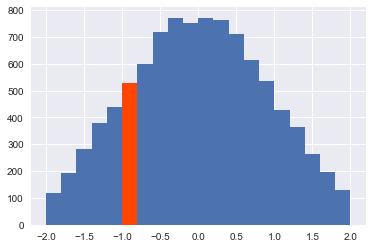

In [186]:
fig, ax = plt.subplots()
h = ax.hist(y, bins = 20, range = (-2, 2))
h[2][5].set_facecolor("OrangeRed")
plt.show()

### bins

En el ejemplo anterior se han creado 10 barras (10 bins). Pero podemos controlar el número de bins con el parámetro homónimo:

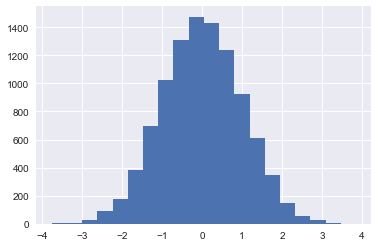

In [187]:
fig, ax = plt.subplots()
ax.hist(y, bins = 20)
plt.show()

En la imagen anterior, hemos creado 20 bins. Ahora, la barra más alta llega hasta 1.500, aproximadamente (por cada barra en el histograma anterior ahora tenemos dos).

### range

Otro de los parámetros aceptados por la función es **range**. Este parámetro controla los valores mínimos y máximos a considerar en el histograma. Por ejemplo, si repetimos el histograma anterior especificando que el valor mínimo sea -2 y el máximo sea 2, el resultado es el mostrado en la siguiente imagen:

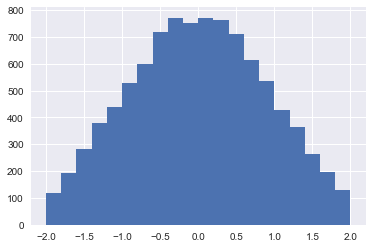

In [188]:
fig, ax = plt.subplots()
h = ax.hist(y, bins = 20, range = (-2, 2))
plt.show()

En este caso, los datos incluidos se repartirán entre el número de bins que se creen (es decir, si hemos especificado 20 bins, se van a crear 20 bins tanto si incluimos todos los datos como si solo consideramos un rango).

### density

Este parámetro, que puede tomar los valores *True*, *False* o *None* (valor por defecto), determina si los valores (alturas) de cada bin se normalizan para formar una función de densidad de probabilidad o no. Hagamos la prueba para los mismos datos con los que estamos trabajando:

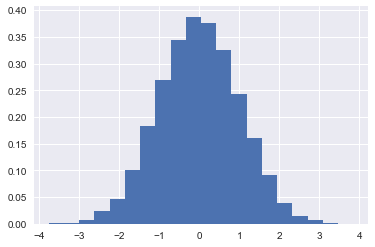

In [189]:
fig, ax = plt.subplots()
v, l, g = ax.hist(y, bins = 20, density = True)
plt.show()

In [190]:
v

array([0.00157668, 0.00236502, 0.00709506, 0.02391299, 0.04651208,
       0.10038199, 0.18368328, 0.26829847, 0.34371636, 0.38760063,
       0.37656387, 0.32611009, 0.24359714, 0.16108419, 0.09092191,
       0.03915423, 0.01550403, 0.00683228, 0.00236502, 0.00052556])

El código usado en la imagen anterior es semejante al usado en los ejemplos anteriores con la adición del parámetro **density**. Y vemos, para empezar, que los bins ya no toman valores en el rango [0, 2.800] como ocurría en la primera versión del histograma que creamos, sino en el rango normalizado [0, 1] (en realidad, solo se muestran valores en el rango [0, 0.40] pues no hay valores por encima de esa cifra en este caso concreto y matplotlib evita mostrar ese espacio vacío). Además, de los tres valores devueltos por la función -que en este caso hemos extraído en tres variables distintas, v, l y g-, el primero de ellos -que hemos visto que devuelve la altura de los bins- toma los valores también normalizados.

### cumulative

Este parámetro, que también toma un valor booleano, determina si el histograma es construido de forma que cada bin incluya sus valores y los anteriores (o no):

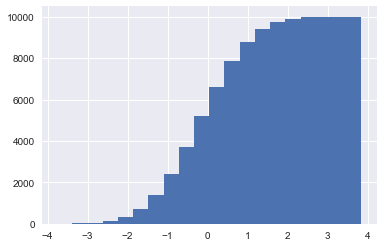

array([6.000e+00, 1.500e+01, 4.200e+01, 1.330e+02, 3.100e+02, 6.920e+02,
       1.391e+03, 2.412e+03, 3.720e+03, 5.195e+03, 6.628e+03, 7.869e+03,
       8.796e+03, 9.409e+03, 9.755e+03, 9.904e+03, 9.963e+03, 9.989e+03,
       9.998e+03, 1.000e+04])

In [191]:
fig, ax = plt.subplots()
v, l, g = ax.hist(y, bins = 20, cumulative = True)
plt.show()
v

Vemos en el resultado obtenido el número de valores en cada uno de los bins (en el último bin se incluyen los 10 mil valores).

Podemos combinar este parámetro con **density** para crear una función de densidad de probabilidad acumulada:

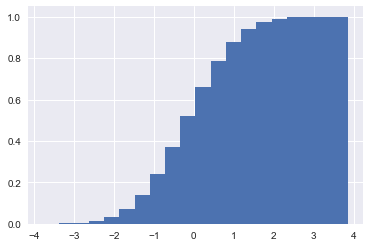

array([6.000e-04, 1.500e-03, 4.200e-03, 1.330e-02, 3.100e-02, 6.920e-02,
       1.391e-01, 2.412e-01, 3.720e-01, 5.195e-01, 6.628e-01, 7.869e-01,
       8.796e-01, 9.409e-01, 9.755e-01, 9.904e-01, 9.963e-01, 9.989e-01,
       9.998e-01, 1.000e+00])

In [192]:
fig, ax = plt.subplots()
v, l, g = ax.hist(y, bins = 20, cumulative = True, density = True)
plt.show()
v

De hecho, si el parámetro **cumulative** toma el valor -1, el histograma se construye al revés: el primer bin toma el valor 1 y a los siguiente se les va restando los valores de aquellos que los preceden:

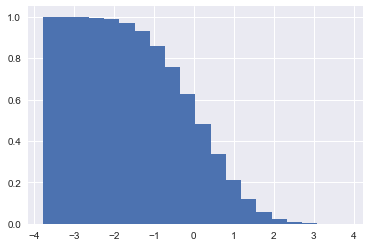

array([1.000e+00, 9.994e-01, 9.985e-01, 9.958e-01, 9.867e-01, 9.690e-01,
       9.308e-01, 8.609e-01, 7.588e-01, 6.280e-01, 4.805e-01, 3.372e-01,
       2.131e-01, 1.204e-01, 5.910e-02, 2.450e-02, 9.600e-03, 3.700e-03,
       1.100e-03, 2.000e-04])

In [193]:
fig, ax = plt.subplots()
v, l, g = ax.hist(y, bins = 20, cumulative = -1, density = True)
plt.show()
v

### orientation

También podemos mostrar el histograma en posición vertical (posición por defecto que hemos visto en todos los ejemplos hasta ahora) o en posición horizontal. Para ello tenemos el parámetro **orientation** que puede tomar los valores '*horizontal*' o '*vertical*':

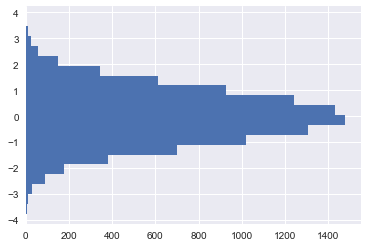

In [194]:
fig, ax = plt.subplots()
ax.hist(y, bins = 20, orientation = "horizontal")
plt.show()

### color

El último parámetro que vamos a destacar de los histogramas es **color**, que determina el color a usar al mostrar las barras:

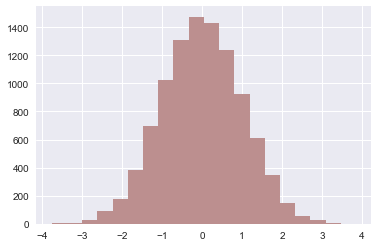

In [195]:
fig, ax = plt.subplots()
ax.hist(y, bins = 20, color = "RosyBrown")
plt.show()

### Etiquetas de barras

La función (y el método) *hist* no dispone de una forma sencilla para mostrar los valores de los bins, cosa que, frecuentemente, resulta extremadamente conveniente. Pero podemos conseguirlo de la siguiente forma: ya hemos visto que, de los tres valores devueltos por la función *hist*, el tercero es una lista con referencias a los objetos gráficos que forman la gráfica (en el caso del histograma dichos elementos son [objetos rectágulo](https://matplotlib.org/api/_as_gen/matplotlib.patches.Rectangle.html)). Si buceamos un poco por la página con la documentación veremos que estos objetos disponen de varios métodos que devuelven su posición y dimensiones: **get_height**, **get_width**, **get_xy**, **get_x** y **get_y**, por ejemplo, de forma que podemos mostrar los valores de los bins (que devuelve la función) en una posición relativa a la posición del rectángulo con la función ya vista [matplotlib.pyplot.text](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.text.html). El código sería el siguiente:

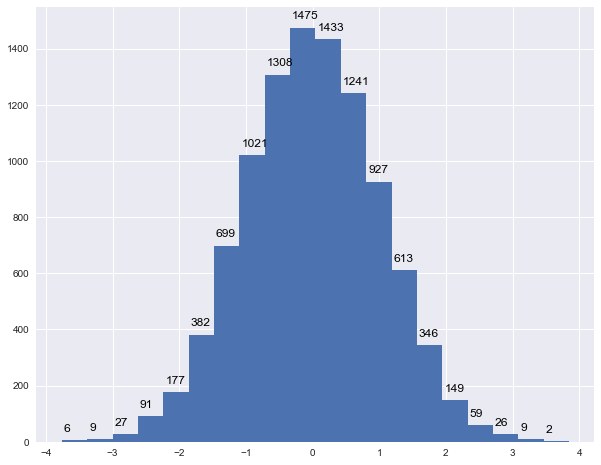

In [196]:
fig, ax = plt.subplots(figsize = (10, 8))
v, m, g = ax.hist(y, bins = 20)
for i, rect in enumerate(g):
    posx = rect.get_x()
    posy = rect.get_height()
    ax.text(posx + 0.03, posy + 30, int(v[i]), color='black', fontsize = 12)
plt.show()

Tras crear el histograma y recoger el resultado en las variables v, m y g, recorremos con un buble for cada uno de los rectángulos referenciados en g. Para cada uno de ellos extraemos su posición x y su altura (que será aproximadamente la posición y del texto a mostrar) utilizando los métodos *get_x* y *get_height*. Por último, mostramos el valor del bin (contenido en v[i]) en la posición (posx, posy) tras ajustar estos valores un poco (este ajuste se hace a mano para que los valores queden más o menos centrados y algo por encima del borde superior del bin, pero podrían haberse mostrado por debajo, por ejemplo). El valor v[i] se convierte a número entero para evitar mostrar decimales que, en este caso, no aportarían mucho y ocuparían espacio de forma innecesaria.

### Histogramas de dos variables

Para probar los histogramas de dos variables -también llamados *histogramas bivariados*- vamos a descargar un dataframe conteniendo información sobre propinas dejadas en un restaurante por los comensales. Este dataframe es proveído por la librería seaborn, de forma que comencemos cargando el dataset:

In [197]:
tips = sns.load_dataset("tips")
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


De las características que ofrece vamos a trabajar con "*total_bill*" (coste total de la comida) y "*tip*" (propina dejada):

In [198]:
x = tips.total_bill
y = tips.tip

Echemos un vistazo a la distribución de estas características mostrando su diagrama de dispersión:

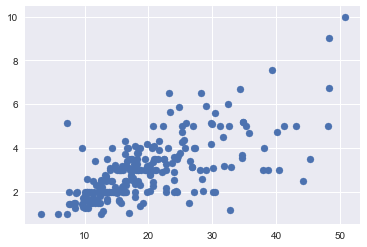

In [199]:
plt.scatter(x, y);

Podemos ver cómo la mayor parte de los puntos definidos por ambas características se concentran en el cuadrante inferior izquierda.

El histograma de dos variables, [matplotlib.pyplot.hist2d](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.hist2d.html), divide el plano en diferentes áreas rectangulares, y considera el número de puntos por área, mostrando cada una con un color diferente en función del número calculado:

In [200]:
plt.style.use("default")

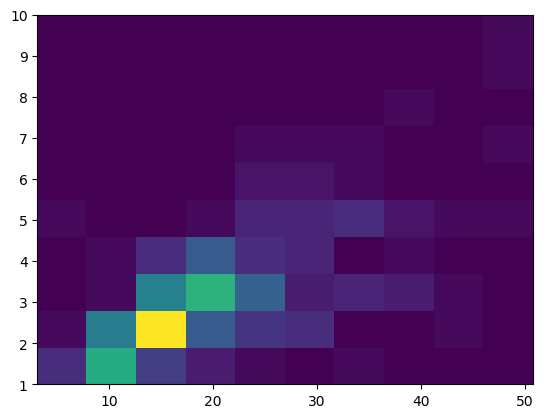

In [201]:
plt.hist2d(x, y);

El área mostrada en amarillo es la correspondiente al área del diagrama de dispersión con mayor número de puntos. Es posible añadir una barra de colores que ayude a la interpretación utilizando la función [matplotlib.pyplot.colorbar](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.colorbar.html):

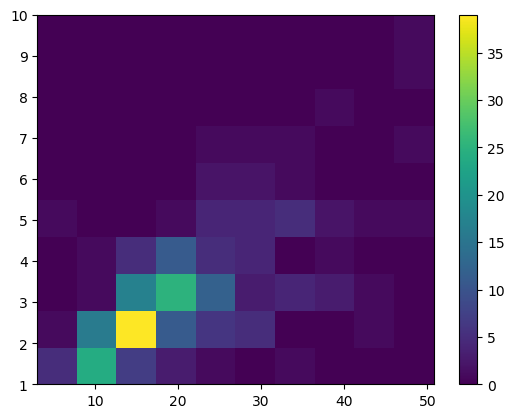

In [202]:
plt.hist2d(x, y);
plt.colorbar();

También es posible modificar el número de áreas en las que dividir el plano utilizando el parámetro **bins**. Si éste es un número, se dividirá tanto el eje x como el eje y en tantos bloque como indique. Si se trata de un array de dos elementos o estructura semejante, el primer número hará referencia al número de bloques en los que dividir el eje vertical, y el segundo al número de bloques en los que dividir el eje horizontal.

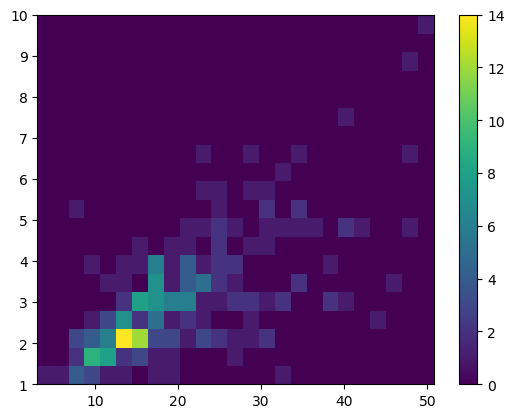

In [203]:
plt.hist2d(x, y, bins = (25, 20));
plt.colorbar();

### Gráficos circulares

El gráfico circular, también llamado gráfico de tarta o, en inglés, pie chart, es adecuado para mostrar proporciones en un conjunto, y es especialmente aconsejable cuando el número de sectores (de valores a mostrar) no es demasiado elevado pues, de otra forma, los sectores del gráfico resultan más difíciles de apreciar.

La función que nos permite mostrar un gráfico circular es [matplotlib.pyplot.pie](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.pie.html), existiendo también un método del conjunto de ejes, [matplotlib.axes.Axes.pie](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.pie.html), con la misma funcionalidad.

En su forma más simple, la función recibe como único argumento una lista con el valor de cada sector:

In [204]:
sns.set()

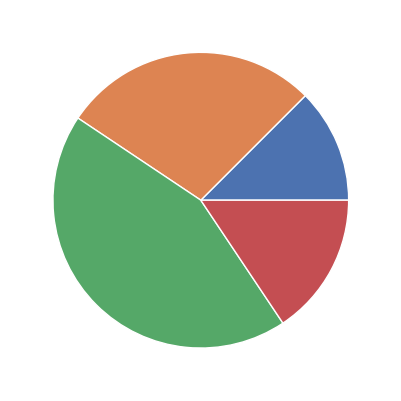

In [205]:
data = [4, 9, 14, 5]
fig, ax = plt.subplots()
g = ax.pie(data)
plt.show()

Podemos pasar los nombres a mostrar en cada sector con el parámetro **label**. El parámetro **colors** nos permite especificar el color de cada uno de los sectores y el parámetro **shadow** controla si mostramos o no una sombra:

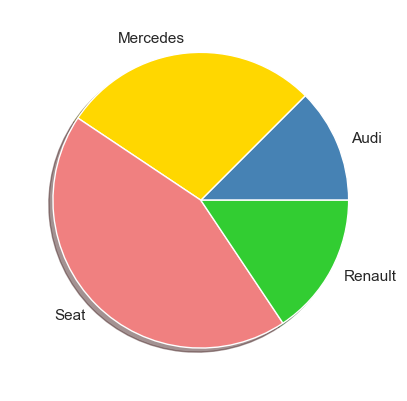

In [206]:
data = [4, 9, 14, 5]
cars = ["Audi", "Mercedes", "Seat", "Renault"]
fig, ax = plt.subplots()
g = ax.pie(
    data,
    labels = cars,
    colors = ["SteelBlue", "Gold", "LightCoral", "LimeGreen"],
    shadow = True
)
plt.show()

La distancia de las etiquetas al centro del gráfico se controla mediante el parámetro **labeldistance** y se mide en radios. Es decir, asignando un valor de 1 provocaríamos que las etiquetas se mostrasen exactamente sobre la circunferencia.

Es posible separar uno o varios de los sectores con el parámetro **explode**: éste recibe una tupla o una lista con tantos valores como sectores haya. Cada valor representa la distancia del sector al centro del gráfico medida en radios. Esto significa que una distancia 0 supone que el sector en cuestión está en su posición inicial junto a los demás. Una distancia mayor significa que dicho sector se separa del centro. En el siguiente ejemplo pasamos al parámetro *explode* la tupla (0.2, 0, 0, 0). El primer valor es el correspondiente a "Audi", por lo que su sector se separará un quinto de radio (0.2):

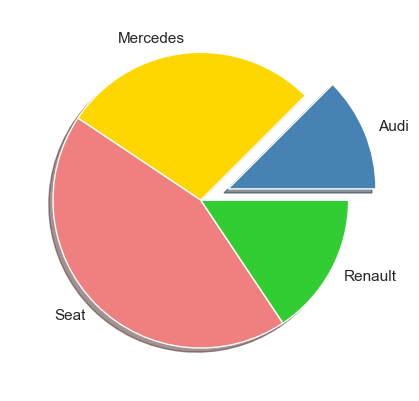

In [207]:
data = [4, 9, 14, 5]
cars = ["Audi", "Mercedes", "Seat", "Renault"]
fig, ax = plt.subplots()
g = ax.pie(
    data,
    labels = cars,
    labeldistance = 1.1,
    colors = ["SteelBlue", "Gold", "LightCoral", "LimeGreen"],
    shadow = True,
    explode = (0.2, 0, 0, 0)
)
plt.show()

Por último, podemos mostrar los porcentajes representados por cada sector utilizando el parámetro **autopct**. Éste toma, por defecto, el valor *None*, pero si le asignamos una cadena de texto que defina un formato, o si le asignamos una función, se mostrará el valor correspondiente. El parámetro **pctdistance** controla la distancia del número mostrado al centro del gráfico, nuevamente en radios. El valor por defecto es 0.6:

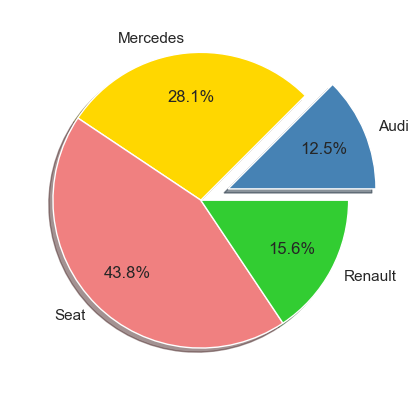

In [208]:
data = [4, 9, 14, 5]
cars = ["Audi", "Mercedes", "Seat", "Renault"]
fig, ax = plt.subplots()
g = ax.pie(
    data,
    labels = cars,
    labeldistance = 1.1,
    colors = ["SteelBlue", "Gold", "LightCoral", "LimeGreen"],
    shadow = True,
    explode = (0.2, 0, 0, 0),
    autopct = '%1.1f%%',
    pctdistance = 0.7
)
plt.show()

### Gráficos de barras

El gráfico de barras es útil para comparar valores de categorías con respecto a un total y, segmentando las barras, ver cómo estas categorías se comportan según este segundo criterio de segmentación.

matplotlib hace muy fácil la creación de este tipo de barras con la función [matplotlib.pyplot.bar](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.bar.html) (o el [método asociado](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.bar.html)). Este gráfico requiere al menos dos argumentos: el primero conteniendo las coordenadas x de las barras, y el segundo conteniendo las alturas de las barras. Por ejemplo:

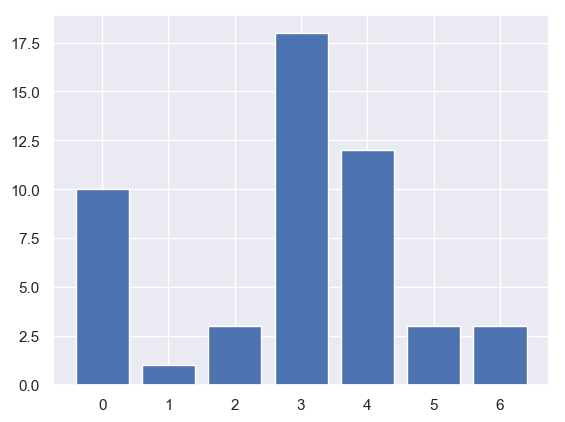

In [209]:
x = np.arange(7)
y = np.random.randint(1, 20, 7)
fig, ax = plt.subplots()
ax.bar(x, y)
plt.show()

Es posible indicar una coordenada y para la base de una columna utilizando el parámetro **bottom**. Esto nos permite mostrar una gráfica de barras apiladas utilizando el mismo conjunto de x generando varias gráficas en el mismo conjunto de ejes, cada una teniendo como inicio (*bottom*) la suma de las anteriores:

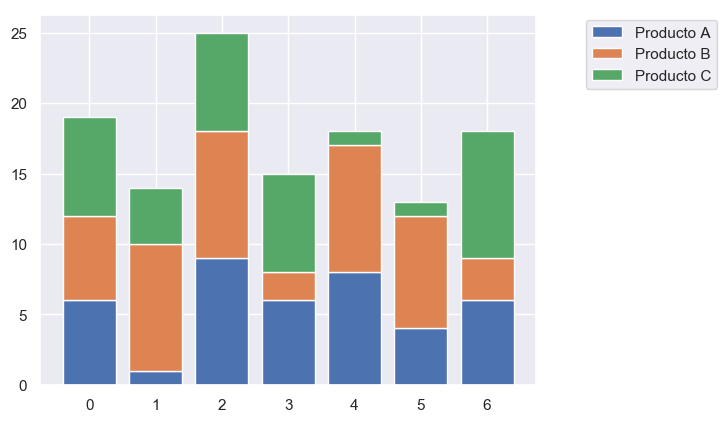

In [210]:
x = np.arange(7)
y1 = np.random.randint(1, 10, 7)
y2 = np.random.randint(1, 10, 7)
y3 = np.random.randint(1, 10, 7)
fig, ax = plt.subplots()
ax.bar(x, y1, label = "Producto A")
ax.bar(x, y2, bottom = y1, label = "Producto B")
ax.bar(x, y3, bottom = y1 + y2, label = "Producto C")
ax.legend(loc = (1.1, 0.8))
plt.show()

En el código anterior, las barras de la primera gráfica (las correspondiente al producto A, azules) tienen como base el valor 0 (valor por defecto), por lo que se muestran pegadas al eje x. Las barras de la segunda gráfica (las correspondientes al producto B, verdes) tiene como valor base los valores de las primeras barras (*bottom = y1*), por lo que se muestran a continuación. Y lo mismo sucede con las barras de la tercera gráfica, que tienen como base la suma de y1 e y2.

Otro de los parámetros disponibles es **width**, que controla el ancho de las barras, permitiéndonos jugar con su apariencia:

In [211]:
y = np.random.randint(1, 20, 7)

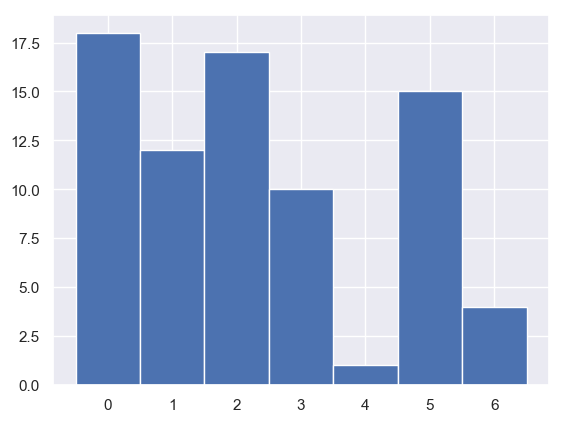

In [212]:
x = np.arange(7)
fig, ax = plt.subplots()
ax.bar(x, y, width = 1.0)
plt.show()

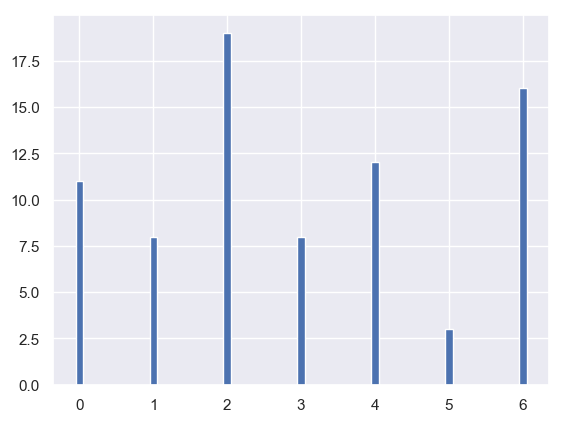

In [213]:
x = np.arange(7)
y = np.random.randint(1, 20, 7)
fig, ax = plt.subplots()
ax.bar(x, y, width = 0.1)
plt.show()

### Gráficos de barras horizontales

La función [matplotlib.pyplot.barh](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.barh.html) (y su [método equivalente](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.barh.html)) es la que nos permite crear este tipo de gráficas. Sus parámetros son equivalentes a los de la función **bar**, intercambiando los parámetros **&#120;** e **&#121;**, básicamente: 

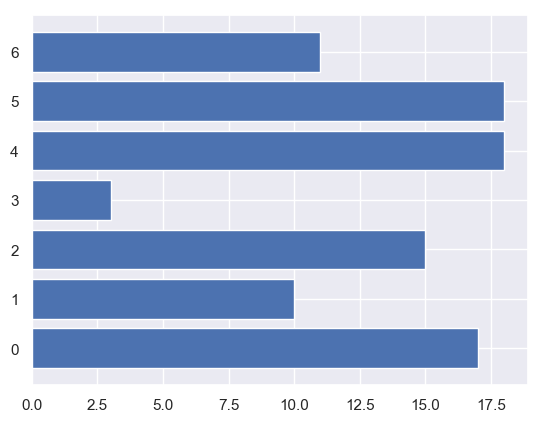

In [214]:
y = np.arange(7)
x = np.random.randint(1, 20, 7)
fig, ax = plt.subplots()
ax.barh(y, x)
plt.show()

También podemos mostrar gráficos de barras apiladas, aunque ahora el parámetro que indica la posición x inicial de las barras es **left**, no *bottom*:

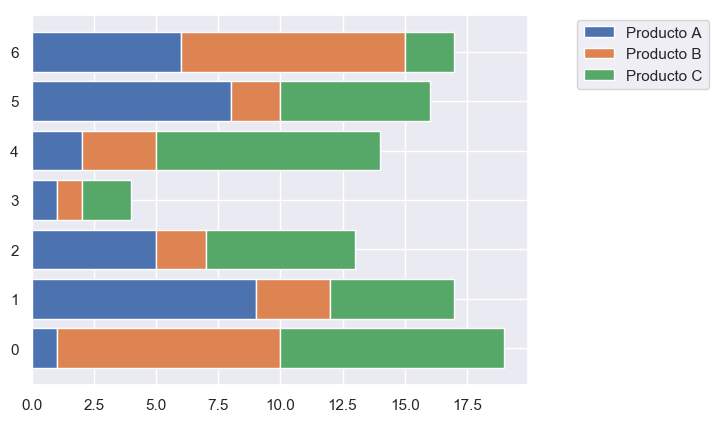

In [215]:
y = np.arange(7)
x1 = np.random.randint(1, 10, 7)
x2 = np.random.randint(1, 10, 7)
x3 = np.random.randint(1, 10, 7)
fig, ax = plt.subplots()
ax.barh(y, x1, label = "Producto A")
ax.barh(y, x2, left = x1, label = "Producto B")
ax.barh(y, x3, left = x1 + x2, label = "Producto C")
ax.legend(loc = (1.1, 0.8))
plt.show()

Y también podemos controlar el ancho de las líneas, aunque aquí el parámetro se llama **height**, lógicamente:

In [216]:
x = np.random.randint(1, 20, 7)

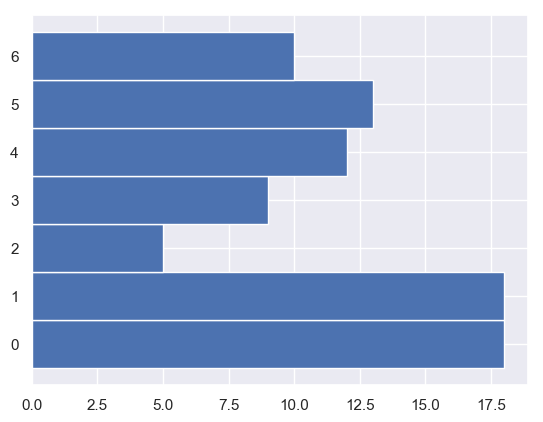

In [217]:
y = np.arange(7)
fig, ax = plt.subplots()
ax.barh(y, x, height = 1)
plt.show()

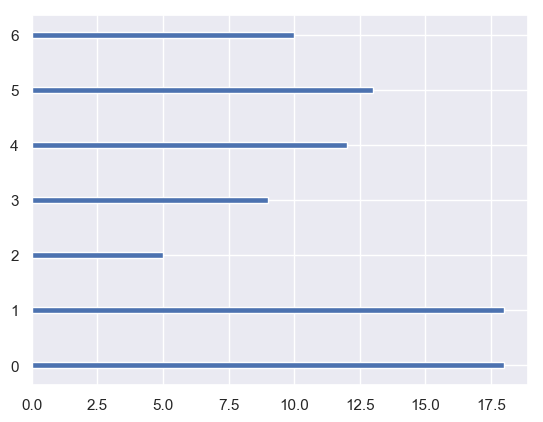

In [218]:
y = np.arange(7)
fig, ax = plt.subplots()
ax.barh(y, x, height = 0.1)
plt.show()

### Gráficos de líneas con barras de error

https://matplotlib.org/api/_as_gen/matplotlib.pyplot.errorbar.html

La función [matplotlib.pyplot.errorbar](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.errorbar.html) (y el [método de un conjunto de ejes equivalente](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.errorbar.html)) nos permite mostrar una gráfica de líneas a partir de un conjunto de puntos dados por sus posiciones x e y, añadiendo una barra de error a cada uno de los puntos. Por ejemplo, si suponemos que el error asociado a cada valor y es un 1 punto:

In [219]:
x = np.linspace(0, 100, 25)
y = np.random.randn(25).cumsum()

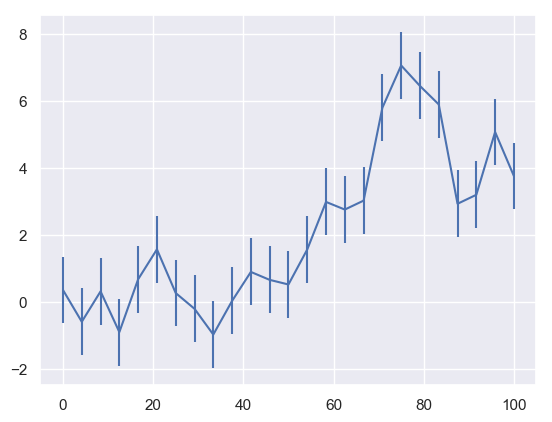

In [220]:
fig, ax = plt.subplots()
ax.errorbar(x, y, yerr = 1)
plt.show()

La gráfica muestra una línea vertical de longitud dos veces el error indicado.

Algunos parámetros destacables:

* **ecolor**: define el color de las barras de error
* **elinewidth**: define el ancho de las barras de error
* **capsize**: define el ancho de los topes que limitan cada barra de error

En el ejemplo visto, el error es fijo, lo que no siempre es cierto. En el próximo ejemplo suponemos que el error es un 25% del valor y de cada punto + 0.5. Además, se da formato a las barras de error con los parámetros vistos (el estilo seaborn que se está usando oculta los "caps" de las barras de error):

In [221]:
y_error = y * 0.25 + 0.5 # Error asociado a cada punto

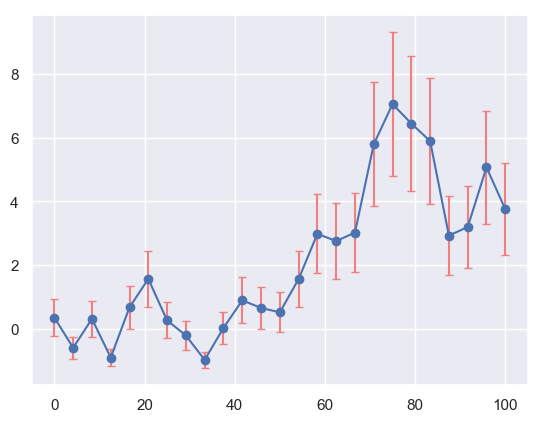

In [222]:
fig, ax = plt.subplots()
ax.errorbar(x, y, yerr = y_error,
            marker = "o",
            ecolor = "LightCoral",
            capsize = 3)
plt.show()

### Curvas de nivel

La función [matplotlib.contour](https://matplotlib.org/api/contour_api.html) (o su [método equivalente](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.contour.html)) nos permite mostrar en una gráfica curvas de nivel de una forma muy sencilla. Los valores a pasar como argumentos son arrays bidimensionales con los valores x e y de los puntos (obtenidos con la función [numpy.meshgrid](https://docs.scipy.org/doc/numpy/reference/generated/numpy.meshgrid.html)) y un array, de las mismas dimensiones que x e y, con los valores en el eje z a representar. Veámoslo en la práctica:

Definimos, en primer lugar, la función que definirá el valor z para cada par de puntos x e y. A continuación, creamos las matrices X e Y y generamos los valores Z correspondientes:

A continuación basta ejecutar la función *plt.contour* con los valores X, Y y Z calculados (las siguientes imágenes son generadas trabajando con el estilo "default"):

In [223]:
plt.style.use("default")
mpl.rcParams["figure.dpi"] = 72

In [224]:
def f(x, y):
    return np.sin(x) ** 2 + np.cos(5 + x * y) + 2 * np.cos(x)
    
x = np.linspace(0, 5, 100)
y = np.linspace(0, 5, 100)
X, Y = np.meshgrid(x, y)
Z = f(X, Y)

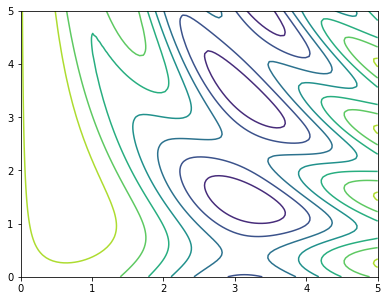

In [225]:
plt.contour(X, Y, Z)
plt.show()

Esta función acepta otros parámetros:

El parámetro **levels** determina el número de curvas a mostrar:

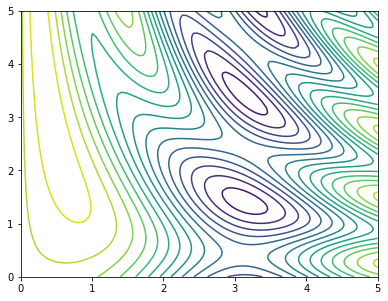

In [226]:
plt.contour(X, Y, Z, levels = 15)
plt.show()

**alpha** especifica el grado de transparencia de las curvas, y **cmap** el mapa de color a usar:

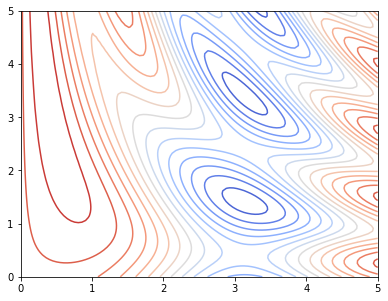

In [227]:
plt.contour(X, Y, Z, levels = 15, cmap = "coolwarm")
plt.show()

El parámetro **linewidths** controla el ancho de los contornos, y **linestyles** el estilo: solid, dashed, dashdot o dotted:

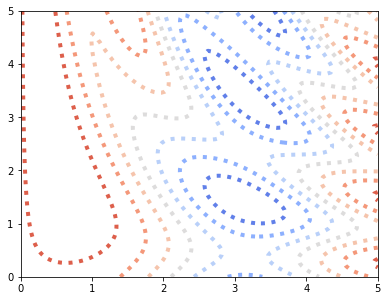

In [228]:
plt.contour(X, Y, Z, cmap = "coolwarm",
            linewidths = 4,
            linestyles = "dotted")
plt.show()

### Curvas de nivel rellenas

La función [matplotlib.pyplot.contourf](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.contourf.html) (o el [método asociado](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.contourf.html)) tiene un comportamiento semejante al de la función *contour* vista, pero rellenando las áreas entre líneas. Repitamos el mismo ejemplo:

In [229]:
def f(x, y):
    return np.sin(x) ** 2 + np.cos(5 + x * y) + 2 * np.cos(x)
    
x = np.linspace(0, 5, 100)
y = np.linspace(0, 5, 100)
X, Y = np.meshgrid(x, y)
Z = f(X, Y)

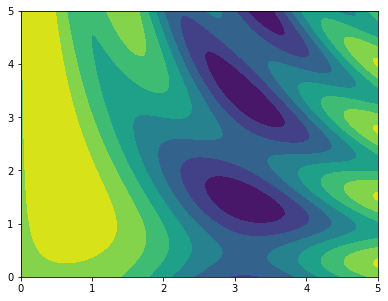

In [230]:
plt.contourf(X, Y, Z)
plt.show()

Los parámetros que acepta son los mismos que la función *contour*, por lo que no vale la pena repetir la explicación aquí. Mostremos apenas otra versión de la misma gráfica con 15 niveles y otro mapa de colores:

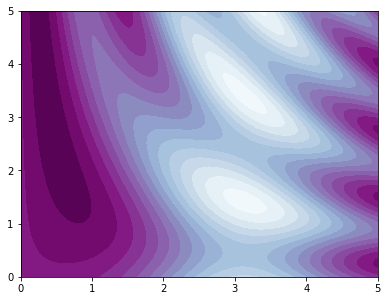

In [231]:
plt.contourf(X, Y, Z, levels = 15, cmap = "BuPu")
plt.show()

### Barras de color

Este tipo de gráficas pueden ir acompañadas de una barra de color que muestre los valores correspondientes a cada uno de los colores usados, lo que puede facilitar enormemente la interpretación del gráfico. La función que genera esta barra es [matplotlib.pyplot.colorbar](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.colorbar.html), y no necesita argumentos adicionales. Por el contrario, el [método de una figura colorbar](https://matplotlib.org/api/_as_gen/matplotlib.figure.Figure.html?highlight=colorbar#matplotlib.figure.Figure.colorbar) requiere recibir como argumento el gráfico al que va asociado (véanse ejemplos más adelante).

Veamos un primer ejemplo creando una barra de color para una gráfica de curvas nivel creada con la función *contour*. Comenzamos recreando los valores X, Y y Z:

In [232]:
def f(x, y):
    return np.sin(x) ** 2 + np.cos(5 + x * y) + x
    
x = np.linspace(0, 5, 100)
y = np.linspace(0, 5, 100)
X, Y = np.meshgrid(x, y)
Z = f(X, Y)

A continuación, generamos la gráfica y añadimos la función *colorbar*:

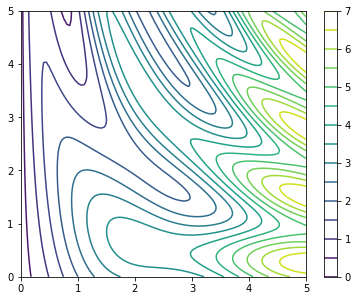

In [233]:
plt.contour(X, Y, Z, levels = 15)
plt.colorbar()
plt.show()

En el caso de asociarse la barra de color a una gráfica de curvas de nivel, la ayuda que supone es relativa. Pero si se asocia a una gráfica de curvas de nivel rellena, la mejora es sustancial. En el siguiente ejemplo se utiliza una de estas gráficas. En este caso vamos a usar el método *colorbar* asociado a la figura. Obsérvese que es necesario incluir como argumento una referencia a la gráfica generada:

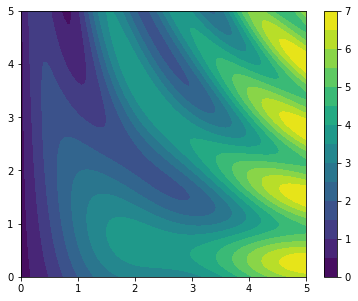

In [234]:
fig, ax = plt.subplots()
g = ax.contourf(X, Y, Z, levels = 15)
fig.colorbar(g)
plt.show()

La barra puede ser mostrada horizontalmente usando el parámetro **orientation** (en el siguiente ejemplo se usa el mapa de colores *Reds*)

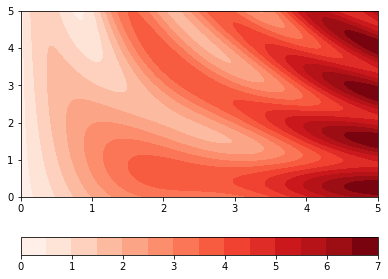

In [235]:
fig, ax = plt.subplots()
g = ax.contourf(X, Y, Z, levels = 15, cmap = "Reds")
fig.colorbar(g, orientation = "horizontal")
plt.show()

El parámetro **fraction** controla el porcentaje de la figura que se dedicará a la barra de color, y el parámetro **aspect** controla el aspecto de la barra (la proporción alto-ancho). Jugando con ambos valores podemos mostrar barras más anchas que cubran la altura completa de la figura:

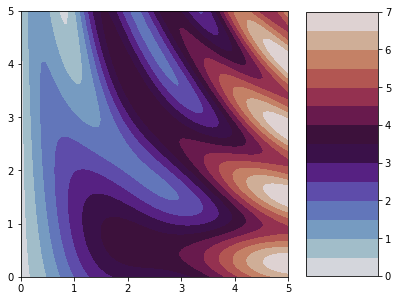

In [236]:
fig, ax = plt.subplots()
g = ax.contourf(X, Y, Z, levels = 15, cmap = "twilight")
fig.colorbar(g, aspect = 3.7, fraction = 0.20)
plt.show()

# Gráficos en 3D
<div style = "float:right"><a style="text-decoration:none" href = "#inicio">Inicio</a></div>

Aun cuando matplotlib fue diseñado en un principio como software para la generación de gráficos bidimensionales, con el tiempo se le han ido añadiendo herramientas que, si bien limitadas, permiten la generación de gráficos en 3D.

Para habilitar la creación de este tipo de gráficos basta importar el objeto [Axes3D](https://matplotlib.org/3.1.1/api/_as_gen/mpl_toolkits.mplot3d.axes3d.Axes3D.html) de la sublibrería **mpl_toolkits.mplot3d**, y generar un conjunto de ejes con el método **gca** asociado a la figura indicando que la proyección es de tipo "*3d*":

In [237]:
from mpl_toolkits.mplot3d import Axes3D

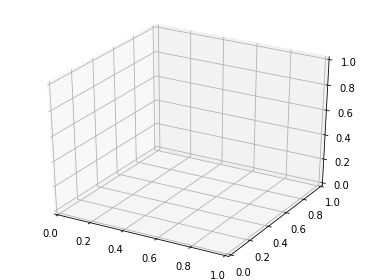

In [238]:
fig = plt.figure()
ax = fig.gca(projection = '3d')
plt.show()

A partir de aquí, basta con utilizar las funciones de matplotlib que generan los gráficos en 3D: [plot_surface](https://matplotlib.org/api/_as_gen/mpl_toolkits.mplot3d.axes3d.Axes3D.html?highlight=plot_surface#mpl_toolkits.mplot3d.axes3d.Axes3D.plot_surface), [plot3D](https://matplotlib.org/api/_as_gen/mpl_toolkits.mplot3d.axes3d.Axes3D.html?highlight=3d#mpl_toolkits.mplot3d.axes3d.Axes3D.plot3D), [scatter3D](https://matplotlib.org/api/_as_gen/mpl_toolkits.mplot3d.axes3d.Axes3D.html?highlight=3d#mpl_toolkits.mplot3d.axes3d.Axes3D.scatter3D), [contour3D](https://matplotlib.org/api/_as_gen/mpl_toolkits.mplot3d.axes3d.Axes3D.html?highlight=3d#mpl_toolkits.mplot3d.axes3d.Axes3D.contour3D), [contourf3D](https://matplotlib.org/api/_as_gen/mpl_toolkits.mplot3d.axes3d.Axes3D.html?highlight=3d#mpl_toolkits.mplot3d.axes3d.Axes3D.contourf3D), etc.

### Superficies

Una vez creado el conjunto de ejes 3D, mostrar una superficie tridimensional en estos ejes es relativamente sencillo usando el método del conjunto de ejes [plot_surface](https://matplotlib.org/api/_as_gen/mpl_toolkits.mplot3d.axes3d.Axes3D.html?highlight=plot_surface#mpl_toolkits.mplot3d.axes3d.Axes3D.plot_surface). Este método recibe como argumentos de entrada arrays 2D con los valores x, y y z de la misma manera que vimos para la función *contour*. Por ejemplo, partamos del siguiente conjunto de puntos:

In [239]:
X = np.arange(-10, 10, 0.25)
Y = np.arange(-10, 10, 0.25)
X, Y = np.meshgrid(X, Y)
Z = np.sin(np.sqrt(X**2 + Y**2))

Ahora (suponiendo que hayamos importado el objeto *Axes3D*), no queda más que crear la figura, el conjunto de ejes y ejecutar el método **plot_surface**. En el ejemplo de la siguiente figura, hemos asignado a la gráfica un mapa de color y creado una barra de color:

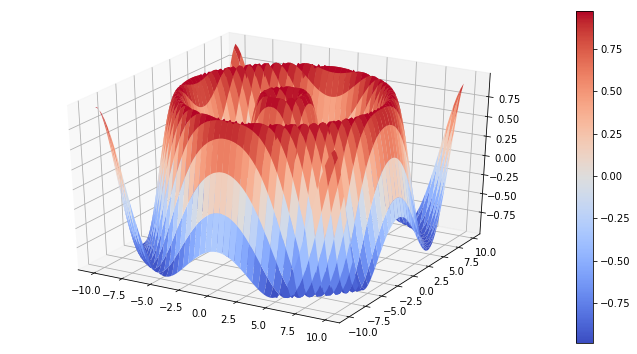

In [240]:
fig = plt.figure(figsize = (12, 6))
ax = fig.gca(projection='3d')
surface = ax.plot_surface(X, Y, Z, cmap = "coolwarm")
fig.colorbar(surface)
plt.show()

En el próximo ejemplo, simplemente cambiamos la función que genera el array Z y el mapa de color:

In [241]:
def f(x, y):
    return np.sin(-x) ** 2 + np.cos(5 - x * y) - x

In [242]:
X = np.arange(-5, 5, 0.05)
Y = np.arange(-5, 5, 0.05)
X, Y = np.meshgrid(X, Y)
Z = f(X, Y)

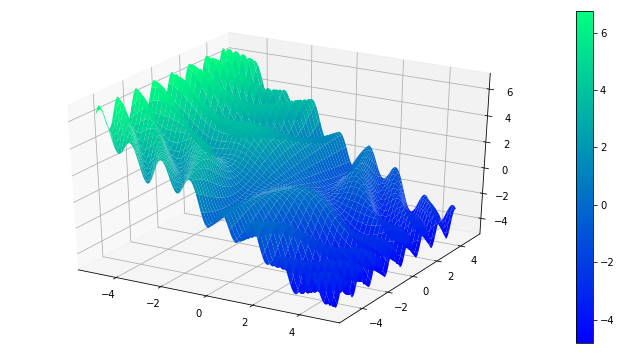

In [243]:
fig = plt.figure(figsize = (12, 6))
ax = fig.gca(projection='3d')
surface = ax.plot_surface(X, Y, Z, cmap = "winter")
fig.colorbar(surface)
plt.show()

### Wireframes

La generación de "wireframes" o gráficos de mallas es extremadamente simple una vez que sabemos generar una superficie. El método es [plot_wireframe](https://matplotlib.org/api/_as_gen/mpl_toolkits.mplot3d.axes3d.Axes3D.html?highlight=plot_wireframe#mpl_toolkits.mplot3d.axes3d.Axes3D.plot_wireframe) y recibe como primeros tres argumentos las matrices X, Y y Z que hemos visto para la función *plot_surface*. En este caso, el método no es compatible con los mapas de color, por lo que no es posible asignarle uno ni crear una barra de color que acompañe al gráfico:

In [244]:
X = np.arange(-10, 10, 0.25)
Y = np.arange(-10, 10, 0.25)
X, Y = np.meshgrid(X, Y)
Z = np.sin(np.sqrt(X**2 + Y**2))

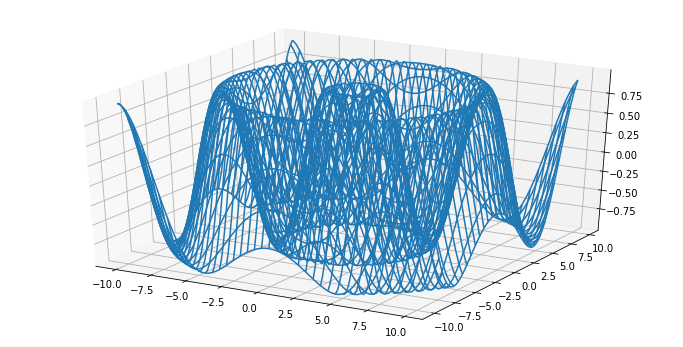

In [245]:
fig = plt.figure(figsize = (12, 6))
ax = fig.gca(projection='3d')
surface = ax.plot_wireframe(X, Y, Z)
plt.show()

Con los parámetros **rcount** y **ccount** (cuyo valor por defecto es 50) es posible especificar el número de muestras de los datos a utilizar en cada dirección. En el siguiente ejemplo utilizamos apenas 25 muestras por dirección:

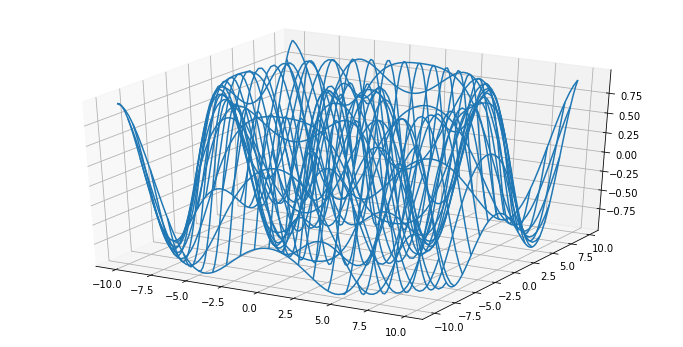

In [246]:
fig = plt.figure(figsize = (12, 6))
ax = fig.gca(projection='3d')
surface = ax.plot_wireframe(X, Y, Z, rcount = 25, ccount = 25)
plt.show()

### Curvas de nivel

El método [contour3D](https://matplotlib.org/api/_as_gen/mpl_toolkits.mplot3d.axes3d.Axes3D.html?highlight=3d#mpl_toolkits.mplot3d.axes3d.Axes3D.contour3D) nos permite crear gráficos de curvas de nivel en 3D. En su configuración más básica simplemente recibe como argumentos los arrays X, Y y Z:

In [247]:
X = np.linspace(-1.2, 1.2, 100)
Y = np.linspace(-1.2, 1.2, 100)
X, Y = np.meshgrid(X, Y)
Z = np.abs(0.4 ** 2 - (0.6 - (X ** 2 + Y ** 2) ** 0.5) ** 2) ** 0.5

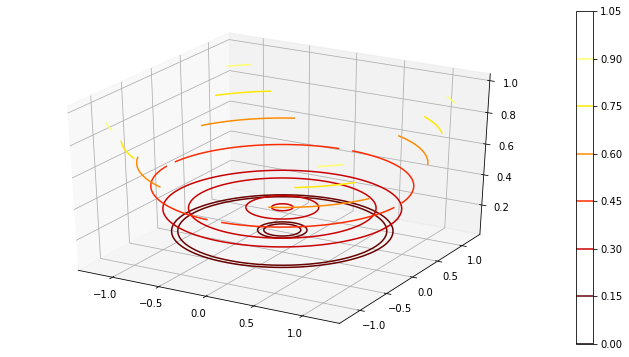

In [248]:
fig = plt.figure(figsize = (12, 6))
ax = fig.gca(projection='3d')
surface = ax.contour3D(X, Y, Z, cmap = "hot")
fig.colorbar(surface)
plt.show()

Por defecto, las curvas de nivel se crean paralelas al eje x (es decir, en torno al eje y), pero el parámetro **zdir** permite modificar el eje de referencia. Además, el parámetro **levels** nos permite escoger el número de niveles a mostrar:

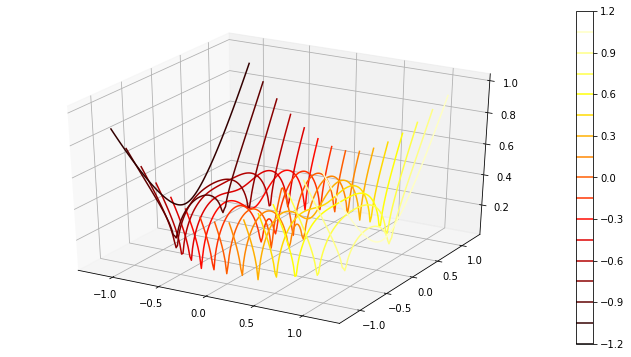

In [249]:
fig = plt.figure(figsize = (12, 6))
ax = fig.gca(projection='3d')
surface = ax.contour3D(X, Y, Z, cmap = "hot", zdir = "x", levels = 20)
fig.colorbar(surface)

plt.show()

### Gráficos de dispersión

También podemos crear gráficos de dispersión fácilmente con el método [scatter3D](https://matplotlib.org/api/_as_gen/mpl_toolkits.mplot3d.axes3d.Axes3D.html?highlight=3d#mpl_toolkits.mplot3d.axes3d.Axes3D.scatter3D). Una vez más, los tres argumentos principales son los arrays X, Y y Z conteniendo la información sobre los puntos a mostrar. En el siguiente ejemplo generamos dichos datos de forma aleatoria:

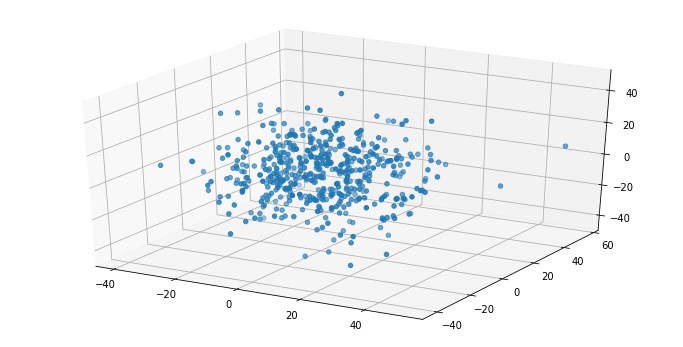

In [250]:
n = 4
fig = plt.figure(figsize = (12, 6))
ax = fig.gca(projection='3d')
x = np.random.normal(0, (n + 1) * 3, 500)
y = np.random.normal(0, (n + 1) * 3, 500)
z = np.random.normal(0, (n + 1) * 3, 500)
scatter = ax.scatter3D(x, y, z)
plt.show()

Podemos, por supuesto, superponer diferentes grupos de puntos y asignar una etiqueta a cada uno, tal y como hacíamos con los gráficos de dispersión 2D:

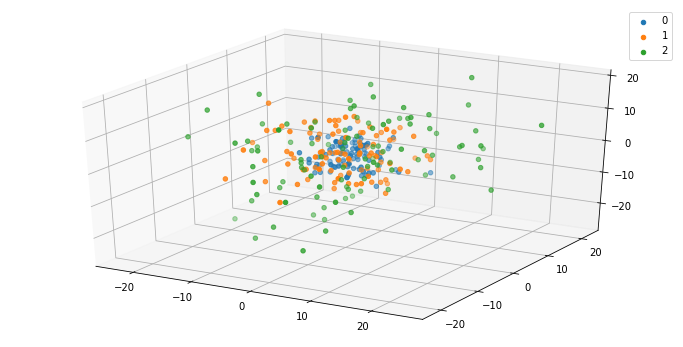

In [251]:
fig = plt.figure(figsize = (12, 6))
ax = fig.gca(projection='3d')
for n in range(3):
    x = np.random.normal(0, (n + 1) * 3, 100)
    y = np.random.normal(0, (n + 1) * 3, 100)
    z = np.random.normal(0, (n + 1) * 3, 100)
    scatter = ax.scatter3D(x, y, z, label = n)
plt.legend()
plt.show()

### Gráficos dinámicos en 3D

Trabajando en tres dimensiones, la herramienta que permite crear gráficos dinámicos resulta más útil que trabajando con dos dimensiones. Tal y como vimos en su momento, basta ejecutar la instrucción

In [252]:
%matplotlib notebook

...para activar esta herramienta. En la interfaz que se nos muestra, podemos usar el botón izquierdo del ratón para rotar el gráfico, y el botón derecho para acercar o alejar la imagen:

In [253]:
X = np.arange(-10, 10, 0.25)
Y = np.arange(-10, 10, 0.25)
X, Y = np.meshgrid(X, Y)
Z = np.sin(np.sqrt(X**2 + Y**2))

<IPython.core.display.Javascript object>


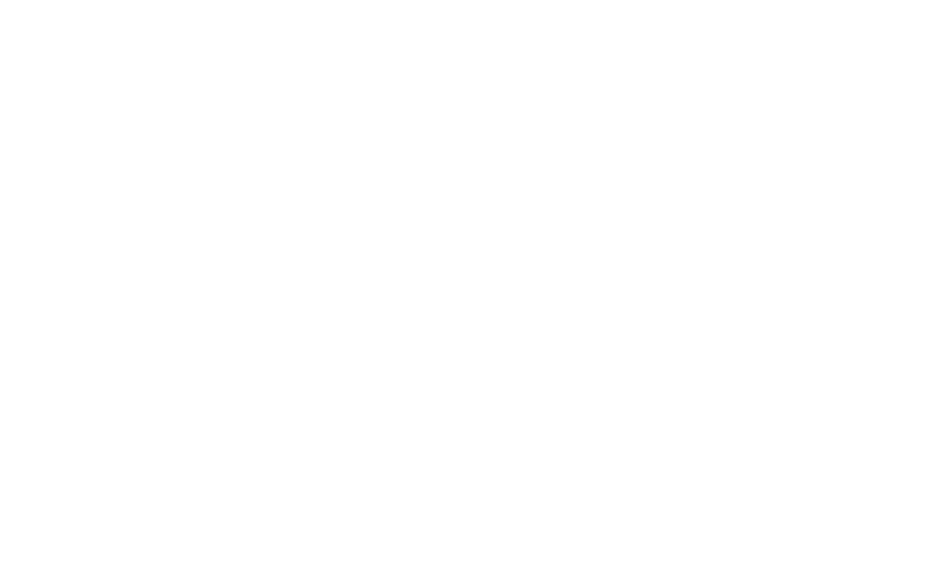

<IPython.core.display.Javascript object>


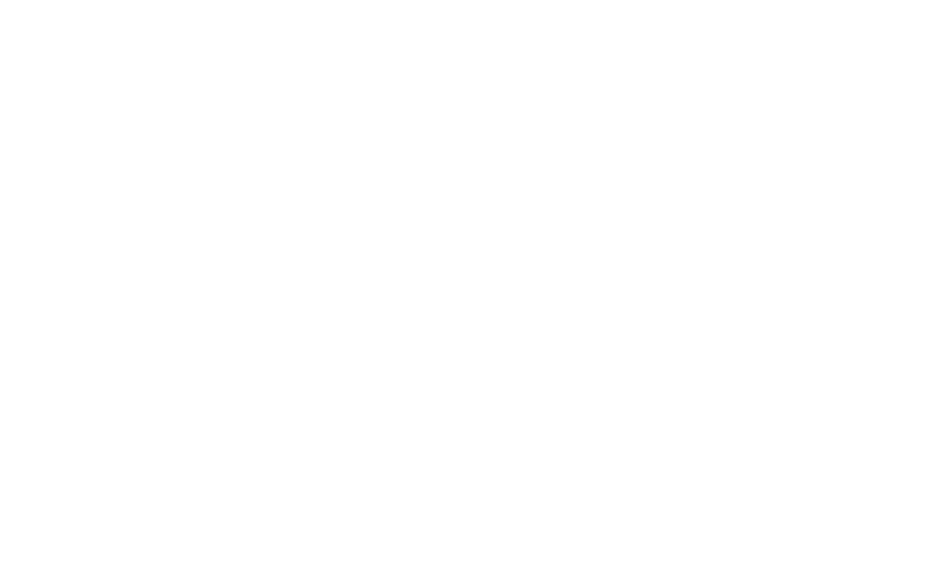

In [254]:
fig = plt.figure(figsize = (13, 8))
ax = fig.gca(projection='3d')
surface = ax.plot_surface(X, Y, Z, cmap = "summer")
fig.colorbar(surface)
plt.show()

In [255]:
%matplotlib inline

# Imágenes
<div style = "float:right"><a style="text-decoration:none" href = "#inicio">Inicio</a></div>

matplotlib también permite cargar imágenes desde una fuente y mostrarlas en pantalla. Entre un paso y otro podemos aplicar todas las herramientas proporcionadas por numpy, pandas o cualquier otra librería con el fin de modificar las dimensiones o valores de la imagen, aplicar filtros, etc.

La función que nos permite cargar una imagen es [matplotlib.pyplot.imread](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.imread.html), y la función utilizada para mostrar una imagen es [matplotlib.pyplot.imshow](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.imshow.html). Veremos también la función [matplotlib.pyplot.pcolormesh](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.pcolormesh.html) y sus diferencias con *plt.imshow*.

### Cargando uma imagen

Para probar estas funciones vamos a utilizar la bonita foto "sunset.png" -disponible para descarga- sacada en el archipiélago de Fernando de Noronha, Brasil, y que deberemos copiar en la misma carpeta en la que tengamos este cuaderno jupyter.

Si la abrimos con cualquier aplicación que tengamos en nuestro ordenador (tipo "Paint" o semejante) vemos el aspecto que tiene:

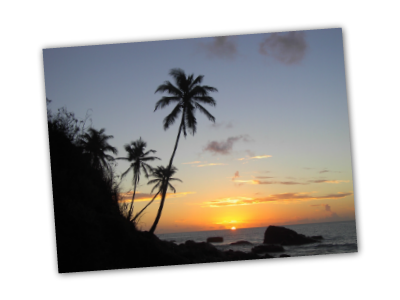

La función que nos permite cargar una imagen es [matplotlib.pyplot.imread](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.imread.html). Admite como primer parámetro, **fname**, una referencia a la imagen a leer, pudiendo ser el nombre de un fichero, una URL o un objeto python representando un fichero. El segundo parámetro, **format**, opcional, es el formato de la imagen.

In [256]:
img = plt.imread("sunset.png")

El resultado de la función *plt.imread* -almacenado en la variable *img* del código anterior- es un array NumPy con el siguiente tamaño:

* (m, n) para imágenes en blanco y negro
* (m, n, 3) para imágenes RGB
* (m, n, 4) para imágenes RGBA (RGB con canal alfa, o canal de transparencia)

Confirmemos el tipo de la variable img y el tamaño de la imagen leída:

In [257]:
print(type(img))
print(img.shape)

<class 'numpy.ndarray'>
(600, 800, 4)


Efectivamente se trata de un array NumPy. Pero las dimensiones parecen no encajar con lo que vemos: la imagen es más ancha que alta, y sin embargo las dimensiones del array son (600, 800, 4). Para explicar esto debemos recordar que, en un array bidimensional NumPy, el primer eje es el correspondiente a las filas (eje vertical) y el segundo el correspondiente a las columnas (eje horizontal), exactamente al contrario de como solemos interpretar el tamaño de una imagen (siempre damos primero el ancho -el número de columnas- y después el alto -el número de filas-).

Vemos también en el último código ejecutado que la imagen leída es de tipo RGBA (RGB con canal de transparencia).

### Mostrando una imagen

La función utilizada para mostrar una imagen es [matplotlib.pyplot.imshow](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.imshow.html), función que acepta como primer argumento una variable con estructura de array (o imagen PIL):

Creemos un array a mano para ver cómo lo muestra la función:

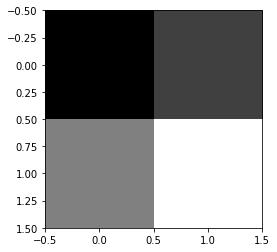

In [258]:
a = np.array([0, 64, 128, 255]).reshape(2, 2)
plt.imshow(a, cmap = "gray");

Con el mapa de colores "gray" que estamos usando, los valores 0 se muestran en negro y los valores 255 en blanco. Comprobamos que la función *plt.imshow* muestra los valores leídos (antes de ejecutar el reshape) de izquierda a derecha y de arriba hacia abajo:

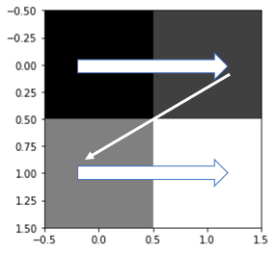

Hagamos otra prueba, esta vez con un array de 5x4 píxels:

In [259]:
a = np.linspace(0, 255, 20).reshape(5, 4)
a

array([[  0.        ,  13.42105263,  26.84210526,  40.26315789],
       [ 53.68421053,  67.10526316,  80.52631579,  93.94736842],
       [107.36842105, 120.78947368, 134.21052632, 147.63157895],
       [161.05263158, 174.47368421, 187.89473684, 201.31578947],
       [214.73684211, 228.15789474, 241.57894737, 255.        ]])

Tal y como hemos definido el array, los valores se incrementan de izquierda a derecha y de arriba abajo:

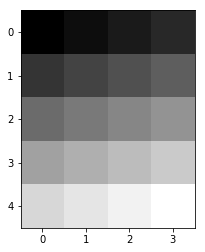

In [260]:
plt.imshow(a, cmap = "gray");

...y efectivamente los puntos se muestran más claros hacia la derecha y hacia abajo.

Mostremos entonces la imagen que habíamos leído:

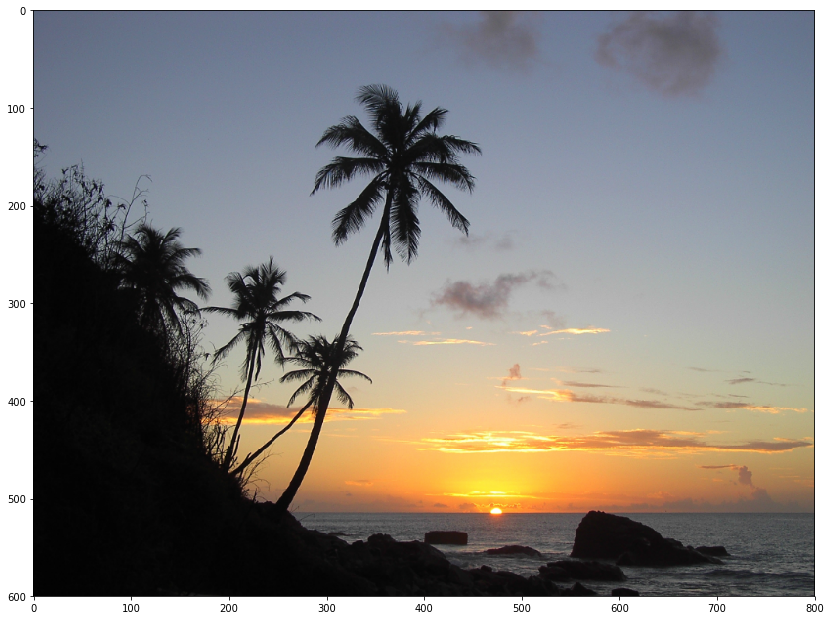

In [261]:
fig, ax = plt.subplots()
fig.set_size_inches(14, 12)
img = plt.imread("sunset.png")
plt.imshow(img)
plt.show()

### Conversión de una imagen en color a blanco y negro

Si, por ejemplo, quisiéramos mostrar la imagen leída en blanco y negro, podemos transformar los canales R, G y B en un nuevo canal usando [la siguiente fórmula](https://en.wikipedia.org/wiki/Grayscale#Converting_color_to_grayscale):

Y' = 0.299 R + 0.587 G + 0.114 B

...(lo que podemos conseguir usando la función [numpy.dot](https://docs.scipy.org/doc/numpy/reference/generated/numpy.dot.html)) y mostrando la imagen resultante con el mapa de color "gray":

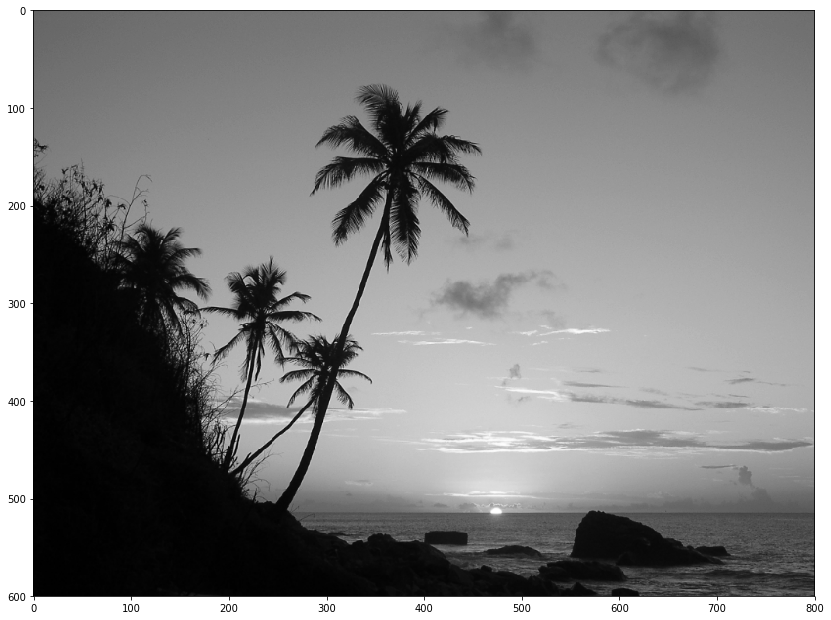

In [262]:
fig, ax = plt.subplots()
fig.set_size_inches(14, 12)
img = plt.imread("sunset.png")
gray = np.dot(img[...,:3], [0.299, 0.587, 0.114])
plt.imshow(gray, cmap = 'gray')
plt.show()

### Canales

El término "canal" es utilizado de forma genérica para referirse a un componente de una imagen que, de una forma u otra, determina el color de cada píxel a mostrar. Por ejemplo, una imagen GIF almacena cada píxel como una referencia a una tabla de colores. En función del modelo de color utilizado, los canales son unos u otros.

El modelo RGB es uno de los más utilizados, representando los componentes rojo, verde y azul en diferentes canales, cada uno de ellos almacenando valores entre 0 y 255 (o entre 0 y 1). Estos valores, en realidad, representan la intensidad del brillo de la imagen para cada uno de dichos colores.

La imagen vista tiene cuatro canales: los tres correspondientes a los colores rojo, verde y azul, y uno adicional almacenando información de transparencia de la imagen:

In [263]:
img = plt.imread("sunset.png")
img.shape

(600, 800, 4)

Si extraemos un único canal -el primero, por ejemplo, correspondiente a los rojos-:

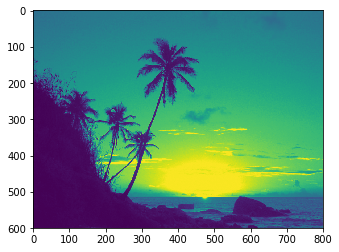

In [264]:
plt.imshow(img[:, :, 0]);

...no estamos más que extrayendo intensidades de colores, no colores, por lo que no es posible establecer una correspondencia real entre los valores leídos y los colores reales. Sabiendo que se trata de las intensidades del canal rojo, podríamos simular el aspecto del canal añadiendo como *cmap* una paleta de rojos:

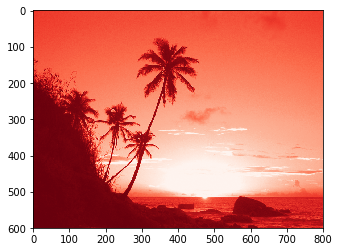

In [265]:
plt.imshow(img[:, :, 0], cmap = "Reds_r");

En todo caso deberemos ser conscientes de que no estamos más que forzando un mapeado artificial entre los valores leídos y el mapa de color.

Podemos mostrar los canales 1 y 2 correspondientes a verdes y azules utilizando el mismo método:

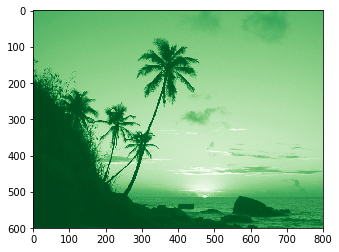

In [266]:
plt.imshow(img[:, :, 1], cmap = "Greens_r");

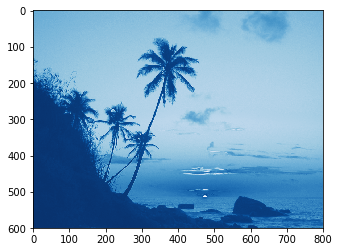

In [267]:
plt.imshow(img[:, :, 2], cmap = "Blues_r");

El cuarto canal (el canal con índice 3, correspondiente a la transparencia) está formado, en este caso particular, por valores de 1 o muy próximos a uno:

In [268]:
np.mean(img[:, :, 3])

0.99998915

...indicando que la imagen es opaca. Si mostramos este canal utilizando como "mapeador" una escala de grises que asigne el negro al valor 1 (opaco) y el blanco al valor 0 (transparente), el resultado es el siguiente:

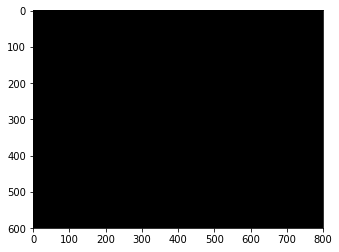

In [269]:
plt.imshow(img[:, :, 3], cmap = "gray_r");

(prácticamente son todos puntos negros -ni es posible apreciar los valores diferentes a 1-)

### La función pcolormesh

Matplotlib ofrece también las funciones equivalentes [matplotlib.pyplot.pcolormesh](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.pcolormesh.html) y [matplotlib.pyplot.pcolor](https://matplotlib.org/2.0.0/api/pyplot_api.html?highlight=pcolor#matplotlib.pyplot.pcolor), aunque en la documentación de la librería se recomienda usar la primera, así que nos centramos en ella: en teoría "crea una gráfica en pseudo-colores con un grid no rectangular". Comencemos por su sintaxis:

pcolormesh([x, y,] c, **kwargs)

...donde c es un array 2D de escalares, valores que serán "mapeados" a un conjunto de colores determinado por el parámetro **cmap**, y **&#120;** e **&#121;**, parámetros opcionales, definen las coordenadas de las esquinas de los rectángulos que se mostrarán del color correspondiente. En resumen, dos claras diferencias con respecto a la función *plt.imshow*: los datos deben encontrarse en un array de 2 dimensiones (lo que solo ocurre con las imágenes en blanco y negro, cualquier otra no podría mostrarse usando esta función) y los "puntos" de la imagen mostrada no son puntos en realidad, sino rectángulos de tamaños a determinar por los parámetros x e y.

De hecho, los "rectángulos" en cuestión están limitados por los valores de x e y. Es decir, si en x tenemos, pongamos por caso, los valores 1, 3, y 5, estos tres valores definen dos rectángulos, uno que va a tener como límites en una dimensión los valores 1 y 3, y otro que va a tener como límites los valores 3 y 5.

Veamos esta función en la práctica: Creamos las estructuras x e y (simples listas en este ejemplo), y un array conteniendo los datos a mostrar:

In [270]:
x = [1, 3, 4]
y = [2, 3, 6]

In [271]:
z = np.linspace(0, 255, 9).reshape(3, 3)
z

array([[  0.   ,  31.875,  63.75 ],
       [ 95.625, 127.5  , 159.375],
       [191.25 , 223.125, 255.   ]])

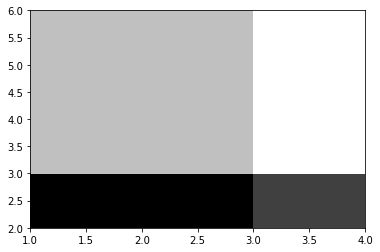

In [272]:
plt.pcolormesh(x, y, z, cmap = "gray");

Comprobamos que la lista x se representa horizontalmente (de izquierda a derecha), y la lista y, verticalmente (de abajo arriba), como en cualquier gráfica 2D de las que hemos visto. Comprobamos también que, efectivamente, los valores de x y de y determinan los límites de los rectángulos, lo que significa que el array z no necesita tener más que x-1 elementos horizontales e y-1 elementos verticales. O dicho con otras palabras, de nuestro array z de tamaño 3x3 se está ignorando una fila y una columna.

Según la documentación, la celda c[i, j] viene limitada en su esquina inferior izquierda por (x[i, j], y[i, j]) y, en su esquina superior derecha por (x[i + 1, j + 1], y[i + 1, j + 1]). Para ver claramente los datos que se utilizan y cómo se disponen en el gráfico, repitamos la anterior gráfica con un mapa de color con una paleta discreta y añadamos un barra de colores:

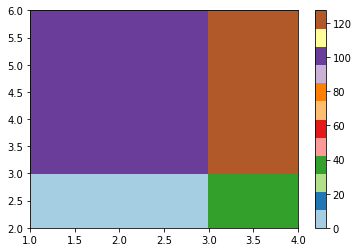

In [273]:
plt.pcolormesh(x, y, z, cmap = "Paired");
plt.colorbar();

Comprobamos -no demasiado sorprendentemente- que los datos mostrados son los del bloque superior izquierdo. Es decir, se ignora -en este caso- la última fila y la última columna.

Otro factor relevante es el orden en el que se muestran los datos, correspondiendo la primera fila del array a la fila inferior del gráfico y mostrándose los datos horizontalmente en el mismo orden que en el array. Esto significa que si partimos de un array plano:

In [274]:
a = z[:2, :2].flatten()
a

array([  0.   ,  31.875,  95.625, 127.5  ])

...los datos se van a mostrar, una vez redimensionados, de izquierda a derecha y de abajo hacia arriba:

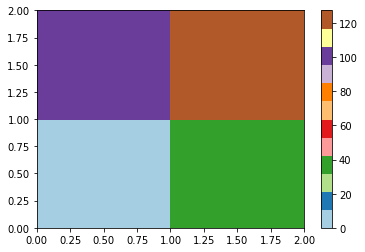

In [275]:
plt.pcolormesh(a.reshape(2, 2), cmap = "Paired");
plt.colorbar();

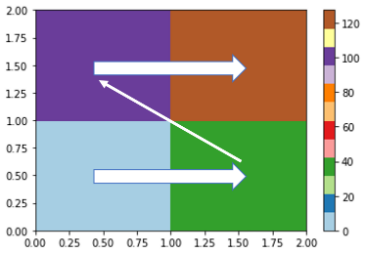

¿Y qué implicaciones tiene esto si se utiliza como array de entrada una imagen? En primer lugar, pcolormesh solo acepta arrays bidimensionales. La imagen vista en el apartado anterior tenía cuatro capas:

In [276]:
img = plt.imread("sunset.png")
img.shape

(600, 800, 4)

Mostremos entonces una de ellas con pcolormesh:

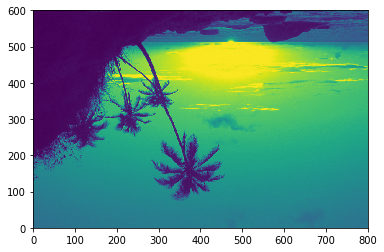

In [277]:
plt.pcolormesh(img[:, :, 0]);

Horizontalmente no hay diferencias, pero la imagen se muestra invertida.

### imshow vs. pcolormesh

Resumamos las diferencias entre las funciones imshow y pcolormesh:

* En primer lugar, las cabeceras de las funciones no son las mismas: aparte de otros parámetros, la función *imshow* acepta como primer parámetro un array (o estructura semejante) conteniendo los datos a mostrar. *pcolormesh* acepta las posiciones x e y de los bloques a colorear (ambos parámetros opcionales) y los datos en sí (uno menos por dimensión que x e y).

matplotlib.pyplot.imshow(X, ...)

pcolor([x, y,] c, ...)

* Ambas funciones muestran los datos de izquierda a derecha, pero la función *imshow* considera el origen de coordenadas en la esquina superior izquierda -convención habitual en procesamiento de imágenes- mientras que pcolormesh lo considera en la esquina inferior izquierda:

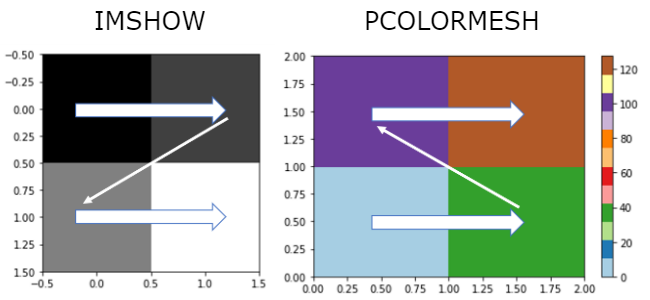

* Los elementos coloreados son píxels en el caso de *imshow* y rectángulos en el caso de *pcolormesh*.
* Los elementos coloreados se muestran en posiciones (i, j) -siendo i y j números enteros consecutivos a partir de 0- en *imshow*, y, en *pcolormesh*, en las posiciones dadas por los arrays x e y con los que se llama a la función. Si no se incluyen los parámetros x e y, entonces se muestran también en posiciones de 0 en adelante.
* La función *imshow* está diseñada para mostrar imágenes, lo que supone que el array de entrada deberá tener tamaño (m, n), (m, n, 3) o (m, n, 4). *pcolormesh* acepta solo arrays de dos dimensiones (m, n).

# Mapas
<div style = "float:right"><a style="text-decoration:none" href = "#inicio">Inicio</a></div>

matplotlib también provee herramientas para la generación de mapas y la creación de curvas y gráficas sobre ellos. La mayor parte de estas herramientas pueden encontrarse en la sublibrería **mpl_toolkits.basemap**.

La clase que provee los mapas es **Basemap**:

In [278]:
from mpl_toolkits.basemap import Basemap

In [279]:
m = Basemap()
plt.show()

Sin embargo, el mapa por sí solo no supone ninguna salida en pantalla (la ejecución de las anteriores instrucciones no genera nada): Es necesario añadir al mapa al menos una capa de "fondo" y, en  su caso, los puntos que queramos marcar en él. Adicionalmente será necesario especificar el tipo de proyección, las coordenadas en las que queremos centrar el mapa, el ancho y alto de territorio a cubrir, etc.

A modo de ejemplo, generemos un mapa centrado en las coordenadas latitud = 49 y longitud = 7, incluyendo 4.000 km de ancho y 3.000 de alto, con una proyección tipo "[Lambert Conformal Conic](https://es.wikipedia.org/wiki/Proyecci%C3%B3n_conforme_de_Lambert)" (LCC):

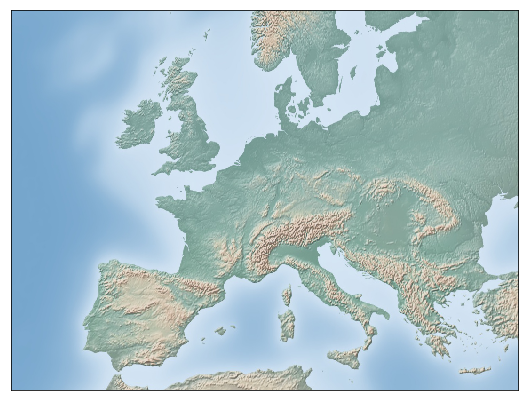

In [280]:
from mpl_toolkits.basemap import Basemap
fig = plt.figure(figsize = (12, 7))
m = Basemap(width = 4000 * 1000,
            height = 3000 * 1000,
            projection = 'lcc',
            lat_0 = 49,
            lon_0 = 7)
m.shadedrelief()
plt.show()

Sobre estos mapas es posible aplicar gran número de funciones. En el siguiente ejemplo, se genera un valor z asociado a diferentes puntos geográficos y se muestra un gráfico de curvas de nivel:

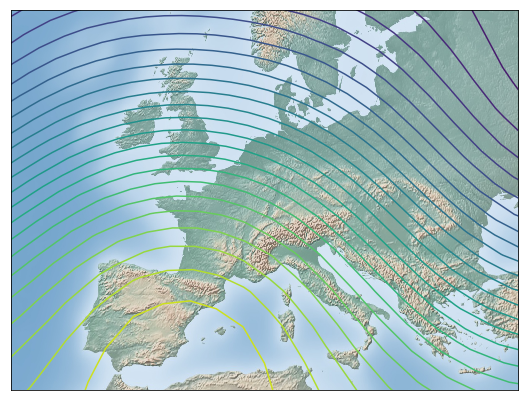

In [281]:
fig = plt.figure(figsize = (12, 7))
map = Basemap(width = 4000 * 1000,
            height = 3000 * 1000,
            projection = 'lcc',
            lat_0 = 49,
            lon_0 = 7)
map.shadedrelief()

nlats = 73;
nlons = 145;
delta = 2.0 * np.pi / (nlons - 1)
lats = (0.5 * np.pi - delta * np.indices((nlats, nlons))[0, :, :])
lons = (delta * np.indices((nlats,nlons))[1, :, :])
wave = 0.75 * (np.sin(2.0 * lats) ** 8 * np.cos(4.0 * lons))
mean = 0.5 * np.cos(2.0 * lats) * ((np.sin(2.0 * lats)) ** 2 + 2.0)

x, y = map(lons*180./np.pi, lats*180./np.pi)
cs = map.contour(x, y, wave + mean, 25, linewidths = 1.5)
plt.show()

Revisemos en las siguientes secciones parte de esta funcionalidad.

### Fondos de mapa

Lo primero que debemos hacer es añadir a nuestro "objeto mapa" una o más capas de fondo. Estas capas se añaden como métodos del mapa, por ejemplo:

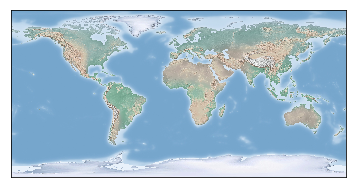

In [282]:
m = Basemap()
m.shadedrelief();

Hay un buen número de opciones cuya documentación puedes consultar en [esta página](https://matplotlib.org/basemap/api/basemap_api.html).

###### shadedrelief

Esta capa añade un mapa sombreado en relieve (de http://www.shadedrelief.com ). El tamaño de la imagen por defecto es de 10.800 x 5.400 píxels, cuya gestión puede resultar lenta y ocupar más memoria de la deseada. Con este objetivo el método incluye el parámetro opcional **scale** que permite aplicar una escala a la imagen descargada (por ejemplo, incluir el argumento *scale = 0.5* supone descargar un mapa de 5.400 x 2.700 píxels):

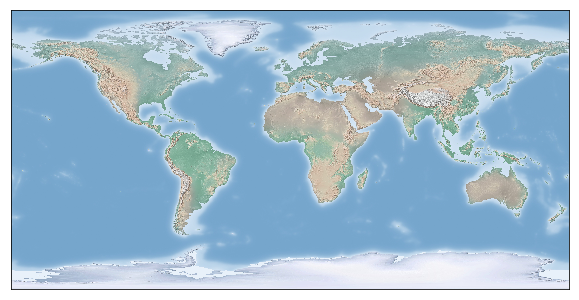

In [283]:
fig = plt.figure(figsize = (10, 6))
m = Basemap()
m.shadedrelief();

###### etopo

El método etopo añade una imagen en relieve etopo (de https://www.ngdc.noaa.gov/mgg/global/global.html) mostrando accidentes geográficos en continentes y por debajo del nivel del mar con un tamaño por defecto de 5.400 x 2.700. Al igual que ocurre con el método *shadedrelief*, *etopo* acepta el parámetro **scale** para reducir la imagen:

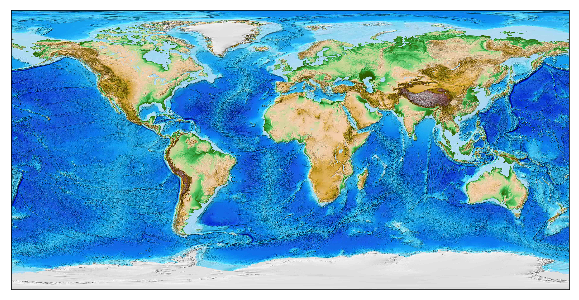

In [284]:
fig = plt.figure(figsize = (10, 6))
m = Basemap()
m.etopo();

###### arcgisimage

El método *arcgisimage* añade una capa formada por un mapa de ArcGIS Server REST API:

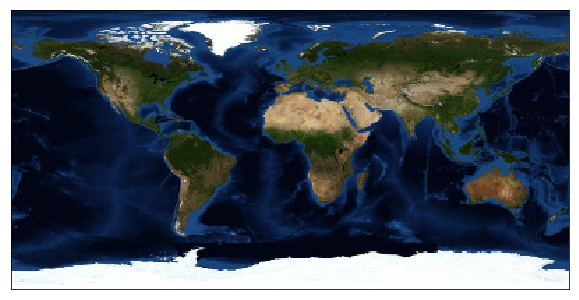

In [285]:
fig = plt.figure(figsize = (10, 6))
m = Basemap(epsg = 4326)
m.arcgisimage();

###### bluemarble

Muestra uma imagen blue marble (de https://visibleearth.nasa.gov ). El tamaño de la imagen por defecto es de 5.400 x 2.700, que puede reducirse usando el parámetro **scale**:

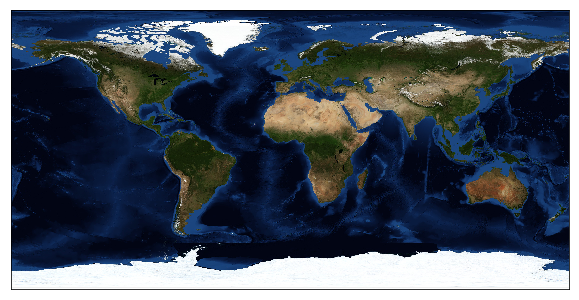

In [286]:
fig = plt.figure(figsize = (10, 6))
m = Basemap()
m.bluemarble();

###### drawcoastlines

Este método muestra la línea de costa, incluyendo parámetros que permiten controlar el ancho de la línea, su estilo, color...:

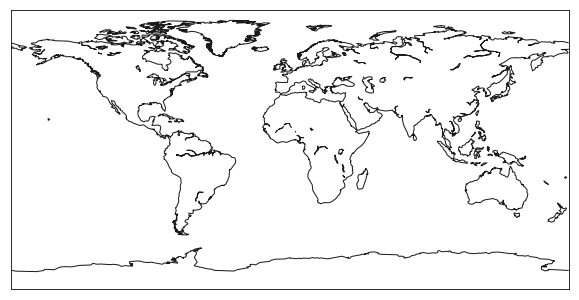

In [287]:
fig = plt.figure(figsize = (10, 6))
m = Basemap()
m.drawcoastlines();

###### drawcountries

Este método muestra los límites de los países, incluyendo las mismas opciones que el método anterior: ancho de línea, etc. Hay que tener en cuenta que esta capa solo muestra las fronteras (no la línea de costa, etc.) por lo que usada sola devuelve un resultado un tanto extraño:

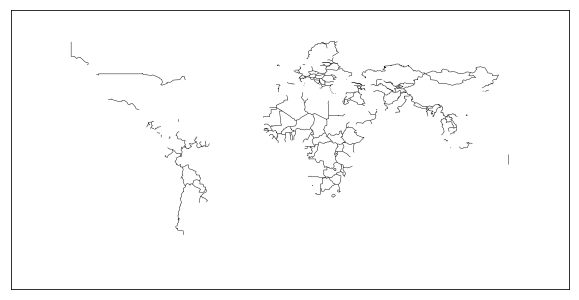

In [288]:
fig = plt.figure(figsize = (10, 6))
m = Basemap()
m.drawcountries();

###### drawmapboundary

Este método muestra el límite alrededor de la región mostrada en el mapa, permitiendo rellenar su interior de un cierto color. Nuevamente, esta capa tiene sentido usada en conjunción con otras:

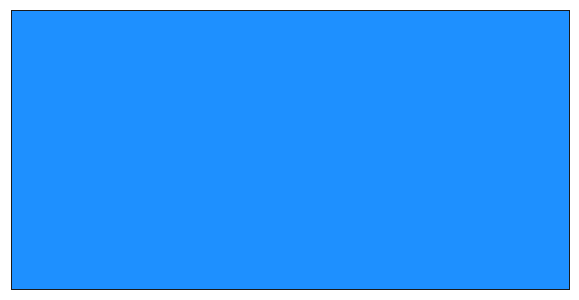

In [289]:
fig = plt.figure(figsize = (10, 6))
m = Basemap()
m.drawmapboundary(fill_color='DodgerBlue');

###### fillcontinents

Muestra los continentes rellenándolos con un cierto color. Permite especificar el color de los lagos también:

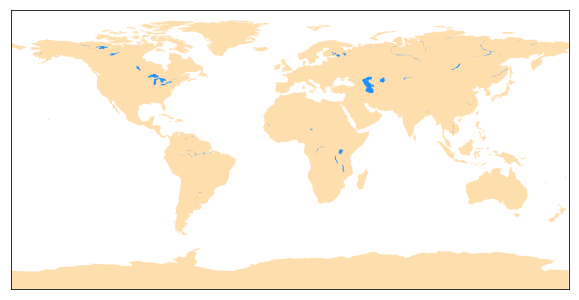

In [290]:
fig = plt.figure(figsize = (10, 6))
m = Basemap()
m.fillcontinents(color = 'NavajoWhite', lake_color = "DodgerBlue");

###### drawlsmask

El método *drawlsmask* muestra una máscara mar-tierra, permitiendo especificar el color para ambos elementos. Sin embargo, tal y como indica la documentación de este método, no puede ser superpuesta a otras capas "debido a limitaciones en la gestión de imágenes de matplotlib":

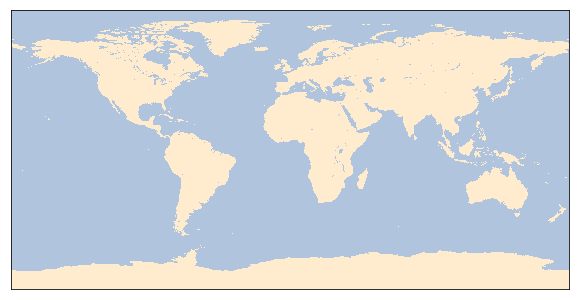

In [291]:
fig = plt.figure(figsize = (10, 6))
m = Basemap()
m.drawlsmask(land_color = "BlanchedAlmond", ocean_color="LightSteelBlue");

###### drawrivers

Muestra los mayores ríos de la Tierra, permitiendo especificar el ancho de las líneas, su estilo, etc.:

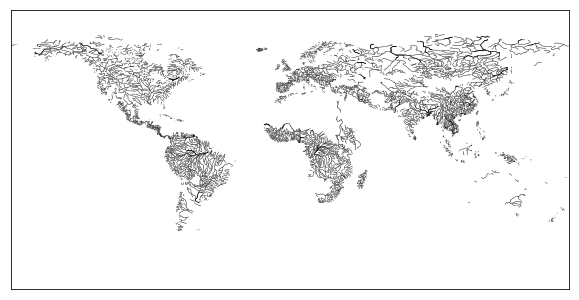

In [292]:
fig = plt.figure(figsize = (10, 6))
m = Basemap()
m.drawrivers();

###### drawstates

Este método muestra los límites de los estados de -según la documentación- " las Américas" (?). Como se ve en la siguiente imagen, muestra los límites de los países y de los estados de América y Australia (??):

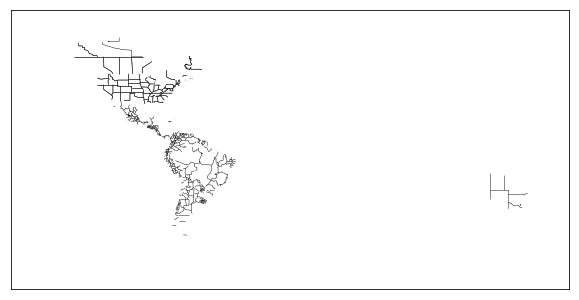

In [293]:
fig = plt.figure(figsize = (10, 6))
m = Basemap()
m.drawstates();

###### drawmeridians

*drawmeridians* muestra y etiqueta los meridianos para los valores incluidos como primer argumento (en grados):

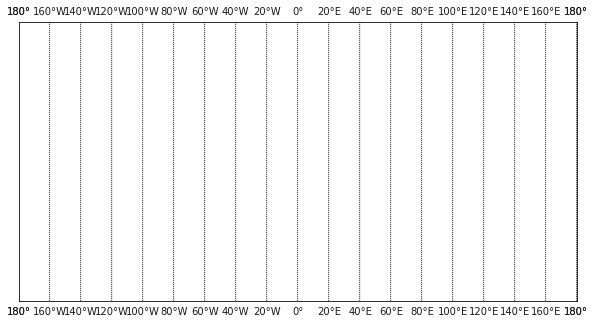

In [294]:
fig = plt.figure(figsize = (10, 6))
m = Basemap()
m.drawmeridians(range(0, 360, 20), labels=[0, 0, 1, 1]);

###### drawparallels

Este método muestra y etiqueta los paralelos para los valores incluidos como primer argumento (en grados):

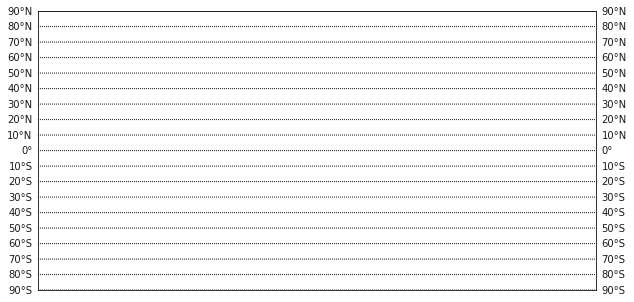

In [295]:
fig = plt.figure(figsize = (10, 6))
m = Basemap()
m.drawparallels(range(-90, 100, 10), labels=[1, 1, 0, 0]);

### Apilando fondos

Los fondos que acabamos de ver se añaden al objeto mapa y se muestran apilados en la imagen final. Así, en el siguiente ejemplo estamos mostrando el mapa en relieve sombreado, los mayores ríos de la Tierra y las líneas de meridianos y paralelos:

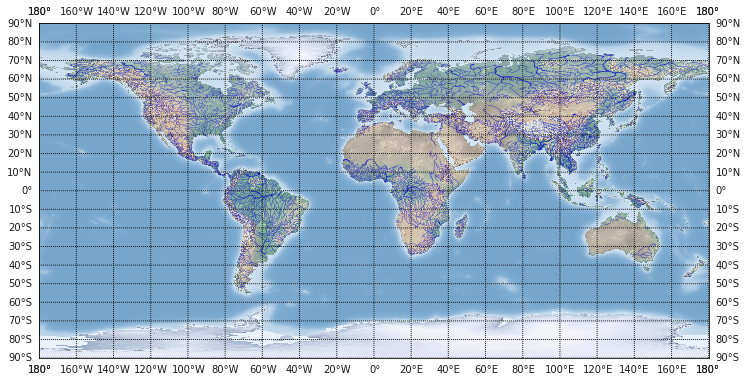

In [296]:
fig = plt.figure(figsize = (12, 9))
m = Basemap()
m.drawmeridians(range(0, 360, 20), labels=[0, 0, 1, 1]);
m.drawparallels(range(-90, 100, 10), labels=[1, 1, 0, 0]);
m.drawrivers(linewidth=0.3, color = "MediumBlue");
m.shadedrelief();

### Proyecciones

Otra de las primeras decisiones a tomar a la hora de crear un mapa es decidir el tipo de proyección con el que queremos mostrarlo. La variable **supported_projections** de la librería **mpl_toolkits.basemap** muestra los tipos de proyección disponibles:

In [297]:
from mpl_toolkits.basemap import supported_projections
print(supported_projections)

 cyl              Cylindrical Equidistant                 
 merc             Mercator                                
 tmerc            Transverse Mercator                     
 omerc            Oblique Mercator                        
 mill             Miller Cylindrical                      
 gall             Gall Stereographic Cylindrical          
 cea              Cylindrical Equal Area                  
 lcc              Lambert Conformal                       
 laea             Lambert Azimuthal Equal Area            
 nplaea           North-Polar Lambert Azimuthal           
 splaea           South-Polar Lambert Azimuthal           
 eqdc             Equidistant Conic                       
 aeqd             Azimuthal Equidistant                   
 npaeqd           North-Polar Azimuthal Equidistant       
 spaeqd           South-Polar Azimuthal Equidistant       
 aea              Albers Equal Area                       
 stere            Stereographic                         

###### Cylindrical Equidistant Projection

La proyección [Equidistant Cylindrical](https://matplotlib.org/basemap/users/cyl.html) (o Cylindrical Equidistant) es la proyección por defecto y en la que se han mostrado los mapas hasta ahora, mostrando el mundo en coordenadas geográficas (latitud y longitud):

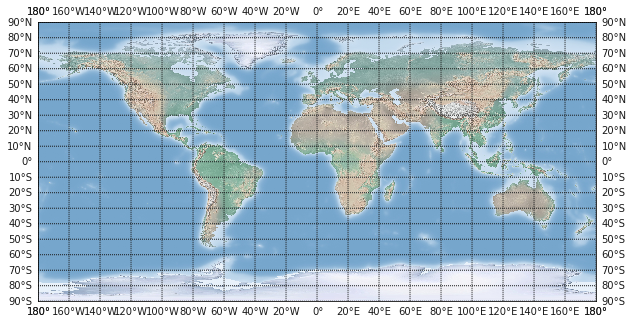

In [298]:
fig = plt.figure(figsize = (10, 6))
m = Basemap(projection = "cyl")
m.shadedrelief();
m.drawmeridians(range(0, 360, 20), labels=[0, 0, 1, 1]);
m.drawparallels(range(-90, 100, 10), labels=[1, 1, 0, 0]);

###### Lambert Conformal Projection

La [proyección conforme de Lambert](https://matplotlib.org/basemap/users/lcc.html) superpone un cono sobre la esfera de la Tierra, minimizando la distorsión proveniente de proyectar una superficie tridimensional sobre un plano.

Tal y como se explica en la documentación, en las proyecciones conformes como ésta se conserva la forma de los círculos pero no el área que cubren, mientras que en las proyecciones "igual área" se preserva el área cubierta por los círculos, no su forma. Así, en la siguiente imagen sacada de la documentación de matplotlib, puede comprobarse cómo los círculos mantienen su forma, pero no el área que representan:

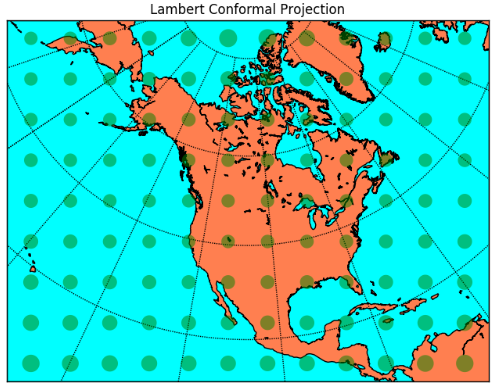

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


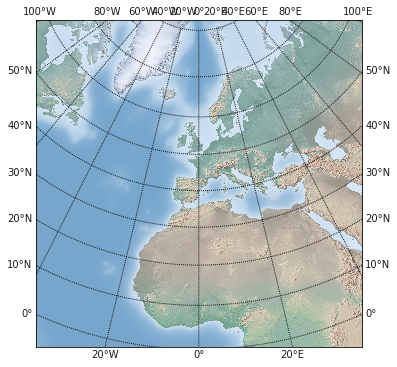

In [299]:
fig = plt.figure(figsize = (10, 6))
m = Basemap(projection='lcc', width=10e6, height=10e6,  lat_0 = 42, lon_0 = 0)
m.shadedrelief();
m.drawmeridians(range(0, 360, 20), labels=[0, 0, 1, 1]);
m.drawparallels(range(-90, 100, 10), labels=[1, 1, 0, 0]);

###### Lambert Azimuthal Equal Area Projection

En la siguiente imagen creada usando este tipo de proyección (imagen obtenida en la [documentación de matplotlib de este tipo de proyección](https://matplotlib.org/basemap/users/laea.html)), los círculos verdes tienen diferente forma pero representan la misma área de la superficie de la Tierra:

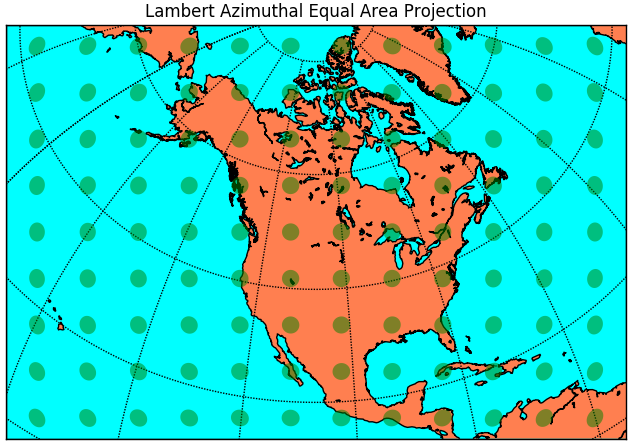

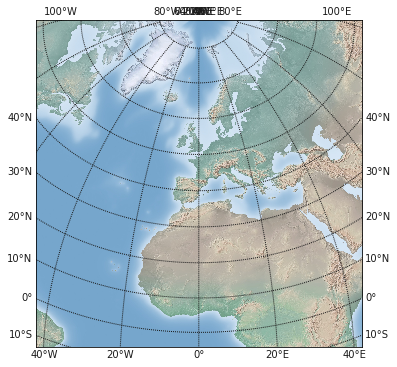

In [300]:
fig = plt.figure(figsize = (10, 6))
m = Basemap(projection='laea', width=10e6, height=10e6,  lat_0 = 42, lon_0 = 0)
m.shadedrelief();
m.drawmeridians(range(0, 360, 20), labels=[0, 0, 1, 1]);
m.drawparallels(range(-90, 100, 10), labels=[1, 1, 0, 0]);

###### North Polar Lambert Azimuthal Projection

Por conveniencia, matplotlib ofrece las proyecciones [nplaea y splaea](https://matplotlib.org/basemap/users/plaea.html) para facilitar el aspecto de los polos norte y sur, respectivamente, de la proyección Lambert azimuthal equal-area vista:

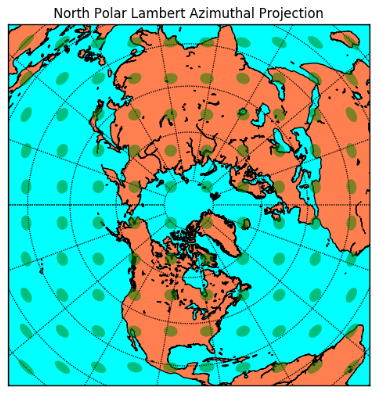

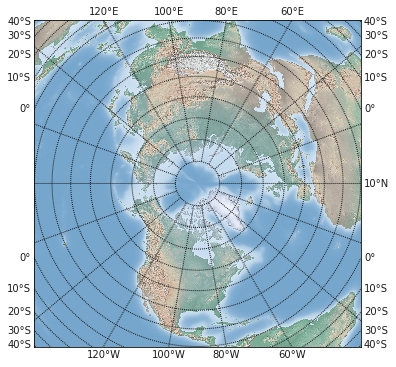

In [301]:
fig = plt.figure(figsize = (10, 6))
m = Basemap(projection='nplaea', boundinglat = 10, lon_0 = 270)
m.shadedrelief();
m.drawmeridians(range(0, 360, 20), labels=[0, 0, 1, 1]);
m.drawparallels(range(-90, 100, 10), labels=[1, 1, 0, 0]);

###### South Polar Lambert Azimuthal Projection

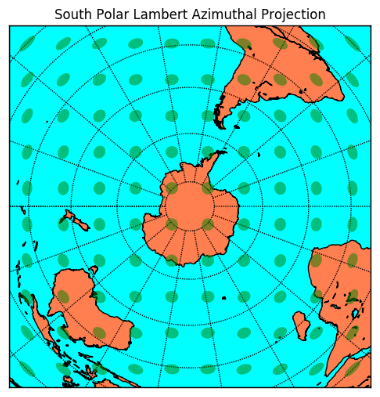

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


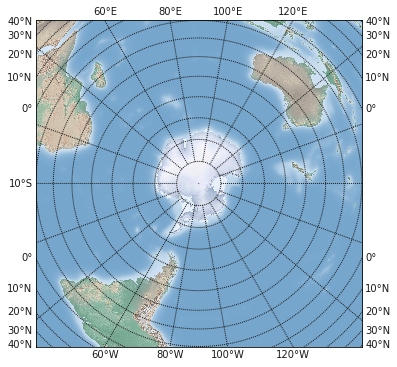

In [302]:
fig = plt.figure(figsize = (10, 6))
m = Basemap(projection='splaea', boundinglat = -10, lon_0 = 270)
m.shadedrelief();
m.drawmeridians(range(0, 360, 20), labels=[0, 0, 1, 1]);
m.drawparallels(range(-90, 100, 10), labels=[1, 1, 0, 0]);

###### Geostationary Projection

La proyección geoestacionaria muestra la Tierra vista desde un satélite (en órbita geoestacionaria) permitiendo especificar la distancia a la que se encuentra el satélite mediante el argumento satellite_height (que, por defecto, toma el valor 35.786):

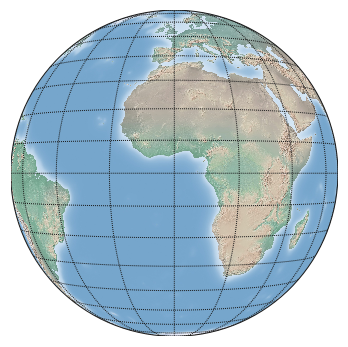

In [303]:
fig = plt.figure(figsize = (10, 6))
m = Basemap(projection = 'geos', lon_0 = 0, rsphere = (6378137.0,6356752.3142))
m.shadedrelief();
m.drawmeridians(range(0, 360, 20));
m.drawparallels(range(-90, 100, 10));

###### Orthographic Projection

La proyección ortográfica muestra la Tierra vista desde un satélite "en una órbita infinitamente alta respecto de la superficie de la Tierra":

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


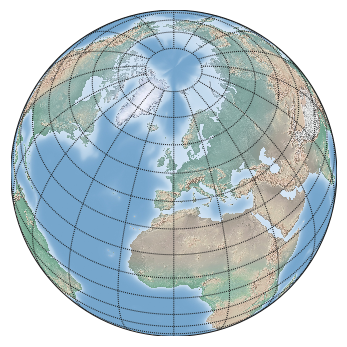

In [304]:
fig = plt.figure(figsize = (10, 6))
m = Basemap(projection = 'ortho', lat_0 = 50, lon_0 = 0)
m.shadedrelief();
m.drawmeridians(range(0, 360, 20));
m.drawparallels(range(-90, 100, 10));

### Posición y área

Para posicionar el mapa, la clase Basemap incluye los parámetros **lat_0** y **lon_0** para seleccionar la latitud (norte o sur) y longitud (este u oeste), respectivamente, del centro del mapa. Estos argumentos deben contener grados decimales. Adicionalmente, los parámetros **width** y **height** deberán contener el ancho y alto en metros del área a visualizar. Mostremos algunos ejemplos:

###### Madrid

Latitud: 40.4165000, longitud: -3.7025600, mapa de 1.000 km de ancho y 1.000 km de alto:

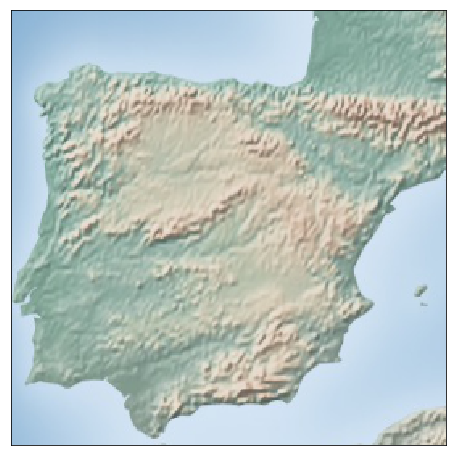

In [305]:
fig = plt.figure(figsize = (8, 8))
m = Basemap(projection = "lcc", lat_0 = 40.4165, lon_0 = -3.70256, width = 1e6, height = 1e6, resolution = "l")
m.shadedrelief();

###### Los Ángeles

Latitud: 34.0194, longitud: -118.411, mapa de 1.000 km de ancho y 2.000 km de alto:

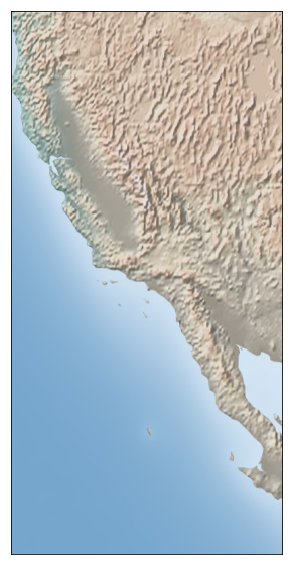

In [306]:
fig = plt.figure(figsize = (5, 10))
m = Basemap(projection = "lcc", lat_0 = 34.0194, lon_0 = -118.411, width = 1e6, height = 2e6, resolution = "l")
m.shadedrelief();

###### Brisbane

Latitud: -27.4679394, longitud: 153.0280914, mapa de 3.000 km de ancho y 2.000 km de alto:

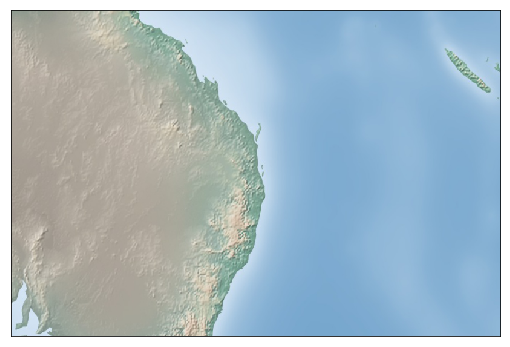

In [307]:
fig = plt.figure(figsize = (9, 6))
m = Basemap(projection = "lcc", lat_0 = -27.4679394, lon_0 = 153.0280914, width = 3e6, height = 2e6, resolution = "l")
m.shadedrelief();

### Visualización de puntos geográficos

Una vez mostrado el mapa usando la capa o capas apropiadas, escogida la proyección adecuada y escalado el mapa para mostrar el área geográfica de interés, frecuentemente querremos mostrar sobre él puntos geográficos en los que estemos interesados.

Para esto podemos trabajar con funciones de visualización de matplotlib.pyplot (como *plt.plot* o *plt.scatter*), en cuyo caso deberemos traducir la latitud y longitud de los puntos a posiciones en la imagen.

Una segunda opción más cómoda es utilizar directamente las coordenadas geográficas de los puntos a mostrar (su latitud y longitud). Para esto tendremos que recurrir a los métodos de visualización proveídos por la clase *Basemap* (como **m.plot** o **m.scatter**), métodos equivalentes a los disponibles en *matplotlib.pyplot*.

Revisemos ambas opciones.

### Funciones de matplotlib.pyplot

Comencemos con un ejemplo sencillo: mostremos un punto en las coordenadas geográficas de Madrid (Latitud: 40.4165000, longitud: -3.7025600). El objeto mapa puede ser utilizado para obtener las posiciones x e y correspondientes a un punto referenciado por su longitud y latitud (en este orden). Así, las coordenadas x e y de Madrid vendrían dadas por:

x, y = m(-3.70256, 40.4165)

Estas coordenadas podría ser pasadas a la función *plt.plot* para mostrar un punto en dichas coordenadas, o a la función *plt.text* para mostrar un texto en dicho lugar:

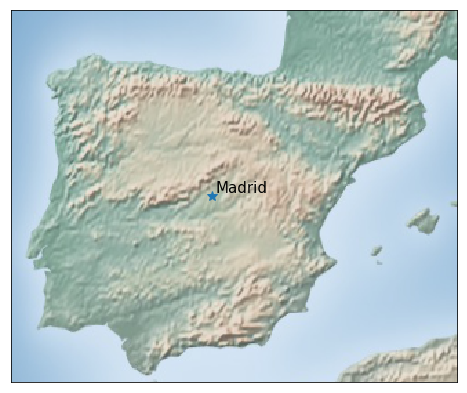

In [308]:
fig = plt.figure(figsize = (8, 8))
m = Basemap(projection = "lcc", lat_0 = 40.4165, lon_0 = -3, width = 1.2e6, height = 1e6, resolution = "l")
m.shadedrelief();
x, y = m(-3.70256, 40.4165)
plt.plot(x, y, "*", markersize = 10);
plt.text(x * 1.02, y * 1.02 , "Madrid", fontsize = 15);

Si quisiéramos generalizar este procedimiento, tendríamos que pasar al objeto m dos argumentos: la lista correspondiente a las longitudes de los puntos a mostrar, y la lista correspondiente a las latitudes de los puntos a mostrar:

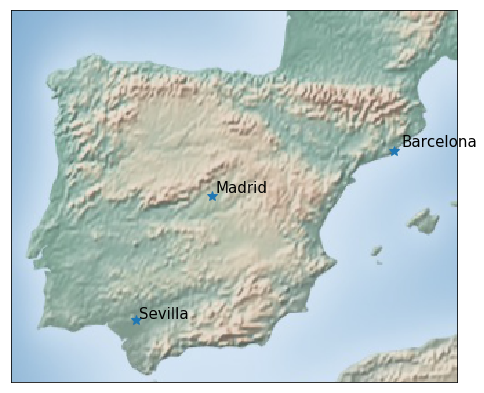

In [309]:
ciudades = ["Madrid", "Barcelona", "Sevilla"]
longitudes = [-3.70256, 2.16488, -5.97317]
latitudes = [40.4165, 41.39225, 37.38283]
fig = plt.figure(figsize = (8, 8))
m = Basemap(projection = "lcc", lat_0 = 40.4165, lon_0 = -3, width = 1.2e6, height = 1e6, resolution = "l")
m.shadedrelief();
x, y = m(longitudes, latitudes)
plt.plot(x, y, "*", markersize = 10);
for i in range(len(x)):
    plt.text(x[i] * 1.02, y[i] * 1.02, ciudades[i], fontsize = 15);

Para probar esta funcionalidad en un conjunto de datos más extenso, vamos a usar el dataset de "California Housing Prices" (disponible para descarga). Una vez cargado como dataframe, podemos ver el aspecto que tiene:

In [310]:
housing = pd.read_csv("california-housing.csv")
housing.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


Para centrar el mapa podemos calcular el punto medio entre las máximas y mínimas longitudes y latitudes, y probar con un cierto ancho y alto del mapa:

In [311]:
mean_longitude = (np.max(housing.longitude) + np.min(housing.longitude))/2
mean_latitude = (np.max(housing.latitude) + np.min(housing.latitude))/2

Para el cálculo de x e y, debemos pasar al objeto m listas o arrays (no acepta series) y para mostrar los puntos podemos recurrir a la función *plt.scatter*, indicando como tamaño del punto la población (escalada) y como color del punto el valor medio de las casas:

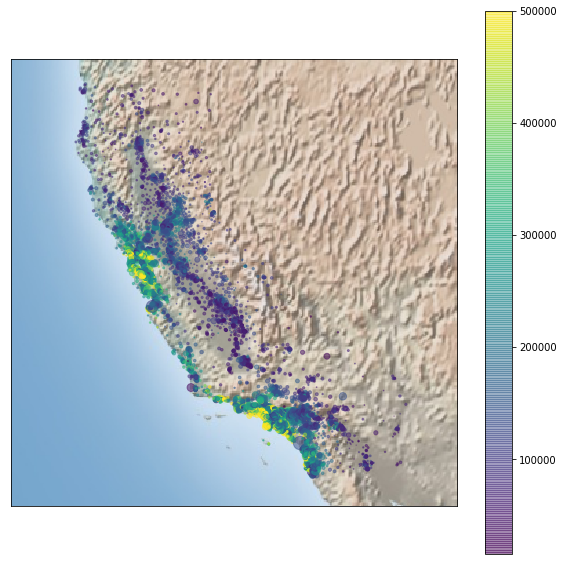

In [312]:
fig = plt.figure(figsize = (10, 10))
m = Basemap(projection = "lcc", lat_0 = mean_latitude, lon_0 = mean_longitude, width = 1.2e6, height = 1.2e6, resolution = "l")
m.shadedrelief();
x, y = m(housing.longitude.values, housing.latitude.values)
plt.scatter(x, y, c = housing.median_house_value, s = housing.population/200, alpha = 0.5);
plt.colorbar();

### Métodos de visualización de Basemap

Sin embargo, esta conversión entre coordenadas geográficas y puntos en la imagen no es necesaria, pues la clase Basemap tiene asociados métodos de visualización semejantes a los disponibles en *matplotlib.pyplot* (por ejemplo **m.plot** o **m.scatter**). Y estos métodos de visualización aceptan listas de coordenadas geográficas si el parámetro **latlon** toma el valor *True*:

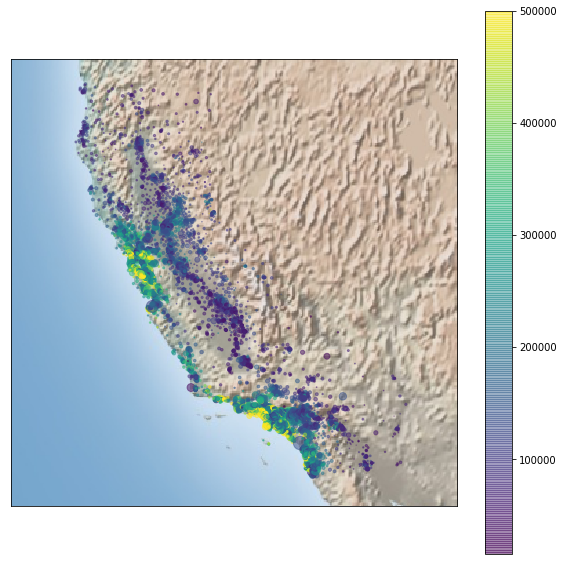

In [313]:
fig = plt.figure(figsize = (10, 10))
m = Basemap(projection = "lcc", lat_0 = mean_latitude, lon_0 = mean_longitude, width = 1.2e6, height = 1.2e6, resolution = "l")
m.shadedrelief();
m.scatter(
    housing.longitude.values, housing.latitude.values,
    c = housing.median_house_value, s = housing.population/200, alpha = 0.5,
    latlon = True);
plt.colorbar();

# Guardando las figuras en disco
<div style = "float:right"><a style="text-decoration:none" href = "#inicio">Inicio</a></div>

https://matplotlib.org/api/_as_gen/matplotlib.pyplot.savefig.html

La función [matplotlib.pyplot.savefig](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.savefig.html) nos permite guardar en disco la figura actual. Esta función debe ser ejecutada antes de la función *plt.show*, y soporta varios parámetros que nos van a permitir configurar la forma en la que se va a realizar el proceso:

* **fname**: el primer parámetro es el nombre que va a recibir el fichero.
* **dpi**: resolución en puntos por pulgada de la imagen generada.
* **quality**: calidad de la imagen en una escala entre 1 (la peor) y 95 (la mejor). Solo aplicable en formatos jpg o jpeg. No deben fijarse valores superiores a 95.
* **orientation**: orientación de la figura ('landscape', 'portrait')
* **format**: formato de la figura (png, pdf, ps, eps, jpg...)

En la documentación disponemos del conjunto completo de parámetros posibles.

# Conclusión
<div style = "float:right"><a style="text-decoration:none" href = "#inicio">Inicio</a></div>

Aun cuando es cierto que la interfaz de matplotlib puede considerarse no tan amigable como la de otras librerías, y aun considerando que el esfuerzo que supone conseguir un aspecto atractivo en las gráficas es superior a lo deseado -otras librerías ofrecen sin ningún esfuerzo resultados más atrayentes-, matplotlib sigue siendo la referencia de las librerías de visualización en Python. Aunque solo hemos visto una fracción de las herramientas ofrecidas por ella, resulta obvio que se trata de una librería muy potente, que resulta necesario conocer aun cuando se trabaje con librerías de más alto nivel construídas sobre ella, y a la que es posible extraer buena parte de su potencial con apenas conocimientos básicos de las principales herramientas. Y es en esta dirección en la que se ha estructurado esta documentación.